### Section 1: Data Read-In

Effectively the same as in the andrew_bag_of_words file, except loads in the data directly as a dataframe rather than using json + transform.

In [1]:
import csv, os, pandas as pd, pathlib, pprint, json, numpy as np
import bagOfWords as bow
from sklearn.feature_extraction.text import CountVectorizer

In [2]:
# Make sure json training json file exists

data_directory = os.path.join(os.getcwd(), "Dataset")
train_data_file_path = os.path.join(data_directory, "train.json")

if(not pathlib.Path(train_data_file_path).is_file()):
    raise Exception("Missing train.json file in " + data_directory)

In [3]:
# Read JSON training data

with open(train_data_file_path, 'r') as f:
     trainData = pd.read_json(f)
f.closed

trainData.head()

,cuisine,id,ingredients
0,greek,10259,"[romaine lettuce, black olives, grape tomatoes..."
1,southern_us,25693,"[plain flour, ground pepper, salt, tomatoes, g..."
2,filipino,20130,"[eggs, pepper, salt, mayonaise, cooking oil, g..."
3,indian,22213,"[water, vegetable oil, wheat, salt]"
4,indian,13162,"[black pepper, shallots, cornflour, cayenne pe..."


In [4]:
trainData.shape

(39774, 3)

### Section 2: Analysis & Visualisation

In [5]:
%matplotlib inline

In [6]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

Visualising the recipe counts by cuisine.

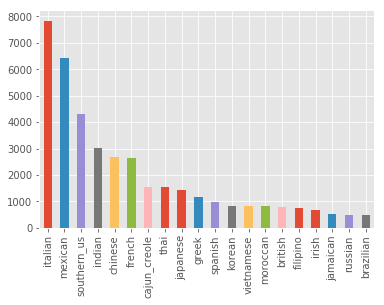

In [7]:
trainData['cuisine'].value_counts().plot(kind='bar')

Creating a table showing the 10 most common ingredients for each cuisine.

In [8]:
from collections import Counter

counters = {}
for cuisine in trainData['cuisine'].unique():
    counters[cuisine] = Counter()
    indices = (trainData['cuisine'] == cuisine)
    for ingredients in trainData[indices]['ingredients']:
        counters[cuisine].update(ingredients)

In [9]:
top10 = pd.DataFrame([[items[0] for items in counters[cuisine].most_common(10)] for cuisine in counters],
            index=[cuisine for cuisine in counters],
            columns=['top{}'.format(i) for i in range(1, 11)])
top10

,top1,top2,top3,top4,top5,top6,top7,top8,top9,top10
greek,salt,olive oil,dried oregano,garlic cloves,feta cheese crumbles,extra-virgin olive oil,fresh lemon juice,ground black pepper,garlic,pepper
southern_us,salt,butter,all-purpose flour,sugar,large eggs,baking powder,water,unsalted butter,milk,buttermilk
filipino,salt,garlic,water,onions,soy sauce,pepper,oil,sugar,carrots,ground black pepper
indian,salt,onions,garam masala,water,ground turmeric,garlic,cumin seed,ground cumin,vegetable oil,oil
jamaican,salt,onions,water,garlic,ground allspice,pepper,scallions,dried thyme,black pepper,garlic cloves
spanish,salt,olive oil,garlic cloves,extra-virgin olive oil,onions,water,tomatoes,ground black pepper,red bell pepper,pepper
italian,salt,olive oil,garlic cloves,grated parmesan cheese,garlic,ground black pepper,extra-virgin olive oil,onions,water,butter
mexican,salt,onions,ground cumin,garlic,olive oil,chili powder,jalapeno chilies,sour cream,avocado,corn tortillas
chinese,soy sauce,sesame oil,salt,corn starch,sugar,garlic,water,green onions,vegetable oil,scallions
british,salt,all-purpose flour,butter,milk,eggs,unsalted butter,sugar,onions,baking powder,large eggs


We can see from the above that the presence of salt tells us very little, but something like fish sauce can narrow down the probable cuisines considerably. To see how big this effect is, we visualise the percentage of recipes that our most common ingredients are found in, for each cuisine.

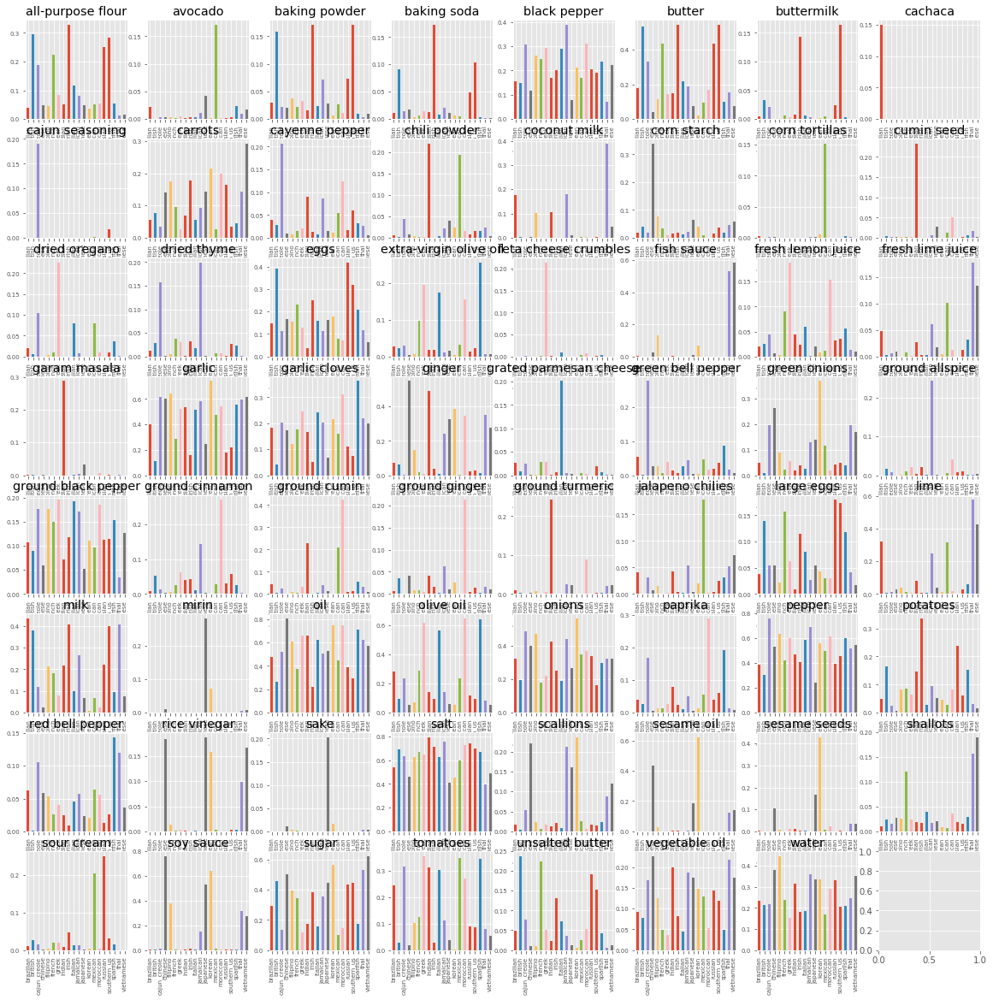

In [10]:
import numpy as np

unique = np.unique(top10.values.ravel())
trainData['all_ingredients'] = trainData['ingredients'].map(";".join)

fig, axes = plt.subplots(8, 8, figsize=(20, 20))
for ingredient, ax_index in zip(unique, range(64)):
    indices = trainData['all_ingredients'].str.contains(ingredient)
    #indices = any(ingredient in s for s in trainData['ingredients'])
    relative_freq = (trainData[indices]['cuisine'].value_counts() / trainData['cuisine'].value_counts())
    relative_freq.plot(kind='bar', ax=axes.ravel()[ax_index], fontsize=7, title=ingredient)


This indicates the above statement in a more understandable form - ingredients like water, butter and oil don't do much to differentiate between cuisines, whereas sake, feta cheese and garam masala are exceptionally informative.

This is, perhaps, not too surprising, and does indicate that a Naive Bayes classifier should perform very well on this dataset. 

### Section 3: Classifier Implementation

On the single fold of data tested (seed=37), the six classifiers implemented below achieved the following accuracy. Benchmarks are shown in brackets:

**KNN** - 64.44% *(60.75)* <br>
**Decision Tree** - 63.78% *(62.59)* <br>
**Naive Bayes** - 72.57% *(73.25)* <br>
**Random Forest** - 71.16% *(74.13)* <br>
**Logistic Regression** - 78.37% *(81.25)* <br>
**SVM (LinearSVC)** - 77.05% *(81.32)* <br>

For reference, on the test set a score of 82.07% would have been sufficient for a Top-10 placement, while the competition winner scored 83.02%.

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

X_train_splitagain, X_test_splitagain, y_train_splitagain, y_test_splitagain = train_test_split(trainData['all_ingredients'], trainData['cuisine'], test_size=0.2, random_state=37)

#### At this point we are splitting all of the ingredients into single words and counting occurrences


In [12]:
cv = CountVectorizer()
X_train_vec = cv.fit_transform(X_train_splitagain.values)
X_test_vec = cv.transform(X_test_splitagain.values)
X_train_vec.shape

(31819, 2918)

In [81]:
X_test_vec.shape

(7955, 2918)

In [13]:
# There are 2,918 unique words

In [14]:
print(list(cv.vocabulary_.keys())[:100])

['tomato', 'sauce', 'ground', 'black', 'pepper', 'garlic', 'scallions', 'chipotles', 'in', 'adobo', 'avocado', 'dried', 'thyme', 'instant', 'white', 'rice', 'cilantro', 'leaves', 'coconut', 'milk', 'water', 'red', 'beans', 'chopped', 'celery', 'skinless', 'chicken', 'thighs', 'onions', 'lime', 'zest', 'juice', 'wedges', 'salt', 'carrots', 'coarse', 'fresh', 'mint', 'soy', 'freshly', 'clarified', 'butter', 'phyllo', 'dough', 'baby', 'spinach', 'flat', 'leaf', 'parsley', 'olive', 'oil', 'long', 'grain', 'solid', 'tuna', 'feta', 'cheese', 'crumbles', 'pinenuts', 'linguine', 'basil', 'extra', 'virgin', 'sun', 'tomatoes', 'sliced', 'olives', 'cloves', 'balsamic', 'vinegar', 'bell', 'bay', 'purple', 'onion', 'flakes', 'arugula', 'shelled', 'pistachios', 'sea', 'bacon', 'diced', 'artichoke', 'hearts', 'pitted', 'rosemary', 'boneless', 'breast', 'brown', 'sugar', 'flour', 'tortillas', 'whole', 'kernel', 'corn', 'drain', 'finely', 'salsa', 'shredded', 'monterey', 'jack']


Lastly it's worth checking our validation fold has a representative number of each cuisine in the set. We will of course perform later refolding and validation, but don't want to invalidate the results we'll be commenting on. The graph appears to be showing roughly the same proportions as present in the initial trainData set, so we can proceed.

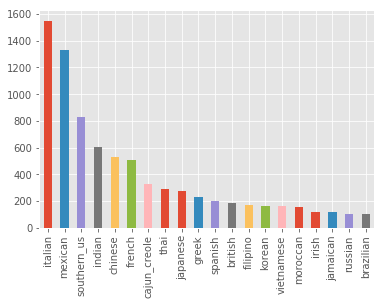

In [15]:
y_test_splitagain.value_counts().plot(kind='bar')

In [16]:
#this is for the classification report y labels
cuisines = trainData['cuisine'].value_counts(sort=False).index

#this is for the classification report y target_names
cuisineslist = cuisines.tolist()

#### Section 3.5: Logistic Regression Classifer

In [17]:
from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression()
mylogistic_fit = logistic.fit(X_train_vec, y_train_splitagain)

logistic.score(X_test_vec, y_test_splitagain)

0.7836580766813325

Text(0.5,64.6,'Predicted label')

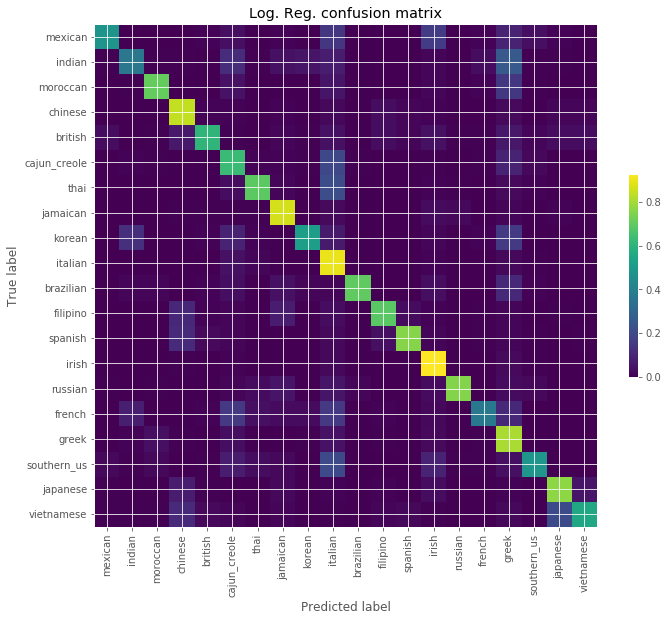

In [18]:
plt.figure(figsize=(10, 10))

log_cm = confusion_matrix(y_test_splitagain, logistic.predict(X_test_vec))
log_cm_normalized = log_cm.astype('float') / log_cm.sum(axis=1)[:, np.newaxis]

plt.imshow(log_cm_normalized, interpolation='nearest')
plt.title("Log. Reg. confusion matrix")
plt.colorbar(shrink=0.3)

tick_marks = np.arange(len(cuisines))
plt.xticks(tick_marks, cuisines, rotation=90)
plt.yticks(tick_marks, cuisines)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [19]:
log_pred = logistic.predict(X_test_vec)
print(classification_report(y_test_splitagain, log_pred, labels = cuisines, target_names=cuisineslist))

              precision    recall  f1-score   support

     mexican       0.90      0.93      0.91      1331
      indian       0.87      0.87      0.87       605
    moroccan       0.86      0.76      0.80       152
     chinese       0.80      0.84      0.82       529
     british       0.62      0.37      0.46       184
cajun_creole       0.82      0.71      0.76       327
        thai       0.78      0.77      0.78       292
    jamaican       0.91      0.70      0.79       117
      korean       0.82      0.76      0.79       165
     italian       0.79      0.90      0.84      1550
   brazilian       0.73      0.48      0.58       102
    filipino       0.77      0.61      0.68       171
     spanish       0.69      0.48      0.57       201
       irish       0.68      0.52      0.59       121
     russian       0.60      0.38      0.46       104
      french       0.59      0.63      0.61       508
       greek       0.78      0.69      0.73       229
 southern_us       0.68    

#### Section 3.5a: Logistic Regression Classifer deep analysis

In [168]:
type(logistic)

sklearn.linear_model.logistic.LogisticRegression

In [169]:
type(log_pred)

numpy.ndarray

In [170]:
print(log_pred)

['indian' 'italian' 'southern_us' ... 'chinese' 'filipino' 'southern_us']


In [171]:
# we have predicted the cuisine of these 7955 test recipes
print(len(log_pred))

7955


In [172]:
#cuisine labels for the test set
print(y_test_splitagain.head())

2066          chinese
21349         italian
25575    cajun_creole
128           british
30155         italian
Name: cuisine, dtype: object


In [26]:
#simply create a list of incorrect and correct predictions and also store these by cuisine

In [52]:
keepmyplace=0
keepmywrongpredictions=[]
keepmywrongpredictions_bycuisine={}
keepmycorrectpredictions_bycuisine={}

for acuisine in cuisineslist:
    keepmywrongpredictions_bycuisine[acuisine]=[]
    keepmycorrectpredictions_bycuisine[acuisine]=[]

for item,itemcuisine in y_test_splitagain.items():
    print(keepmyplace)
    print("my recipe and its labelled cuisine")
    print(item, itemcuisine)
    print("predicted cuisine")
    print(log_pred[keepmyplace])
    if itemcuisine != log_pred[keepmyplace]:
        print("arggg this is wrong")
        print(item)
        keepmywrongpredictions.append(item)
        correct_vs_prediction = item, itemcuisine, log_pred[keepmyplace]
        keepmywrongpredictions_bycuisine[itemcuisine].append(correct_vs_prediction)
    else:
        correct_prediction = item, itemcuisine
        keepmycorrectpredictions_bycuisine[itemcuisine].append(correct_prediction)
    keepmyplace+=1

0
my recipe and its labelled cuisine
2066 chinese
predicted cuisine
indian
arggg this is wrong
2066
1
my recipe and its labelled cuisine
21349 italian
predicted cuisine
italian
2
my recipe and its labelled cuisine
25575 cajun_creole
predicted cuisine
southern_us
arggg this is wrong
25575
3
my recipe and its labelled cuisine
128 british
predicted cuisine
british
4
my recipe and its labelled cuisine
30155 italian
predicted cuisine
italian
5
my recipe and its labelled cuisine
14361 indian
predicted cuisine
indian
6
my recipe and its labelled cuisine
33302 chinese
predicted cuisine
chinese
7
my recipe and its labelled cuisine
5526 thai
predicted cuisine
chinese
arggg this is wrong
5526
8
my recipe and its labelled cuisine
34794 southern_us
predicted cuisine
chinese
arggg this is wrong
34794
9
my recipe and its labelled cuisine
30506 italian
predicted cuisine
italian
10
my recipe and its labelled cuisine
34688 italian
predicted cuisine
italian
11
my recipe and its labelled cuisine
12609 mex

moroccan
300
my recipe and its labelled cuisine
32218 mexican
predicted cuisine
mexican
301
my recipe and its labelled cuisine
33563 greek
predicted cuisine
italian
arggg this is wrong
33563
302
my recipe and its labelled cuisine
38106 chinese
predicted cuisine
chinese
303
my recipe and its labelled cuisine
20729 mexican
predicted cuisine
mexican
304
my recipe and its labelled cuisine
1803 southern_us
predicted cuisine
southern_us
305
my recipe and its labelled cuisine
24398 mexican
predicted cuisine
italian
arggg this is wrong
24398
306
my recipe and its labelled cuisine
7005 indian
predicted cuisine
indian
307
my recipe and its labelled cuisine
28276 cajun_creole
predicted cuisine
cajun_creole
308
my recipe and its labelled cuisine
9461 italian
predicted cuisine
italian
309
my recipe and its labelled cuisine
36046 korean
predicted cuisine
korean
310
my recipe and its labelled cuisine
27970 southern_us
predicted cuisine
southern_us
311
my recipe and its labelled cuisine
34405 southern

24413 italian
predicted cuisine
italian
535
my recipe and its labelled cuisine
17223 indian
predicted cuisine
indian
536
my recipe and its labelled cuisine
11682 mexican
predicted cuisine
mexican
537
my recipe and its labelled cuisine
20893 italian
predicted cuisine
italian
538
my recipe and its labelled cuisine
23221 italian
predicted cuisine
italian
539
my recipe and its labelled cuisine
37234 indian
predicted cuisine
indian
540
my recipe and its labelled cuisine
13123 spanish
predicted cuisine
mexican
arggg this is wrong
13123
541
my recipe and its labelled cuisine
12963 chinese
predicted cuisine
southern_us
arggg this is wrong
12963
542
my recipe and its labelled cuisine
25232 russian
predicted cuisine
southern_us
arggg this is wrong
25232
543
my recipe and its labelled cuisine
20951 brazilian
predicted cuisine
brazilian
544
my recipe and its labelled cuisine
25383 spanish
predicted cuisine
french
arggg this is wrong
25383
545
my recipe and its labelled cuisine
24134 french
predict

predicted cuisine
indian
766
my recipe and its labelled cuisine
25496 italian
predicted cuisine
italian
767
my recipe and its labelled cuisine
25144 italian
predicted cuisine
cajun_creole
arggg this is wrong
25144
768
my recipe and its labelled cuisine
13324 southern_us
predicted cuisine
southern_us
769
my recipe and its labelled cuisine
7075 korean
predicted cuisine
chinese
arggg this is wrong
7075
770
my recipe and its labelled cuisine
29858 southern_us
predicted cuisine
southern_us
771
my recipe and its labelled cuisine
39081 chinese
predicted cuisine
chinese
772
my recipe and its labelled cuisine
27044 spanish
predicted cuisine
spanish
773
my recipe and its labelled cuisine
37717 southern_us
predicted cuisine
southern_us
774
my recipe and its labelled cuisine
36752 mexican
predicted cuisine
mexican
775
my recipe and its labelled cuisine
21050 greek
predicted cuisine
spanish
arggg this is wrong
21050
776
my recipe and its labelled cuisine
20220 italian
predicted cuisine
italian
777


mexican
994
my recipe and its labelled cuisine
13388 italian
predicted cuisine
italian
995
my recipe and its labelled cuisine
16788 italian
predicted cuisine
italian
996
my recipe and its labelled cuisine
3008 filipino
predicted cuisine
filipino
997
my recipe and its labelled cuisine
24462 italian
predicted cuisine
italian
998
my recipe and its labelled cuisine
12602 cajun_creole
predicted cuisine
italian
arggg this is wrong
12602
999
my recipe and its labelled cuisine
31686 italian
predicted cuisine
italian
1000
my recipe and its labelled cuisine
29712 french
predicted cuisine
italian
arggg this is wrong
29712
1001
my recipe and its labelled cuisine
30859 mexican
predicted cuisine
mexican
1002
my recipe and its labelled cuisine
4532 italian
predicted cuisine
french
arggg this is wrong
4532
1003
my recipe and its labelled cuisine
12060 french
predicted cuisine
french
1004
my recipe and its labelled cuisine
6860 british
predicted cuisine
french
arggg this is wrong
6860
1005
my recipe an

24614 mexican
predicted cuisine
mexican
1227
my recipe and its labelled cuisine
23413 italian
predicted cuisine
southern_us
arggg this is wrong
23413
1228
my recipe and its labelled cuisine
6814 mexican
predicted cuisine
mexican
1229
my recipe and its labelled cuisine
13827 chinese
predicted cuisine
chinese
1230
my recipe and its labelled cuisine
17409 greek
predicted cuisine
greek
1231
my recipe and its labelled cuisine
37450 filipino
predicted cuisine
filipino
1232
my recipe and its labelled cuisine
19337 italian
predicted cuisine
italian
1233
my recipe and its labelled cuisine
37079 southern_us
predicted cuisine
southern_us
1234
my recipe and its labelled cuisine
18771 french
predicted cuisine
french
1235
my recipe and its labelled cuisine
31078 greek
predicted cuisine
greek
1236
my recipe and its labelled cuisine
26414 greek
predicted cuisine
greek
1237
my recipe and its labelled cuisine
14667 mexican
predicted cuisine
mexican
1238
my recipe and its labelled cuisine
1224 greek
pred

21120 southern_us
predicted cuisine
southern_us
1462
my recipe and its labelled cuisine
27390 brazilian
predicted cuisine
mexican
arggg this is wrong
27390
1463
my recipe and its labelled cuisine
21715 vietnamese
predicted cuisine
brazilian
arggg this is wrong
21715
1464
my recipe and its labelled cuisine
4753 french
predicted cuisine
southern_us
arggg this is wrong
4753
1465
my recipe and its labelled cuisine
3659 italian
predicted cuisine
french
arggg this is wrong
3659
1466
my recipe and its labelled cuisine
28967 brazilian
predicted cuisine
brazilian
1467
my recipe and its labelled cuisine
1796 spanish
predicted cuisine
spanish
1468
my recipe and its labelled cuisine
34684 brazilian
predicted cuisine
brazilian
1469
my recipe and its labelled cuisine
4758 mexican
predicted cuisine
mexican
1470
my recipe and its labelled cuisine
8372 chinese
predicted cuisine
chinese
1471
my recipe and its labelled cuisine
38822 indian
predicted cuisine
indian
1472
my recipe and its labelled cuisine


1694
my recipe and its labelled cuisine
25587 cajun_creole
predicted cuisine
cajun_creole
1695
my recipe and its labelled cuisine
714 cajun_creole
predicted cuisine
southern_us
arggg this is wrong
714
1696
my recipe and its labelled cuisine
3730 indian
predicted cuisine
indian
1697
my recipe and its labelled cuisine
34718 southern_us
predicted cuisine
italian
arggg this is wrong
34718
1698
my recipe and its labelled cuisine
21704 filipino
predicted cuisine
filipino
1699
my recipe and its labelled cuisine
16051 italian
predicted cuisine
italian
1700
my recipe and its labelled cuisine
29378 spanish
predicted cuisine
spanish
1701
my recipe and its labelled cuisine
39167 italian
predicted cuisine
italian
1702
my recipe and its labelled cuisine
10117 italian
predicted cuisine
italian
1703
my recipe and its labelled cuisine
11529 mexican
predicted cuisine
mexican
1704
my recipe and its labelled cuisine
10217 mexican
predicted cuisine
mexican
1705
my recipe and its labelled cuisine
17325 mexi

japanese
1929
my recipe and its labelled cuisine
35898 chinese
predicted cuisine
chinese
1930
my recipe and its labelled cuisine
38718 mexican
predicted cuisine
mexican
1931
my recipe and its labelled cuisine
5769 indian
predicted cuisine
indian
1932
my recipe and its labelled cuisine
26661 cajun_creole
predicted cuisine
cajun_creole
1933
my recipe and its labelled cuisine
19379 mexican
predicted cuisine
mexican
1934
my recipe and its labelled cuisine
30958 mexican
predicted cuisine
mexican
1935
my recipe and its labelled cuisine
22110 southern_us
predicted cuisine
southern_us
1936
my recipe and its labelled cuisine
24112 french
predicted cuisine
french
1937
my recipe and its labelled cuisine
33802 southern_us
predicted cuisine
southern_us
1938
my recipe and its labelled cuisine
38744 italian
predicted cuisine
southern_us
arggg this is wrong
38744
1939
my recipe and its labelled cuisine
420 cajun_creole
predicted cuisine
cajun_creole
1940
my recipe and its labelled cuisine
25843 southe

34354 italian
predicted cuisine
italian
2165
my recipe and its labelled cuisine
20616 italian
predicted cuisine
italian
2166
my recipe and its labelled cuisine
21153 italian
predicted cuisine
italian
2167
my recipe and its labelled cuisine
832 mexican
predicted cuisine
mexican
2168
my recipe and its labelled cuisine
18440 russian
predicted cuisine
french
arggg this is wrong
18440
2169
my recipe and its labelled cuisine
26440 italian
predicted cuisine
italian
2170
my recipe and its labelled cuisine
12688 thai
predicted cuisine
thai
2171
my recipe and its labelled cuisine
13841 italian
predicted cuisine
italian
2172
my recipe and its labelled cuisine
6723 vietnamese
predicted cuisine
vietnamese
2173
my recipe and its labelled cuisine
4764 italian
predicted cuisine
italian
2174
my recipe and its labelled cuisine
38953 italian
predicted cuisine
italian
2175
my recipe and its labelled cuisine
16069 thai
predicted cuisine
thai
2176
my recipe and its labelled cuisine
3841 mexican
predicted cu

2399
my recipe and its labelled cuisine
32669 cajun_creole
predicted cuisine
southern_us
arggg this is wrong
32669
2400
my recipe and its labelled cuisine
31063 mexican
predicted cuisine
mexican
2401
my recipe and its labelled cuisine
16661 chinese
predicted cuisine
chinese
2402
my recipe and its labelled cuisine
7130 thai
predicted cuisine
thai
2403
my recipe and its labelled cuisine
39060 indian
predicted cuisine
indian
2404
my recipe and its labelled cuisine
31983 italian
predicted cuisine
italian
2405
my recipe and its labelled cuisine
25268 french
predicted cuisine
french
2406
my recipe and its labelled cuisine
2607 italian
predicted cuisine
italian
2407
my recipe and its labelled cuisine
20088 southern_us
predicted cuisine
irish
arggg this is wrong
20088
2408
my recipe and its labelled cuisine
2254 french
predicted cuisine
french
2409
my recipe and its labelled cuisine
17555 italian
predicted cuisine
italian
2410
my recipe and its labelled cuisine
13885 italian
predicted cuisine


predicted cuisine
southern_us
arggg this is wrong
36409
2631
my recipe and its labelled cuisine
18242 thai
predicted cuisine
chinese
arggg this is wrong
18242
2632
my recipe and its labelled cuisine
2668 spanish
predicted cuisine
southern_us
arggg this is wrong
2668
2633
my recipe and its labelled cuisine
36368 irish
predicted cuisine
irish
2634
my recipe and its labelled cuisine
18112 chinese
predicted cuisine
chinese
2635
my recipe and its labelled cuisine
13798 cajun_creole
predicted cuisine
cajun_creole
2636
my recipe and its labelled cuisine
17205 korean
predicted cuisine
korean
2637
my recipe and its labelled cuisine
8337 indian
predicted cuisine
indian
2638
my recipe and its labelled cuisine
25136 spanish
predicted cuisine
mexican
arggg this is wrong
25136
2639
my recipe and its labelled cuisine
23626 mexican
predicted cuisine
mexican
2640
my recipe and its labelled cuisine
1973 italian
predicted cuisine
italian
2641
my recipe and its labelled cuisine
39314 chinese
predicted cui

8526 southern_us
predicted cuisine
southern_us
2861
my recipe and its labelled cuisine
35496 southern_us
predicted cuisine
southern_us
2862
my recipe and its labelled cuisine
2943 mexican
predicted cuisine
mexican
2863
my recipe and its labelled cuisine
33905 russian
predicted cuisine
russian
2864
my recipe and its labelled cuisine
16659 chinese
predicted cuisine
chinese
2865
my recipe and its labelled cuisine
1490 mexican
predicted cuisine
mexican
2866
my recipe and its labelled cuisine
5130 indian
predicted cuisine
indian
2867
my recipe and its labelled cuisine
4497 italian
predicted cuisine
italian
2868
my recipe and its labelled cuisine
21694 chinese
predicted cuisine
chinese
2869
my recipe and its labelled cuisine
10323 italian
predicted cuisine
italian
2870
my recipe and its labelled cuisine
10333 irish
predicted cuisine
irish
2871
my recipe and its labelled cuisine
11912 italian
predicted cuisine
italian
2872
my recipe and its labelled cuisine
35058 french
predicted cuisine
ital

27861 mexican
predicted cuisine
mexican
3096
my recipe and its labelled cuisine
2599 chinese
predicted cuisine
japanese
arggg this is wrong
2599
3097
my recipe and its labelled cuisine
30343 mexican
predicted cuisine
southern_us
arggg this is wrong
30343
3098
my recipe and its labelled cuisine
15142 italian
predicted cuisine
italian
3099
my recipe and its labelled cuisine
31719 british
predicted cuisine
french
arggg this is wrong
31719
3100
my recipe and its labelled cuisine
39695 greek
predicted cuisine
greek
3101
my recipe and its labelled cuisine
35686 greek
predicted cuisine
italian
arggg this is wrong
35686
3102
my recipe and its labelled cuisine
28956 southern_us
predicted cuisine
southern_us
3103
my recipe and its labelled cuisine
28533 british
predicted cuisine
italian
arggg this is wrong
28533
3104
my recipe and its labelled cuisine
5973 french
predicted cuisine
french
3105
my recipe and its labelled cuisine
20847 korean
predicted cuisine
russian
arggg this is wrong
20847
3106

37294 southern_us
predicted cuisine
cajun_creole
arggg this is wrong
37294
3329
my recipe and its labelled cuisine
22109 french
predicted cuisine
french
3330
my recipe and its labelled cuisine
37714 japanese
predicted cuisine
japanese
3331
my recipe and its labelled cuisine
9545 mexican
predicted cuisine
mexican
3332
my recipe and its labelled cuisine
39294 southern_us
predicted cuisine
southern_us
3333
my recipe and its labelled cuisine
11258 mexican
predicted cuisine
mexican
3334
my recipe and its labelled cuisine
34513 french
predicted cuisine
french
3335
my recipe and its labelled cuisine
14350 irish
predicted cuisine
irish
3336
my recipe and its labelled cuisine
28988 thai
predicted cuisine
thai
3337
my recipe and its labelled cuisine
15227 chinese
predicted cuisine
chinese
3338
my recipe and its labelled cuisine
14160 spanish
predicted cuisine
british
arggg this is wrong
14160
3339
my recipe and its labelled cuisine
28664 mexican
predicted cuisine
mexican
3340
my recipe and its l

predicted cuisine
thai
3562
my recipe and its labelled cuisine
12944 spanish
predicted cuisine
cajun_creole
arggg this is wrong
12944
3563
my recipe and its labelled cuisine
31589 spanish
predicted cuisine
mexican
arggg this is wrong
31589
3564
my recipe and its labelled cuisine
24034 italian
predicted cuisine
italian
3565
my recipe and its labelled cuisine
24385 japanese
predicted cuisine
japanese
3566
my recipe and its labelled cuisine
35320 italian
predicted cuisine
italian
3567
my recipe and its labelled cuisine
36 italian
predicted cuisine
italian
3568
my recipe and its labelled cuisine
6826 mexican
predicted cuisine
mexican
3569
my recipe and its labelled cuisine
38936 southern_us
predicted cuisine
cajun_creole
arggg this is wrong
38936
3570
my recipe and its labelled cuisine
36785 cajun_creole
predicted cuisine
cajun_creole
3571
my recipe and its labelled cuisine
21633 italian
predicted cuisine
italian
3572
my recipe and its labelled cuisine
11138 spanish
predicted cuisine
spani

30672 southern_us
predicted cuisine
southern_us
3794
my recipe and its labelled cuisine
33781 italian
predicted cuisine
italian
3795
my recipe and its labelled cuisine
29729 greek
predicted cuisine
southern_us
arggg this is wrong
29729
3796
my recipe and its labelled cuisine
36792 italian
predicted cuisine
indian
arggg this is wrong
36792
3797
my recipe and its labelled cuisine
29553 irish
predicted cuisine
southern_us
arggg this is wrong
29553
3798
my recipe and its labelled cuisine
23637 moroccan
predicted cuisine
moroccan
3799
my recipe and its labelled cuisine
36466 japanese
predicted cuisine
chinese
arggg this is wrong
36466
3800
my recipe and its labelled cuisine
34526 southern_us
predicted cuisine
southern_us
3801
my recipe and its labelled cuisine
6191 indian
predicted cuisine
indian
3802
my recipe and its labelled cuisine
18152 indian
predicted cuisine
chinese
arggg this is wrong
18152
3803
my recipe and its labelled cuisine
3579 cajun_creole
predicted cuisine
cajun_creole
380

8207 chinese
predicted cuisine
chinese
4027
my recipe and its labelled cuisine
627 mexican
predicted cuisine
mexican
4028
my recipe and its labelled cuisine
19862 cajun_creole
predicted cuisine
cajun_creole
4029
my recipe and its labelled cuisine
36103 mexican
predicted cuisine
mexican
4030
my recipe and its labelled cuisine
5001 japanese
predicted cuisine
japanese
4031
my recipe and its labelled cuisine
37519 cajun_creole
predicted cuisine
cajun_creole
4032
my recipe and its labelled cuisine
33025 southern_us
predicted cuisine
southern_us
4033
my recipe and its labelled cuisine
29735 french
predicted cuisine
southern_us
arggg this is wrong
29735
4034
my recipe and its labelled cuisine
25386 greek
predicted cuisine
spanish
arggg this is wrong
25386
4035
my recipe and its labelled cuisine
16150 moroccan
predicted cuisine
greek
arggg this is wrong
16150
4036
my recipe and its labelled cuisine
33319 japanese
predicted cuisine
filipino
arggg this is wrong
33319
4037
my recipe and its label

31492 mexican
predicted cuisine
mexican
4261
my recipe and its labelled cuisine
27701 southern_us
predicted cuisine
southern_us
4262
my recipe and its labelled cuisine
1778 jamaican
predicted cuisine
jamaican
4263
my recipe and its labelled cuisine
11665 chinese
predicted cuisine
chinese
4264
my recipe and its labelled cuisine
12555 british
predicted cuisine
irish
arggg this is wrong
12555
4265
my recipe and its labelled cuisine
16837 mexican
predicted cuisine
mexican
4266
my recipe and its labelled cuisine
31998 brazilian
predicted cuisine
brazilian
4267
my recipe and its labelled cuisine
34442 french
predicted cuisine
french
4268
my recipe and its labelled cuisine
30198 chinese
predicted cuisine
chinese
4269
my recipe and its labelled cuisine
37113 french
predicted cuisine
french
4270
my recipe and its labelled cuisine
4031 southern_us
predicted cuisine
southern_us
4271
my recipe and its labelled cuisine
18040 cajun_creole
predicted cuisine
cajun_creole
4272
my recipe and its labelle

predicted cuisine
french
arggg this is wrong
16318
4492
my recipe and its labelled cuisine
3764 indian
predicted cuisine
indian
4493
my recipe and its labelled cuisine
28001 jamaican
predicted cuisine
jamaican
4494
my recipe and its labelled cuisine
16989 italian
predicted cuisine
italian
4495
my recipe and its labelled cuisine
12666 chinese
predicted cuisine
chinese
4496
my recipe and its labelled cuisine
30032 french
predicted cuisine
french
4497
my recipe and its labelled cuisine
9712 cajun_creole
predicted cuisine
cajun_creole
4498
my recipe and its labelled cuisine
14308 french
predicted cuisine
italian
arggg this is wrong
14308
4499
my recipe and its labelled cuisine
36029 french
predicted cuisine
french
4500
my recipe and its labelled cuisine
18603 mexican
predicted cuisine
mexican
4501
my recipe and its labelled cuisine
23996 greek
predicted cuisine
southern_us
arggg this is wrong
23996
4502
my recipe and its labelled cuisine
35282 mexican
predicted cuisine
mexican
4503
my reci

mexican
4726
my recipe and its labelled cuisine
4333 chinese
predicted cuisine
chinese
4727
my recipe and its labelled cuisine
68 french
predicted cuisine
southern_us
arggg this is wrong
68
4728
my recipe and its labelled cuisine
30104 southern_us
predicted cuisine
southern_us
4729
my recipe and its labelled cuisine
9947 indian
predicted cuisine
indian
4730
my recipe and its labelled cuisine
7082 mexican
predicted cuisine
mexican
4731
my recipe and its labelled cuisine
28352 british
predicted cuisine
british
4732
my recipe and its labelled cuisine
10796 vietnamese
predicted cuisine
korean
arggg this is wrong
10796
4733
my recipe and its labelled cuisine
25455 southern_us
predicted cuisine
southern_us
4734
my recipe and its labelled cuisine
27405 indian
predicted cuisine
indian
4735
my recipe and its labelled cuisine
21781 italian
predicted cuisine
italian
4736
my recipe and its labelled cuisine
4150 greek
predicted cuisine
greek
4737
my recipe and its labelled cuisine
1434 french
predi

southern_us
4962
my recipe and its labelled cuisine
902 italian
predicted cuisine
italian
4963
my recipe and its labelled cuisine
9904 moroccan
predicted cuisine
moroccan
4964
my recipe and its labelled cuisine
37080 french
predicted cuisine
french
4965
my recipe and its labelled cuisine
20139 italian
predicted cuisine
italian
4966
my recipe and its labelled cuisine
14555 southern_us
predicted cuisine
southern_us
4967
my recipe and its labelled cuisine
11980 italian
predicted cuisine
italian
4968
my recipe and its labelled cuisine
18937 southern_us
predicted cuisine
southern_us
4969
my recipe and its labelled cuisine
4603 italian
predicted cuisine
italian
4970
my recipe and its labelled cuisine
35212 greek
predicted cuisine
greek
4971
my recipe and its labelled cuisine
2630 mexican
predicted cuisine
mexican
4972
my recipe and its labelled cuisine
603 italian
predicted cuisine
italian
4973
my recipe and its labelled cuisine
29823 italian
predicted cuisine
italian
4974
my recipe and its 

predicted cuisine
mexican
5195
my recipe and its labelled cuisine
21446 indian
predicted cuisine
indian
5196
my recipe and its labelled cuisine
39087 filipino
predicted cuisine
filipino
5197
my recipe and its labelled cuisine
11807 indian
predicted cuisine
indian
5198
my recipe and its labelled cuisine
11359 moroccan
predicted cuisine
spanish
arggg this is wrong
11359
5199
my recipe and its labelled cuisine
205 japanese
predicted cuisine
chinese
arggg this is wrong
205
5200
my recipe and its labelled cuisine
19709 italian
predicted cuisine
italian
5201
my recipe and its labelled cuisine
5029 cajun_creole
predicted cuisine
cajun_creole
5202
my recipe and its labelled cuisine
36453 spanish
predicted cuisine
spanish
5203
my recipe and its labelled cuisine
34710 greek
predicted cuisine
greek
5204
my recipe and its labelled cuisine
33072 japanese
predicted cuisine
japanese
5205
my recipe and its labelled cuisine
27509 italian
predicted cuisine
southern_us
arggg this is wrong
27509
5206
my r

5429
my recipe and its labelled cuisine
11989 moroccan
predicted cuisine
moroccan
5430
my recipe and its labelled cuisine
19905 southern_us
predicted cuisine
southern_us
5431
my recipe and its labelled cuisine
27484 french
predicted cuisine
french
5432
my recipe and its labelled cuisine
22797 italian
predicted cuisine
italian
5433
my recipe and its labelled cuisine
1015 indian
predicted cuisine
indian
5434
my recipe and its labelled cuisine
36633 greek
predicted cuisine
greek
5435
my recipe and its labelled cuisine
22122 korean
predicted cuisine
korean
5436
my recipe and its labelled cuisine
405 thai
predicted cuisine
thai
5437
my recipe and its labelled cuisine
25508 greek
predicted cuisine
greek
5438
my recipe and its labelled cuisine
2837 cajun_creole
predicted cuisine
cajun_creole
5439
my recipe and its labelled cuisine
18471 chinese
predicted cuisine
chinese
5440
my recipe and its labelled cuisine
24971 southern_us
predicted cuisine
japanese
arggg this is wrong
24971
5441
my recip

my recipe and its labelled cuisine
4023 french
predicted cuisine
french
5664
my recipe and its labelled cuisine
10989 french
predicted cuisine
french
5665
my recipe and its labelled cuisine
7881 italian
predicted cuisine
italian
5666
my recipe and its labelled cuisine
21774 mexican
predicted cuisine
mexican
5667
my recipe and its labelled cuisine
18005 chinese
predicted cuisine
chinese
5668
my recipe and its labelled cuisine
22829 indian
predicted cuisine
indian
5669
my recipe and its labelled cuisine
14959 thai
predicted cuisine
thai
5670
my recipe and its labelled cuisine
76 moroccan
predicted cuisine
moroccan
5671
my recipe and its labelled cuisine
20974 chinese
predicted cuisine
chinese
5672
my recipe and its labelled cuisine
1190 mexican
predicted cuisine
mexican
5673
my recipe and its labelled cuisine
10210 indian
predicted cuisine
indian
5674
my recipe and its labelled cuisine
12233 mexican
predicted cuisine
mexican
5675
my recipe and its labelled cuisine
15783 italian
predicted

26334 italian
predicted cuisine
italian
5900
my recipe and its labelled cuisine
38735 indian
predicted cuisine
indian
5901
my recipe and its labelled cuisine
1479 mexican
predicted cuisine
mexican
5902
my recipe and its labelled cuisine
0 greek
predicted cuisine
greek
5903
my recipe and its labelled cuisine
22007 irish
predicted cuisine
irish
5904
my recipe and its labelled cuisine
9124 mexican
predicted cuisine
mexican
5905
my recipe and its labelled cuisine
23734 french
predicted cuisine
french
5906
my recipe and its labelled cuisine
11325 mexican
predicted cuisine
mexican
5907
my recipe and its labelled cuisine
16323 thai
predicted cuisine
thai
5908
my recipe and its labelled cuisine
3499 italian
predicted cuisine
italian
5909
my recipe and its labelled cuisine
10746 japanese
predicted cuisine
japanese
5910
my recipe and its labelled cuisine
17014 southern_us
predicted cuisine
southern_us
5911
my recipe and its labelled cuisine
34279 brazilian
predicted cuisine
brazilian
5912
my rec

9293 mexican
predicted cuisine
mexican
6134
my recipe and its labelled cuisine
20778 mexican
predicted cuisine
cajun_creole
arggg this is wrong
20778
6135
my recipe and its labelled cuisine
14282 southern_us
predicted cuisine
southern_us
6136
my recipe and its labelled cuisine
29430 southern_us
predicted cuisine
southern_us
6137
my recipe and its labelled cuisine
29102 southern_us
predicted cuisine
mexican
arggg this is wrong
29102
6138
my recipe and its labelled cuisine
39121 japanese
predicted cuisine
chinese
arggg this is wrong
39121
6139
my recipe and its labelled cuisine
15145 mexican
predicted cuisine
mexican
6140
my recipe and its labelled cuisine
5539 cajun_creole
predicted cuisine
cajun_creole
6141
my recipe and its labelled cuisine
36081 mexican
predicted cuisine
italian
arggg this is wrong
36081
6142
my recipe and its labelled cuisine
9287 mexican
predicted cuisine
mexican
6143
my recipe and its labelled cuisine
16337 southern_us
predicted cuisine
southern_us
6144
my recipe 

9084 mexican
predicted cuisine
mexican
6366
my recipe and its labelled cuisine
35399 southern_us
predicted cuisine
southern_us
6367
my recipe and its labelled cuisine
3043 british
predicted cuisine
brazilian
arggg this is wrong
3043
6368
my recipe and its labelled cuisine
20967 italian
predicted cuisine
italian
6369
my recipe and its labelled cuisine
20708 italian
predicted cuisine
italian
6370
my recipe and its labelled cuisine
26926 filipino
predicted cuisine
filipino
6371
my recipe and its labelled cuisine
6757 chinese
predicted cuisine
chinese
6372
my recipe and its labelled cuisine
35923 mexican
predicted cuisine
mexican
6373
my recipe and its labelled cuisine
291 southern_us
predicted cuisine
french
arggg this is wrong
291
6374
my recipe and its labelled cuisine
24766 greek
predicted cuisine
french
arggg this is wrong
24766
6375
my recipe and its labelled cuisine
10347 italian
predicted cuisine
italian
6376
my recipe and its labelled cuisine
19600 french
predicted cuisine
french


my recipe and its labelled cuisine
16160 southern_us
predicted cuisine
southern_us
6596
my recipe and its labelled cuisine
29125 chinese
predicted cuisine
chinese
6597
my recipe and its labelled cuisine
11522 italian
predicted cuisine
italian
6598
my recipe and its labelled cuisine
35557 italian
predicted cuisine
italian
6599
my recipe and its labelled cuisine
18437 southern_us
predicted cuisine
southern_us
6600
my recipe and its labelled cuisine
27345 italian
predicted cuisine
italian
6601
my recipe and its labelled cuisine
15428 vietnamese
predicted cuisine
chinese
arggg this is wrong
15428
6602
my recipe and its labelled cuisine
22566 french
predicted cuisine
moroccan
arggg this is wrong
22566
6603
my recipe and its labelled cuisine
26906 cajun_creole
predicted cuisine
southern_us
arggg this is wrong
26906
6604
my recipe and its labelled cuisine
17974 irish
predicted cuisine
irish
6605
my recipe and its labelled cuisine
21988 cajun_creole
predicted cuisine
cajun_creole
6606
my recip

japanese
arggg this is wrong
37419
6832
my recipe and its labelled cuisine
16802 italian
predicted cuisine
italian
6833
my recipe and its labelled cuisine
10334 italian
predicted cuisine
italian
6834
my recipe and its labelled cuisine
18754 thai
predicted cuisine
thai
6835
my recipe and its labelled cuisine
15894 thai
predicted cuisine
thai
6836
my recipe and its labelled cuisine
14524 thai
predicted cuisine
thai
6837
my recipe and its labelled cuisine
22527 filipino
predicted cuisine
chinese
arggg this is wrong
22527
6838
my recipe and its labelled cuisine
27380 mexican
predicted cuisine
mexican
6839
my recipe and its labelled cuisine
27279 mexican
predicted cuisine
mexican
6840
my recipe and its labelled cuisine
2687 french
predicted cuisine
italian
arggg this is wrong
2687
6841
my recipe and its labelled cuisine
6133 greek
predicted cuisine
greek
6842
my recipe and its labelled cuisine
27525 indian
predicted cuisine
indian
6843
my recipe and its labelled cuisine
25302 thai
predicted

32646 french
predicted cuisine
southern_us
arggg this is wrong
32646
7064
my recipe and its labelled cuisine
21940 italian
predicted cuisine
italian
7065
my recipe and its labelled cuisine
3025 italian
predicted cuisine
italian
7066
my recipe and its labelled cuisine
39302 french
predicted cuisine
southern_us
arggg this is wrong
39302
7067
my recipe and its labelled cuisine
7851 filipino
predicted cuisine
filipino
7068
my recipe and its labelled cuisine
36940 italian
predicted cuisine
italian
7069
my recipe and its labelled cuisine
31775 korean
predicted cuisine
korean
7070
my recipe and its labelled cuisine
2776 indian
predicted cuisine
indian
7071
my recipe and its labelled cuisine
25730 british
predicted cuisine
southern_us
arggg this is wrong
25730
7072
my recipe and its labelled cuisine
530 indian
predicted cuisine
indian
7073
my recipe and its labelled cuisine
29591 italian
predicted cuisine
italian
7074
my recipe and its labelled cuisine
14852 french
predicted cuisine
french
707

29586 thai
predicted cuisine
thai
7297
my recipe and its labelled cuisine
6079 chinese
predicted cuisine
chinese
7298
my recipe and its labelled cuisine
26214 japanese
predicted cuisine
japanese
7299
my recipe and its labelled cuisine
17258 moroccan
predicted cuisine
moroccan
7300
my recipe and its labelled cuisine
9027 greek
predicted cuisine
greek
7301
my recipe and its labelled cuisine
20512 southern_us
predicted cuisine
southern_us
7302
my recipe and its labelled cuisine
7176 mexican
predicted cuisine
mexican
7303
my recipe and its labelled cuisine
21474 korean
predicted cuisine
korean
7304
my recipe and its labelled cuisine
30617 mexican
predicted cuisine
mexican
7305
my recipe and its labelled cuisine
37187 southern_us
predicted cuisine
southern_us
7306
my recipe and its labelled cuisine
14854 italian
predicted cuisine
italian
7307
my recipe and its labelled cuisine
32692 british
predicted cuisine
mexican
arggg this is wrong
32692
7308
my recipe and its labelled cuisine
32230 mex

my recipe and its labelled cuisine
37132 southern_us
predicted cuisine
southern_us
7531
my recipe and its labelled cuisine
6730 russian
predicted cuisine
southern_us
arggg this is wrong
6730
7532
my recipe and its labelled cuisine
12369 vietnamese
predicted cuisine
thai
arggg this is wrong
12369
7533
my recipe and its labelled cuisine
10034 italian
predicted cuisine
italian
7534
my recipe and its labelled cuisine
23992 chinese
predicted cuisine
chinese
7535
my recipe and its labelled cuisine
21147 chinese
predicted cuisine
chinese
7536
my recipe and its labelled cuisine
13383 mexican
predicted cuisine
mexican
7537
my recipe and its labelled cuisine
20961 italian
predicted cuisine
italian
7538
my recipe and its labelled cuisine
10048 moroccan
predicted cuisine
moroccan
7539
my recipe and its labelled cuisine
20062 mexican
predicted cuisine
italian
arggg this is wrong
20062
7540
my recipe and its labelled cuisine
21553 jamaican
predicted cuisine
jamaican
7541
my recipe and its labelled c

indian
7763
my recipe and its labelled cuisine
29821 korean
predicted cuisine
japanese
arggg this is wrong
29821
7764
my recipe and its labelled cuisine
3429 italian
predicted cuisine
italian
7765
my recipe and its labelled cuisine
10616 cajun_creole
predicted cuisine
cajun_creole
7766
my recipe and its labelled cuisine
3131 indian
predicted cuisine
indian
7767
my recipe and its labelled cuisine
5078 southern_us
predicted cuisine
southern_us
7768
my recipe and its labelled cuisine
32912 italian
predicted cuisine
italian
7769
my recipe and its labelled cuisine
3126 mexican
predicted cuisine
mexican
7770
my recipe and its labelled cuisine
3588 japanese
predicted cuisine
korean
arggg this is wrong
3588
7771
my recipe and its labelled cuisine
5894 cajun_creole
predicted cuisine
cajun_creole
7772
my recipe and its labelled cuisine
4845 mexican
predicted cuisine
mexican
7773
my recipe and its labelled cuisine
27469 british
predicted cuisine
british
7774
my recipe and its labelled cuisine
344

In [21]:
df= pd.DataFrame.from_dict(keepmywrongpredictions_bycuisine["indian"])
df

,0,1,2
0,26950,indian,mexican
1,16522,indian,moroccan
2,5708,indian,italian
3,21100,indian,chinese
4,25847,indian,korean
5,4673,indian,italian
6,17172,indian,mexican
7,1938,indian,southern_us
8,20321,indian,filipino
9,35158,indian,thai


In [45]:
keepmycorrectpredictions_bycuisine

{'brazilian': [(724, 'brazilian'),
  (7269, 'brazilian'),
  (11067, 'brazilian'),
  (37922, 'brazilian'),
  (9665, 'brazilian'),
  (36412, 'brazilian'),
  (31701, 'brazilian'),
  (25452, 'brazilian'),
  (20951, 'brazilian'),
  (13168, 'brazilian'),
  (8761, 'brazilian'),
  (28967, 'brazilian'),
  (34684, 'brazilian'),
  (12056, 'brazilian'),
  (5515, 'brazilian'),
  (38265, 'brazilian'),
  (38217, 'brazilian'),
  (19408, 'brazilian'),
  (20553, 'brazilian'),
  (27451, 'brazilian'),
  (17008, 'brazilian'),
  (2051, 'brazilian'),
  (39362, 'brazilian'),
  (26006, 'brazilian'),
  (8551, 'brazilian'),
  (27563, 'brazilian'),
  (18791, 'brazilian'),
  (31998, 'brazilian'),
  (8917, 'brazilian'),
  (35479, 'brazilian'),
  (12313, 'brazilian'),
  (30895, 'brazilian'),
  (18936, 'brazilian'),
  (20386, 'brazilian'),
  (5201, 'brazilian'),
  (17550, 'brazilian'),
  (35368, 'brazilian'),
  (4647, 'brazilian'),
  (23834, 'brazilian'),
  (9898, 'brazilian'),
  (34279, 'brazilian'),
  (27419, 'braz

In [22]:
print("I found %d wrongly classified recipes in the test set" % len(keepmywrongpredictions))

I found 1721 wrongly classified recipes in the test set


In [26]:
for cuisine,results in keepmywrongpredictions_bycuisine.items():
    print(cuisine)
    print("I found %d wrongly classified recipes in the test set" % len(results))  
    print(results)

mexican
I found 96 wrongly classified recipes in the test set
[(39764, 'mexican', 'cajun_creole'), (518, 'mexican', 'italian'), (24398, 'mexican', 'italian'), (12777, 'mexican', 'southern_us'), (15731, 'mexican', 'italian'), (7702, 'mexican', 'southern_us'), (2752, 'mexican', 'brazilian'), (37031, 'mexican', 'chinese'), (407, 'mexican', 'spanish'), (38528, 'mexican', 'italian'), (35279, 'mexican', 'southern_us'), (23737, 'mexican', 'greek'), (23572, 'mexican', 'italian'), (23918, 'mexican', 'french'), (11554, 'mexican', 'spanish'), (22703, 'mexican', 'italian'), (12713, 'mexican', 'french'), (12996, 'mexican', 'italian'), (3135, 'mexican', 'spanish'), (29427, 'mexican', 'french'), (12104, 'mexican', 'french'), (9073, 'mexican', 'southern_us'), (19793, 'mexican', 'french'), (18631, 'mexican', 'southern_us'), (36787, 'mexican', 'cajun_creole'), (19073, 'mexican', 'indian'), (11913, 'mexican', 'southern_us'), (29656, 'mexican', 'french'), (23440, 'mexican', 'japanese'), (14596, 'mexican',

In [39]:
#simply create a list of correct predictions

In [29]:
keepmyplace=0
keepmycorrectpredictions=[]

for item,itemcuisine in y_test_splitagain.items():

    if itemcuisine == log_pred[keepmyplace]:

        keepmycorrectpredictions.append(item)
    keepmyplace+=1

In [30]:
print(len(keepmycorrectpredictions))

6234


In [ ]:
#now I want to compare the words that appear in the falsely classified recipes versus the correct ones

In [ ]:
#find recipe ingredients given an id

In [ ]:
#incorrectly predicted recipes
#Count number of times a word is appearing in missclassified cuisines overall 
#Find weight (percentage as calculated by this word’s occurrences over the number of words in the set)

In [31]:
strangetestsetitems_wrongpredictions=[]
keepmywrongpredictions_details=[]
for item in keepmywrongpredictions:

    makealistfromtheingredients=(trainData.loc[trainData["id"]==item,"ingredients"]).tolist()

    if len(makealistfromtheingredients) <1:

        strangetestsetitems_wrongpredictions.append(item)
    else:
        itemtokeep=item,makealistfromtheingredients
        keepmywrongpredictions_details.append(itemtokeep)

print(len(keepmywrongpredictions_details))
print(len(strangetestsetitems_wrongpredictions))

1403
318


In [ ]:
# i lost the code that creates dict_keepmywrongpredictions_details - need to create again
list_worst_predicted_cuisines = worst_predicted_cuisines

In [70]:
# for correct as follows

dict_by_cuisine_strangetestsetitems_correctpredictions={}
dict_by_cuisine_correctpredictions_details={}


for acuisine in list_worst_predicted_cuisines:

    dict_by_cuisine_strangetestsetitems_correctpredictions[acuisine]=[]
    dict_by_cuisine_correctpredictions_details[acuisine]=[]


for acuisine in list_worst_predicted_cuisines:
    
    #strangetestsetitems_correct_predictions=[]
    #correct_predictions_details=[]
    #look through each recipe
    for an_item in keepmycorrectpredictions_bycuisine[acuisine]:
        item,cuisinename = an_item
        #get the details
        makealistfromtheingredients=(trainData.loc[trainData["id"]==item,"ingredients"]).tolist()

        if len(makealistfromtheingredients) <1:

            dict_by_cuisine_strangetestsetitems_correctpredictions[acuisine].append(item)
        else:
            itemtokeep=item,makealistfromtheingredients
            dict_by_cuisine_correctpredictions_details[acuisine].append(itemtokeep)

#print(len(keepmywrongpredictions_details))
#print(len(strangetestsetitems_wrongpredictions))

print(dict_by_cuisine_correctpredictions_details)

{'british': [(128, [['crawfish', 'ground red pepper', 'salt', 'eggplant', 'vegetable oil', 'sauce', 'milk', 'baking powder', 'all-purpose flour', 'large eggs', 'chopped celery', 'chopped onion']]), (5505, [['chile powder', 'tumeric', 'salt', 'eggs', 'vegetable oil', 'coriander', 'tomatoes', 'chile pepper', 'onions', 'garlic paste', 'butter']]), (8075, [['seafood seasoning', 'all-purpose flour', 'pepper', 'buttermilk', 'water', 'salt', 'catfish fillets', 'vegetable oil', 'cornmeal']]), (31497, [['corn kernels', 'boneless skinless chicken breast halves', 'green chile', 'sour cream', 'enchilada sauce', 'shredded cheddar cheese', 'corn tortillas']]), (24010, [['olive oil', 'cooking spray', 'fresh parsley', 'black pepper', 'zucchini', 'dry bread crumbs', 'finely chopped onion', 'salt', 'plum tomatoes', 'pinenuts', 'grated parmesan cheese', 'garlic cloves']]), (18859, [['fresh cilantro', 'lemon', 'garlic cloves', 'grated lemon peel', 'olive oil', 'paprika', 'fresh lemon juice', 'chicken', 's

In [63]:
for key,value in keepmycorrectpredictions_bycuisine.items():
    print(key)
    print(value)

mexican
[(12609, 'mexican'), (34177, 'mexican'), (36979, 'mexican'), (15733, 'mexican'), (30247, 'mexican'), (6181, 'mexican'), (22314, 'mexican'), (13286, 'mexican'), (4449, 'mexican'), (29083, 'mexican'), (38628, 'mexican'), (10381, 'mexican'), (273, 'mexican'), (27394, 'mexican'), (36352, 'mexican'), (24153, 'mexican'), (27596, 'mexican'), (13962, 'mexican'), (27582, 'mexican'), (3898, 'mexican'), (19302, 'mexican'), (8889, 'mexican'), (8851, 'mexican'), (11218, 'mexican'), (26749, 'mexican'), (18872, 'mexican'), (36281, 'mexican'), (7781, 'mexican'), (28243, 'mexican'), (21161, 'mexican'), (9323, 'mexican'), (2215, 'mexican'), (32218, 'mexican'), (20729, 'mexican'), (173, 'mexican'), (18223, 'mexican'), (14439, 'mexican'), (28589, 'mexican'), (32652, 'mexican'), (22603, 'mexican'), (22922, 'mexican'), (2899, 'mexican'), (4419, 'mexican'), (27148, 'mexican'), (36110, 'mexican'), (23902, 'mexican'), (30959, 'mexican'), (8735, 'mexican'), (6774, 'mexican'), (33906, 'mexican'), (33743,

In [58]:
keepmycorrectpredictions_bycuisine

{'brazilian': [(724, 'brazilian'),
  (7269, 'brazilian'),
  (11067, 'brazilian'),
  (37922, 'brazilian'),
  (9665, 'brazilian'),
  (36412, 'brazilian'),
  (31701, 'brazilian'),
  (25452, 'brazilian'),
  (20951, 'brazilian'),
  (13168, 'brazilian'),
  (8761, 'brazilian'),
  (28967, 'brazilian'),
  (34684, 'brazilian'),
  (12056, 'brazilian'),
  (5515, 'brazilian'),
  (38265, 'brazilian'),
  (38217, 'brazilian'),
  (19408, 'brazilian'),
  (20553, 'brazilian'),
  (27451, 'brazilian'),
  (17008, 'brazilian'),
  (2051, 'brazilian'),
  (39362, 'brazilian'),
  (26006, 'brazilian'),
  (8551, 'brazilian'),
  (27563, 'brazilian'),
  (18791, 'brazilian'),
  (31998, 'brazilian'),
  (8917, 'brazilian'),
  (35479, 'brazilian'),
  (12313, 'brazilian'),
  (30895, 'brazilian'),
  (18936, 'brazilian'),
  (20386, 'brazilian'),
  (5201, 'brazilian'),
  (17550, 'brazilian'),
  (35368, 'brazilian'),
  (4647, 'brazilian'),
  (23834, 'brazilian'),
  (9898, 'brazilian'),
  (34279, 'brazilian'),
  (27419, 'braz

In [61]:
worst_predicted_cuisines

['british', 'irish', 'russian', 'spanish']

In [76]:
wrong_predictions=[]
for item in keepmywrongpredictions_bycuisine["british"]:
    print(item)
    id1,cuisine,wrongcuisine=item
    wrong_predictions.append(wrongcuisine)

(15690, 'british', 'italian')
(11716, 'british', 'irish')
(13637, 'british', 'southern_us')
(30249, 'british', 'spanish')
(24400, 'british', 'french')
(12831, 'british', 'southern_us')
(13225, 'british', 'southern_us')
(25214, 'british', 'southern_us')
(29467, 'british', 'irish')
(21727, 'british', 'italian')
(11957, 'british', 'southern_us')
(12459, 'british', 'russian')
(26761, 'british', 'southern_us')
(3875, 'british', 'italian')
(14615, 'british', 'irish')
(10336, 'british', 'french')
(10837, 'british', 'irish')
(26158, 'british', 'southern_us')
(37610, 'british', 'italian')
(6227, 'british', 'southern_us')
(6860, 'british', 'french')
(10288, 'british', 'french')
(26620, 'british', 'italian')
(2662, 'british', 'french')
(10701, 'british', 'southern_us')
(23463, 'british', 'southern_us')
(24220, 'british', 'italian')
(33069, 'british', 'thai')
(24053, 'british', 'russian')
(8216, 'british', 'italian')
(35421, 'british', 'southern_us')
(38924, 'british', 'southern_us')
(10957, 'brit

In [82]:
#do this for all the problem cuisines

problem_cuisines_results={}
for problem_cuisine in worst_predicted_cuisines:
    wrong_predictions=[]
    for item in keepmywrongpredictions_bycuisine[problem_cuisine]:
        print(item)
        id1,cuisine,wrongcuisine=item
        wrong_predictions.append(wrongcuisine)
    problem_cuisines_results[problem_cuisine]=wrong_predictions
problem_cuisines_results

(15690, 'british', 'italian')
(11716, 'british', 'irish')
(13637, 'british', 'southern_us')
(30249, 'british', 'spanish')
(24400, 'british', 'french')
(12831, 'british', 'southern_us')
(13225, 'british', 'southern_us')
(25214, 'british', 'southern_us')
(29467, 'british', 'irish')
(21727, 'british', 'italian')
(11957, 'british', 'southern_us')
(12459, 'british', 'russian')
(26761, 'british', 'southern_us')
(3875, 'british', 'italian')
(14615, 'british', 'irish')
(10336, 'british', 'french')
(10837, 'british', 'irish')
(26158, 'british', 'southern_us')
(37610, 'british', 'italian')
(6227, 'british', 'southern_us')
(6860, 'british', 'french')
(10288, 'british', 'french')
(26620, 'british', 'italian')
(2662, 'british', 'french')
(10701, 'british', 'southern_us')
(23463, 'british', 'southern_us')
(24220, 'british', 'italian')
(33069, 'british', 'thai')
(24053, 'british', 'russian')
(8216, 'british', 'italian')
(35421, 'british', 'southern_us')
(38924, 'british', 'southern_us')
(10957, 'brit

{'british': ['italian',
  'irish',
  'southern_us',
  'spanish',
  'french',
  'southern_us',
  'southern_us',
  'southern_us',
  'irish',
  'italian',
  'southern_us',
  'russian',
  'southern_us',
  'italian',
  'irish',
  'french',
  'irish',
  'southern_us',
  'italian',
  'southern_us',
  'french',
  'french',
  'italian',
  'french',
  'southern_us',
  'southern_us',
  'italian',
  'thai',
  'russian',
  'italian',
  'southern_us',
  'southern_us',
  'southern_us',
  'southern_us',
  'southern_us',
  'indian',
  'southern_us',
  'indian',
  'indian',
  'french',
  'french',
  'french',
  'southern_us',
  'southern_us',
  'french',
  'southern_us',
  'irish',
  'irish',
  'french',
  'french',
  'southern_us',
  'french',
  'italian',
  'greek',
  'russian',
  'southern_us',
  'irish',
  'southern_us',
  'southern_us',
  'southern_us',
  'chinese',
  'french',
  'russian',
  'southern_us',
  'southern_us',
  'southern_us',
  'cajun_creole',
  'southern_us',
  'irish',
  'southern_

In [83]:
#do this for all the problem cuisines

problem_cuisines_results_counts={}
for problem_cuisine in worst_predicted_cuisines:
    count_wrong_predictions = Counter()
    for wrongcuisine in problem_cuisines_results[problem_cuisine]:
        count_wrong_predictions[wrongcuisine] +=1
    problem_cuisines_results_counts[problem_cuisine]=count_wrong_predictions
problem_cuisines_results_counts

{'british': Counter({'brazilian': 1,
          'cajun_creole': 1,
          'chinese': 1,
          'french': 22,
          'greek': 1,
          'indian': 8,
          'irish': 10,
          'italian': 13,
          'mexican': 3,
          'russian': 6,
          'southern_us': 48,
          'spanish': 1,
          'thai': 1}),
 'irish': Counter({'british': 15,
          'filipino': 1,
          'french': 11,
          'greek': 1,
          'italian': 8,
          'mexican': 2,
          'russian': 1,
          'southern_us': 19}),
 'russian': Counter({'british': 8,
          'filipino': 1,
          'french': 16,
          'greek': 4,
          'indian': 3,
          'irish': 3,
          'italian': 16,
          'japanese': 1,
          'mexican': 2,
          'southern_us': 11}),
 'spanish': Counter({'brazilian': 4,
          'british': 1,
          'cajun_creole': 4,
          'filipino': 1,
          'french': 15,
          'greek': 6,
          'indian': 4,
          'italian': 

In [91]:
#turn this dictionary of counters into a matrix

wrong_cuisine_predictions=[]
for key, value in problem_cuisines_results_counts.items():
    print(key)
    print(value)
    for ab, cd in value.items():
        wrong_cuisine_predictions.append(ab)

print(wrong_cuisine_predictions)

british
Counter({'southern_us': 48, 'french': 22, 'italian': 13, 'irish': 10, 'indian': 8, 'russian': 6, 'mexican': 3, 'spanish': 1, 'thai': 1, 'greek': 1, 'chinese': 1, 'cajun_creole': 1, 'brazilian': 1})
irish
Counter({'southern_us': 19, 'british': 15, 'french': 11, 'italian': 8, 'mexican': 2, 'russian': 1, 'filipino': 1, 'greek': 1})
russian
Counter({'italian': 16, 'french': 16, 'southern_us': 11, 'british': 8, 'greek': 4, 'indian': 3, 'irish': 3, 'mexican': 2, 'japanese': 1, 'filipino': 1})
spanish
Counter({'italian': 41, 'mexican': 18, 'french': 15, 'southern_us': 8, 'greek': 6, 'cajun_creole': 4, 'brazilian': 4, 'indian': 4, 'russian': 1, 'british': 1, 'moroccan': 1, 'filipino': 1})
['italian', 'irish', 'southern_us', 'spanish', 'french', 'russian', 'thai', 'indian', 'greek', 'chinese', 'cajun_creole', 'mexican', 'brazilian', 'southern_us', 'french', 'russian', 'british', 'italian', 'filipino', 'mexican', 'greek', 'italian', 'southern_us', 'indian', 'mexican', 'irish', 'french', 

In [92]:
unique_wrong_predicted_cuisines=[]
for i in wrong_cuisine_predictions:
    if i not in unique_wrong_predicted_cuisines:
        unique_wrong_predicted_cuisines.append(i)
print(len(unique_wrong_predicted_cuisines))

17


In [131]:
#now create an empty matrix to count up the appearance of cuisine predictions for each 

myworkingmatrix = np.zeros((len(unique_wrong_predicted_cuisines),len(problem_cuisines_results_counts))).astype(int)


#myworkingmatrix = np.zeros((len(problem_cuisines_results_counts),len(unique_wrong_predicted_cuisines))).astype(int)

In [132]:
myworkingmatrix

array([[0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0]])

In [ ]:
#now mash this up to make a dataframe

In [133]:
cuisines_sparse_matrix = pd.DataFrame(myworkingmatrix)

cuisines_sparse_matrix.columns = problem_cuisines_results_counts.keys()

cuisines_sparse_matrix.index = unique_wrong_predicted_cuisines
cuisines_sparse_matrix

,british,irish,russian,spanish
italian,0,0,0,0
irish,0,0,0,0
southern_us,0,0,0,0
spanish,0,0,0,0
french,0,0,0,0
russian,0,0,0,0
thai,0,0,0,0
indian,0,0,0,0
greek,0,0,0,0
chinese,0,0,0,0


In [127]:
for a_cuisines_wrong_predictions, value in problem_cuisines_results_counts.items():
    print(a_cuisines_wrong_predictions)
    for cuisine_name, count in value.items():
        print(cuisine_name)
        print(count)

british
italian
13
irish
10
southern_us
48
spanish
1
french
22
russian
6
thai
1
indian
8
greek
1
chinese
1
cajun_creole
1
mexican
3
brazilian
1
irish
southern_us
19
french
11
russian
1
british
15
italian
8
filipino
1
mexican
2
greek
1
russian
italian
16
southern_us
11
indian
3
mexican
2
irish
3
french
16
greek
4
japanese
1
british
8
filipino
1
spanish
italian
41
cajun_creole
4
mexican
18
russian
1
french
15
greek
6
brazilian
4
southern_us
8
indian
4
british
1
moroccan
1
filipino
1


In [135]:
for a_cuisines_wrong_predictions, value in problem_cuisines_results_counts.items():
  #  print(a_cuisines_wrong_predictions)
    for cuisine_name, count in value.items():
   #     print(cuisine_name)
    #    print(count)   
        for i in cuisines_sparse_matrix.index:
            #look up this cuisine value in the dictionary
            if i == cuisine_name:
                cuisines_sparse_matrix.at[i, a_cuisines_wrong_predictions] = count


In [136]:
cuisines_sparse_matrix

,british,irish,russian,spanish
italian,13,8,16,41
irish,10,0,3,0
southern_us,48,19,11,8
spanish,1,0,0,0
french,22,11,16,15
russian,6,1,0,1
thai,1,0,0,0
indian,8,0,3,4
greek,1,1,4,6
chinese,1,0,0,0


In [89]:
dict_keepmywrongpredictions_details

{'british': [(15690,
   [['water',
     'strawberries',
     'lemon',
     'granulated sugar',
     'lime',
     'cachaca']]),
  (11716,
   [['asafoetida',
     'millet',
     'cumin seed',
     'daal',
     'salt',
     'ground turmeric',
     'red chili peppers',
     'green peas',
     'clarified butter',
     'garam masala',
     'green chilies',
     'ground cumin']]),
  (30249,
   [['vegetable oil',
     'all-purpose flour',
     'large eggs',
     'butter',
     'milk',
     'yellow food coloring',
     'white sugar',
     'baking powder',
     'salt']]),
  (24400,
   [['chicken stock',
     'minced garlic',
     'chili oil',
     'Chinese sesame paste',
     'pickled vegetables',
     'sugar',
     'minced ginger',
     'ground pork',
     'scallions',
     'chinese rice wine',
     'dry roasted peanuts',
     'ground sichuan pepper',
     'peanut oil',
     'black rice vinegar',
     'soy sauce',
     'sesame oil',
     'salt',
     'Chinese egg noodles']]),
  (12831,
   [['ba

In [57]:
#now create counters
from collections import Counter

dict_count_ingredients_incorrect_predictions_bycuisine={}

for acuisine in worst_predicted_cuisines:
    alltheingredients=[]
    for ingredients_object in dict_keepmywrongpredictions_details[acuisine]:
        itemid,list_of_list = ingredients_object 
        alltheingredients.extend(list_of_list[0])

    count_wrong_predicted_ingredients = Counter()
    for ingredient in alltheingredients:
        count_wrong_predicted_ingredients[ingredient] +=1

    #print(count_wrong_predicted_ingredients)
    dict_count_ingredients_incorrect_predictions_bycuisine[acuisine]=count_wrong_predicted_ingredients
    
dict_count_ingredients_incorrect_predictions_bycuisine

{'british': Counter({'Anaheim chile': 1,
          'Burgundy wine': 1,
          'Chinese egg noodles': 3,
          'Chinese sesame paste': 1,
          'Crystal Farms Butter': 1,
          'Crystal FarmsÂ® Shredded Cheddar Cheese': 1,
          'Italian bread': 1,
          'Korean chile flakes': 1,
          'Maggi': 1,
          'Shaoxing wine': 2,
          'Tabasco Green Pepper Sauce': 1,
          'active dry yeast': 1,
          'agave nectar': 1,
          'all purpose unbleached flour': 1,
          'all-purpose flour': 9,
          'almond extract': 3,
          'anchovy fillets': 1,
          'anise': 1,
          'anjou pears': 1,
          'arrowroot powder': 1,
          'artichoke hearts': 1,
          'asafoetida': 1,
          'asparagus': 1,
          'avocado': 5,
          'baby bok choy': 1,
          'bacon': 2,
          'bacon slices': 2,
          'baking powder': 6,
          'baking soda': 2,
          'balsamic vinegar': 3,
          'basil pesto sauce': 1,

In [48]:
for acuisine in worst_predicted_cuisines:

    for ingredients_object in keepmycorrectpredictions_bycuisine[acuisine]:
        print(ingredients_object)

(128, 'british')
(25244, 'british')
(5505, 'british')
(8075, 'british')
(31347, 'british')
(31497, 'british')
(17307, 'british')
(24010, 'british')
(18859, 'british')
(7965, 'british')
(35605, 'british')
(30692, 'british')
(4998, 'british')
(20317, 'british')
(25314, 'british')
(18591, 'british')
(14660, 'british')
(10043, 'british')
(17073, 'british')
(1429, 'british')
(32900, 'british')
(32748, 'british')
(30756, 'british')
(4098, 'british')
(9264, 'british')
(8129, 'british')
(17359, 'british')
(18570, 'british')
(29322, 'british')
(27503, 'british')
(7147, 'british')
(21101, 'british')
(5159, 'british')
(4766, 'british')
(2915, 'british')
(30816, 'british')
(12877, 'british')
(29897, 'british')
(17125, 'british')
(8411, 'british')
(23241, 'british')
(23556, 'british')
(21052, 'british')
(29030, 'british')
(17080, 'british')
(28352, 'british')
(18885, 'british')
(12255, 'british')
(11946, 'british')
(21952, 'british')
(23359, 'british')
(31543, 'british')
(36222, 'british')
(16271, 

In [ ]:
# get the details for the correctly predicted cuisines

In [69]:
for ingredients_object in dict_by_cuisine_correctpredictions_details['british']:
    print(ingredients_object)

(128, [['crawfish', 'ground red pepper', 'salt', 'eggplant', 'vegetable oil', 'sauce', 'milk', 'baking powder', 'all-purpose flour', 'large eggs', 'chopped celery', 'chopped onion']])
25244
(5505, [['chile powder', 'tumeric', 'salt', 'eggs', 'vegetable oil', 'coriander', 'tomatoes', 'chile pepper', 'onions', 'garlic paste', 'butter']])
(8075, [['seafood seasoning', 'all-purpose flour', 'pepper', 'buttermilk', 'water', 'salt', 'catfish fillets', 'vegetable oil', 'cornmeal']])
31347
(31497, [['corn kernels', 'boneless skinless chicken breast halves', 'green chile', 'sour cream', 'enchilada sauce', 'shredded cheddar cheese', 'corn tortillas']])
17307
(24010, [['olive oil', 'cooking spray', 'fresh parsley', 'black pepper', 'zucchini', 'dry bread crumbs', 'finely chopped onion', 'salt', 'plum tomatoes', 'pinenuts', 'grated parmesan cheese', 'garlic cloves']])
(18859, [['fresh cilantro', 'lemon', 'garlic cloves', 'grated lemon peel', 'olive oil', 'paprika', 'fresh lemon juice', 'chicken', 's

In [75]:
#now create counters
from collections import Counter

dict_countingredients_correct_predictions_bycuisine={}

for acuisine in worst_predicted_cuisines:
    alltheingredients=[]
    for ingredients_object in dict_by_cuisine_correctpredictions_details[acuisine]:
        itemid,list_of_list = ingredients_object 
        alltheingredients.extend(list_of_list[0])

    count_correctly_predicted_ingredients = Counter()
    for ingredient in alltheingredients:
        count_correctly_predicted_ingredients[ingredient] +=1

    #print(count_wrong_predicted_ingredients)
    dict_countingredients_correct_predictions_bycuisine[acuisine]=count_correctly_predicted_ingredients
    
dict_countingredients_correct_predictions_bycuisine

{'british': Counter({'1% low-fat milk': 1,
          'American cheese': 1,
          'Sriracha': 1,
          'all purpose unbleached flour': 1,
          'all-purpose flour': 6,
          'almond meal': 1,
          'apple cider vinegar': 1,
          'apples': 1,
          'arborio rice': 1,
          'arugula': 1,
          'avocado': 2,
          'baby arugula': 1,
          'bacon': 2,
          'baking powder': 4,
          'balsamic vinegar': 1,
          'barbecue sauce': 1,
          'basil': 1,
          'bay leaf': 1,
          'bay leaves': 1,
          'bean sauce': 1,
          'beef bouillon': 1,
          'beef sirloin': 1,
          'bengal gram': 1,
          'black pepper': 2,
          'blade steak': 1,
          'boneless chicken skinless thigh': 1,
          'boneless pork shoulder': 3,
          'boneless rib eye steaks': 1,
          'boneless skinless chicken breast halves': 3,
          'boneless skinless chicken breasts': 2,
          'bread crumbs': 2,
     

In [74]:
for item in dict_by_cuisine_correctpredictions_details['british']:
    print(item[1])

[['crawfish', 'ground red pepper', 'salt', 'eggplant', 'vegetable oil', 'sauce', 'milk', 'baking powder', 'all-purpose flour', 'large eggs', 'chopped celery', 'chopped onion']]
[['chile powder', 'tumeric', 'salt', 'eggs', 'vegetable oil', 'coriander', 'tomatoes', 'chile pepper', 'onions', 'garlic paste', 'butter']]
[['seafood seasoning', 'all-purpose flour', 'pepper', 'buttermilk', 'water', 'salt', 'catfish fillets', 'vegetable oil', 'cornmeal']]
[['corn kernels', 'boneless skinless chicken breast halves', 'green chile', 'sour cream', 'enchilada sauce', 'shredded cheddar cheese', 'corn tortillas']]
[['olive oil', 'cooking spray', 'fresh parsley', 'black pepper', 'zucchini', 'dry bread crumbs', 'finely chopped onion', 'salt', 'plum tomatoes', 'pinenuts', 'grated parmesan cheese', 'garlic cloves']]
[['fresh cilantro', 'lemon', 'garlic cloves', 'grated lemon peel', 'olive oil', 'paprika', 'fresh lemon juice', 'chicken', 'saffron threads', 'ground black pepper', 'salt', 'flat leaf parsley'

In [ ]:
strangetestsetitems_wrongpredictions=[]
keepmywrongpredictions_details=[]
for item in keepmywrongpredictions:

    makealistfromtheingredients=(trainData.loc[trainData["id"]==item,"ingredients"]).tolist()

    if len(makealistfromtheingredients) <1:

        strangetestsetitems_wrongpredictions.append(item)
    else:
        itemtokeep=item,makealistfromtheingredients
        keepmywrongpredictions_details.append(itemtokeep)

print(len(keepmywrongpredictions_details))
print(len(strangetestsetitems_wrongpredictions))

In [ ]:
    makealistfromtheingredients=(trainData.loc[trainData["id"]==item,"ingredients"]).tolist()

In [51]:
dict_alltheingredients_correct_predictions={}

for acuisine in worst_predicted_cuisines:
    alltheingredients=[]
    for ingredients_object in keepmycorrectpredictions_bycuisine[acuisine]:
        itemid,labelled_cuisine = ingredients_object 
        alltheingredients.append(itemid)

    count_ingredients_in_correct_predictions = Counter()
    for ingredient in alltheingredients:
        print(ingredient)
        count_ingredients_in_correct_predictions[ingredient] +=1

    print(count_ingredients_in_correct_predictions)
    dict_alltheingredients_correct_predictions[acuisine]=count_ingredients_in_correct_predictions

128
25244
5505
8075
31347
31497
17307
24010
18859
7965
35605
30692
4998
20317
25314
18591
14660
10043
17073
1429
32900
32748
30756
4098
9264
8129
17359
18570
29322
27503
7147
21101
5159
4766
2915
30816
12877
29897
17125
8411
23241
23556
21052
29030
17080
28352
18885
12255
11946
21952
23359
31543
36222
16271
16741
35519
28780
33458
31510
13015
36165
2211
8681
31465
13061
27469
35746
14105
Counter({128: 1, 25244: 1, 5505: 1, 8075: 1, 31347: 1, 31497: 1, 17307: 1, 24010: 1, 18859: 1, 7965: 1, 35605: 1, 30692: 1, 4998: 1, 20317: 1, 25314: 1, 18591: 1, 14660: 1, 10043: 1, 17073: 1, 1429: 1, 32900: 1, 32748: 1, 30756: 1, 4098: 1, 9264: 1, 8129: 1, 17359: 1, 18570: 1, 29322: 1, 27503: 1, 7147: 1, 21101: 1, 5159: 1, 4766: 1, 2915: 1, 30816: 1, 12877: 1, 29897: 1, 17125: 1, 8411: 1, 23241: 1, 23556: 1, 21052: 1, 29030: 1, 17080: 1, 28352: 1, 18885: 1, 12255: 1, 11946: 1, 21952: 1, 23359: 1, 31543: 1, 36222: 1, 16271: 1, 16741: 1, 35519: 1, 28780: 1, 33458: 1, 31510: 1, 13015: 1, 36165: 1, 2211:

In [42]:
dict_alltheingredients

{'british': Counter({'Anaheim chile': 1,
          'Burgundy wine': 1,
          'Chinese egg noodles': 3,
          'Chinese sesame paste': 1,
          'Crystal Farms Butter': 1,
          'Crystal FarmsÂ® Shredded Cheddar Cheese': 1,
          'Italian bread': 1,
          'Korean chile flakes': 1,
          'Maggi': 1,
          'Shaoxing wine': 2,
          'Tabasco Green Pepper Sauce': 1,
          'active dry yeast': 1,
          'agave nectar': 1,
          'all purpose unbleached flour': 1,
          'all-purpose flour': 9,
          'almond extract': 3,
          'anchovy fillets': 1,
          'anise': 1,
          'anjou pears': 1,
          'arrowroot powder': 1,
          'artichoke hearts': 1,
          'asafoetida': 1,
          'asparagus': 1,
          'avocado': 5,
          'baby bok choy': 1,
          'bacon': 2,
          'bacon slices': 2,
          'baking powder': 6,
          'baking soda': 2,
          'balsamic vinegar': 3,
          'basil pesto sauce': 1,

In [205]:
#count the number of times each ingredient appears in the wrongly predicted recipes

In [ ]:
dict_strangetestsetitems_wrongpredictions={}
dict_keepmywrongpredictions_details={}

for worst_cuisine in worst_predicted_cuisines:
    
    

In [34]:
df_check_wrong_predictions = pd.DataFrame.from_dict(count_wrong_predicted_ingredients, orient="index").reset_index()
df_check_wrong_predictions['percentage words - wrong predictions'] = ((df_check_wrong_predictions[0])/2089)*100

df_check_wrong_predictions

,index,0,percentage words - wrong predictions
0,powdered sugar,20,0.957396
1,unsalted butter,107,5.122068
2,apricot jam,1,0.047870
3,large egg yolks,16,0.765917
4,salt,662,31.689804
5,grated lemon peel,11,0.526568
6,ground cinnamon,42,2.010531
7,lemon extract,2,0.095740
8,all-purpose flour,174,8.329344
9,sugar,243,11.632360


In [232]:
#now need to run the same calculations on the correct predictions keepmycorrectpredictions

In [186]:
print(keepmycorrectpredictions)

strangetestsetitems_keepmycorrectpredictions=[]
keepmycorrectpredictions_details=[]
for item in keepmycorrectpredictions:
    print("here is the recipe id")
    print(item)
    print("here is its ingredients object")
    
    print((trainData.loc[trainData["id"]==item,"ingredients"]))
    makealistfromtheingredients=(trainData.loc[trainData["id"]==item,"ingredients"]).tolist()
    print("here is its ingredients as a list")
   
    print(makealistfromtheingredients)
    if len(makealistfromtheingredients) <1:
        print("this is a problem recipe from the test set")
        strangetestsetitems_keepmycorrectpredictions.append(item)
    else:
        itemtokeep=item,makealistfromtheingredients
        keepmycorrectpredictions_details.append(itemtokeep)
    print("End of recipe")

print(len(keepmycorrectpredictions_details))
print(len(strangetestsetitems_keepmycorrectpredictions))

[21349, 128, 30155, 14361, 33302, 30506, 34688, 12609, 24526, 5265, 34177, 38576, 22716, 12941, 33852, 25289, 31135, 5255, 23167, 36979, 16800, 29746, 32002, 39636, 20185, 1006, 13540, 1670, 15733, 16404, 34590, 10352, 3639, 2520, 28558, 7288, 5378, 19970, 30247, 35175, 6181, 22314, 13735, 27995, 25207, 23175, 4701, 33174, 12851, 24933, 12819, 12654, 25244, 37174, 38801, 19041, 19300, 19945, 9519, 28388, 15137, 20776, 27763, 19814, 32445, 9744, 13286, 12617, 24264, 38135, 3638, 33123, 36290, 4449, 15554, 20235, 9082, 32115, 6762, 20257, 26004, 38826, 29083, 4641, 35196, 12542, 32535, 6620, 27932, 38628, 10381, 31259, 3152, 39703, 16324, 20060, 273, 9845, 26526, 27394, 37186, 34353, 38885, 16804, 26288, 36352, 24153, 38551, 11127, 5969, 37589, 24773, 1104, 35054, 27013, 3090, 29722, 27596, 35448, 12645, 34746, 32772, 816, 28455, 16118, 16215, 23682, 724, 21010, 7269, 20747, 32931, 33435, 2372, 34514, 18343, 13962, 5767, 27582, 4821, 38916, 5780, 7409, 19476, 31185, 19357, 3898, 19302, 1

here is its ingredients as a list
[['red chili powder', 'yoghurt', 'garlic', 'cumin', 'black pepper', 'paprika', 'chicken fingers', 'tumeric', 'onion powder', 'salt', 'garam masala', 'ginger', 'lemon juice']]
End of recipe
here is the recipe id
31259
here is its ingredients object
31670    [kosher salt, red wine vinegar, scallions, sug...
Name: ingredients, dtype: object
here is its ingredients as a list
[['kosher salt', 'red wine vinegar', 'scallions', 'sugar', 'szechwan peppercorns', 'rice vinegar', 'lo bok', 'peeled fresh ginger', 'cilantro leaves', 'carrots', 'red chili peppers', 'sesame oil', 'peanut oil']]
End of recipe
here is the recipe id
3152
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
39703
here is its ingredients object
35617    [mayonaise, prepared horseradish, Tabasco Pepp...
Name: ingredients, dtype: object
here is its ingred

Name: ingredients, dtype: object
here is its ingredients as a list
[['peeled fresh ginger', 'fresh lemon juice', 'zucchini', 'purple onion', 'plum tomatoes', 'eggplant', 'large garlic cloves', 'chopped fresh mint', 'chili', 'vegetable oil', 'mustard seeds']]
End of recipe
here is the recipe id
34570
here is its ingredients object
26289    [bread crumbs, golden raisins, ground lamb, br...
Name: ingredients, dtype: object
here is its ingredients as a list
[['bread crumbs', 'golden raisins', 'ground lamb', 'bread', 'pepper', 'greek yogurt', 'kosher salt', 'scallions', 'ground cinnamon', 'large eggs', 'fresh mint']]
End of recipe
here is the recipe id
11218
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
25808
here is its ingredients object
39002    [salt, olive oil, carrots, dijon mustard]
Name: ingredients, dtype: object
here is its ingredients a

23629    [red chili peppers, chicken breasts, rice, red...
Name: ingredients, dtype: object
here is its ingredients as a list
[['red chili peppers', 'chicken breasts', 'rice', 'red kidney beans', 'garam masala', 'garlic', 'coconut milk', 'soy sauce', 'capsicum', 'butter oil', 'garlic paste', 'vinegar', 'salt', 'onions']]
End of recipe
here is the recipe id
38106
here is its ingredients object
5786    [boneless chicken breast, chopped cilantro fre...
Name: ingredients, dtype: object
here is its ingredients as a list
[['boneless chicken breast', 'chopped cilantro fresh', 'olive oil', 'corn tortillas', 'garlic', 'ground cumin', 'salt and ground black pepper', 'onions']]
End of recipe
here is the recipe id
20729
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
1803
here is its ingredients object
17424    [curry leaves, coriander seeds, urad dal, oni

6081    [soy sauce, miso paste, firm tofu, water, sher...
Name: ingredients, dtype: object
here is its ingredients as a list
[['soy sauce', 'miso paste', 'firm tofu', 'water', 'sherry', 'carrots', 'minced garlic', 'ground black pepper', 'chopped onion', 'frozen chopped spinach', 'olive oil', 'crushed garlic']]
End of recipe
here is the recipe id
18174
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
30959
here is its ingredients object
6865    [refrigerated pizza dough, mozzarella cheese, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['refrigerated pizza dough', 'mozzarella cheese', 'fresh basil', 'sauce', 'part-skim mozzarella cheese']]
End of recipe
here is the recipe id
10731
here is its ingredients object
12032    [powdered sugar, water, sugar, raspberry prese...
Name: ingredients, dtype: object
here is its ingredie

143    [granulated sugar, large egg whites]
Name: ingredients, dtype: object
here is its ingredients as a list
[['granulated sugar', 'large egg whites']]
End of recipe
here is the recipe id
33575
here is its ingredients object
18377    [white onion, diced tomatoes, garlic cloves, c...
Name: ingredients, dtype: object
here is its ingredients as a list
[['white onion', 'diced tomatoes', 'garlic cloves', 'country white bread', 'lime wedges', 'whipping cream', 'ancho chile pepper', 'chipotle chile', 'vegetable oil', 'dark brown sugar', 'boneless skinless chicken breast halves', 'pumpkin', 'cilantro sprigs', 'low salt chicken broth']]
End of recipe
here is the recipe id
29433
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
30246
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a

27392    [milk, lemon juice, salt]
Name: ingredients, dtype: object
here is its ingredients as a list
[['milk', 'lemon juice', 'salt']]
End of recipe
here is the recipe id
15654
here is its ingredients object
10569    [lime juice, green onions, cilantro, onions, s...
Name: ingredients, dtype: object
here is its ingredients as a list
[['lime juice', 'green onions', 'cilantro', 'onions', 'salmon fillets', 'zucchini', 'red pepper', 'garlic cloves', 'water', 'sweet potatoes', 'sea salt', 'coconut milk', 'tomatoes', 'olive oil', 'chile pepper', 'green pepper']]
End of recipe
here is the recipe id
17890
here is its ingredients object
19497    [caster sugar, green cardamom pods, vegetable ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['caster sugar', 'green cardamom pods', 'vegetable oil', 'milk', 'dried fruit', 'carrots']]
End of recipe
here is the recipe id
17307
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as 

[['vanilla ice cream', 'butter', 'rum', 'bananas', 'firmly packed brown sugar', 'banana liqueur']]
End of recipe
here is the recipe id
33504
here is its ingredients object
20997    [soy sauce, fresh mushrooms, canola oil, brocc...
Name: ingredients, dtype: object
here is its ingredients as a list
[['soy sauce', 'fresh mushrooms', 'canola oil', 'broccoli', 'celery', 'rice sticks', 'carrots', 'chinese cabbage', 'onions']]
End of recipe
here is the recipe id
17107
here is its ingredients object
30726    [water, worcestershire sauce, onions, zucchini...
Name: ingredients, dtype: object
here is its ingredients as a list
[['water', 'worcestershire sauce', 'onions', 'zucchini', 'whole kernel corn, drain', 'olive oil', 'salt', 'pepper', 'flour tortillas', 'pork roast']]
End of recipe
here is the recipe id
4485
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the reci

36723    [tomato paste, ground black pepper, chili powd...
Name: ingredients, dtype: object
here is its ingredients as a list
[['tomato paste', 'ground black pepper', 'chili powder', 'salt', 'sour cream', 'ground cumin', 'cooked brown rice', 'unsalted butter', 'cream cheese spread', 'sauce', 'canola oil', 'chicken broth', 'Mexican cheese blend', 'ricotta cheese', 'all-purpose flour', 'onions', 'pepper', 'poblano peppers', 'garlic', 'ground coriander', 'chicken']]
End of recipe
here is the recipe id
36856
here is its ingredients object
32737    [sugar, salt, baking powder, milk, cornmeal, e...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sugar', 'salt', 'baking powder', 'milk', 'cornmeal', 'eggs', 'butter']]
End of recipe
here is the recipe id
6187
here is its ingredients object
12022    [cauliflower, coconut oil, fresh ginger, garli...
Name: ingredients, dtype: object
here is its ingredients as a list
[['cauliflower', 'coconut oil', 'fresh ginger', 'garlic', 'c

Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
23720
here is its ingredients object
1866    [butter, chocolate bars, whipping cream]
Name: ingredients, dtype: object
here is its ingredients as a list
[['butter', 'chocolate bars', 'whipping cream']]
End of recipe
here is the recipe id
34020
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
30670
here is its ingredients object
1366    [fresh marjoram, butter, wild mushrooms, olive...
Name: ingredients, dtype: object
here is its ingredients as a list
[['fresh marjoram', 'butter', 'wild mushrooms', 'olive oil', 'low salt chicken broth', 'shallots', 'boneless skinless chicken breast halves', 'marsala wine', 'whipping cream']]
End of recipe
here is the recipe id
14783
here is its ingredient

[['flour tortillas', 'onions', 'black beans', 'garlic', 'tomatoes', 'vegetable oil', 'artichoke hearts', 'shredded sharp cheddar cheese']]
End of recipe
here is the recipe id
28722
here is its ingredients object
7210    [sliced tomatoes, lime, low sodium chicken bro...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sliced tomatoes', 'lime', 'low sodium chicken broth', 'cayenne pepper', 'cumin', 'pepper', 'boneless chicken breast', 'garlic', 'tequila', 'tumeric', 'olive oil', 'lime slices', 'long-grain rice', 'fresh cilantro', 'jalapeno chilies', 'salt', 'onions']]
End of recipe
here is the recipe id
25496
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
13324
here is its ingredients object
16375    [tumeric, hot pepper, garlic, lentils, basmati...
Name: ingredients, dtype: object
here is its ingredients as a list
[['tumeri

Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
15974
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
35040
here is its ingredients object
4446    [sugar, unsalted butter, salt, black pepper, d...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sugar', 'unsalted butter', 'salt', 'black pepper', 'dry white wine', 'chopped walnuts', 'ground cloves', 'lemon zest', 'all-purpose flour', 'ground cinnamon', 'honey', 'beaten eggs', 'orange zest']]
End of recipe
here is the recipe id
30883
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
10717
here is its ingredients object
Series

233    [chopped almonds, dried oregano, dried basil, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['chopped almonds', 'dried oregano', 'dried basil', 'broccoli', 'grated parmesan cheese', 'dry bread crumbs', 'pepper', 'salt']]
End of recipe
here is the recipe id
38418
here is its ingredients object
4764    [balsamic vinegar, olive oil, purple onion, fr...
Name: ingredients, dtype: object
here is its ingredients as a list
[['balsamic vinegar', 'olive oil', 'purple onion', 'fresh basil', 'focaccia', 'cherries', 'garlic cloves']]
End of recipe
here is the recipe id
25366
here is its ingredients object
24799    [ketchup, whole wheat tortillas, potatoes, cho...
Name: ingredients, dtype: object
here is its ingredients as a list
[['ketchup', 'whole wheat tortillas', 'potatoes', 'chopped cilantro fresh', 'minced garlic', 'salt', 'red chili powder', 'vegetable oil', 'masala']]
End of recipe
here is the recipe id
7509
here is its ingredients object
24884    [cremini mu

10844    [ground black pepper, cooking wine, minced gar...
Name: ingredients, dtype: object
here is its ingredients as a list
[['ground black pepper', 'cooking wine', 'minced garlic', 'vegetable oil', 'fresh parsley', 'kosher salt', 'grated parmesan cheese', 'all-purpose flour', 'water', 'button mushrooms']]
End of recipe
here is the recipe id
8692
here is its ingredients object
27116    [fish sauce, basil leaves, dark brown sugar, c...
Name: ingredients, dtype: object
here is its ingredients as a list
[['fish sauce', 'basil leaves', 'dark brown sugar', 'canola oil', 'lower sodium soy sauce', 'lime wedges', 'fresh lime juice', 'ground chicken', 'shallots', 'red bell pepper', 'ground black pepper', 'garlic', 'serrano chile']]
End of recipe
here is the recipe id
38144
here is its ingredients object
5544    [jack cheese, salsa verde, parsley, garlic, or...
Name: ingredients, dtype: object
here is its ingredients as a list
[['jack cheese', 'salsa verde', 'parsley', 'garlic', 'oregano', 'co

here is its ingredients as a list
[['mayonaise', 'garlic', 'boiling potatoes', 'fresh rosemary', 'olive oil', 'salt', 'swordfish steaks', 'wine vinegar', 'dried rosemary', 'capers', 'ground black pepper', 'fresh parsley']]
End of recipe
here is the recipe id
11058
here is its ingredients object
783    [tomatoes, black pepper, tortillas, Mexican or...
Name: ingredients, dtype: object
here is its ingredients as a list
[['tomatoes', 'black pepper', 'tortillas', 'Mexican oregano', 'cheese', 'smoked paprika', 'lettuce', 'warm water', 'olive oil', 'flour', 'red pepper', 'salt', 'chipotle chile powder', 'brown sugar', 'black beans', 'zucchini', 'onion powder', 'purple onion', 'sour cream', 'avocado', 'cooked brown rice', 'garlic powder', 'baking powder', 'sea salt', 'salsa', 'ground cumin']]
End of recipe
here is the recipe id
493
here is its ingredients object
17224    [eggs, water, fresh shiitake mushrooms, fresh ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['eggs

here is the recipe id
17409
here is its ingredients object
20848    [chile powder, sesame seeds, vegetable oil, ga...
Name: ingredients, dtype: object
here is its ingredients as a list
[['chile powder', 'sesame seeds', 'vegetable oil', 'garlic cloves', 'sugar', 'green onions', 'new york strip steaks', 'kimchi', 'soy sauce', 'sesame oil', 'Gochujang base', 'fleur de sel', 'sake', 'large eggs', 'white rice', 'asparagus spears']]
End of recipe
here is the recipe id
37450
here is its ingredients object
34462    [pernod, dried thyme, clam juice, garlic clove...
Name: ingredients, dtype: object
here is its ingredients as a list
[['pernod', 'dried thyme', 'clam juice', 'garlic cloves', 'arugula', 'clams', 'hearts of palm', 'tomato juice', 'samphire', 'fresh parsley', 'fish', 'crab', 'bouillon cube', 'crushed red pepper', 'tarragon', 'saffron', 'catfish fillets', 'corn', 'dry white wine', 'hot sauce', 'onions']]
End of recipe
here is the recipe id
19337
here is its ingredients object
35087    

here is its ingredients as a list
[['lime', 'chili powder', 'lemon juice', 'cumin', 'capers', 'tortillas', 'salt', 'steak', 'pepper', 'shredded cabbage', 'dill', 'oregano', 'cherry tomatoes', 'cilantro', 'sour cream', 'sliced green onions']]
End of recipe
here is the recipe id
33263
here is its ingredients object
23674    [chile pepper, eggs, garlic, butter, sweet oni...
Name: ingredients, dtype: object
here is its ingredients as a list
[['chile pepper', 'eggs', 'garlic', 'butter', 'sweet onion', 'lobster tails']]
End of recipe
here is the recipe id
28480
here is its ingredients object
25855    [cooked rice, kidney beans, cajun seasoning, c...
Name: ingredients, dtype: object
here is its ingredients as a list
[['cooked rice', 'kidney beans', 'cajun seasoning', 'chopped onion', 'minced garlic', 'bay leaves', 'bacon', 'chicken broth', 'olive oil', 'green onions', 'salt', 'andouille sausage', 'chopped green bell pepper', 'worcestershire sauce', 'smoked ham hocks']]
End of recipe
here is t

here is its ingredients as a list
[['unsalted butter', 'garlic cloves', 'peeled tomatoes', 'extra-virgin olive oil', 'kosher salt', 'crushed red pepper flakes', 'onions', 'fresh basil', 'grated parmesan cheese', 'bucatini']]
End of recipe
here is the recipe id
12304
here is its ingredients object
31685    [red kidney beans, black pepper, garlic, oil, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['red kidney beans', 'black pepper', 'garlic', 'oil', 'brown sugar', 'water', 'sauce', 'onions', 'tomatoes', 'pepper', 'salt', 'thyme', 'ketchup', 'ginger', 'scallions', 'chicken']]
End of recipe
here is the recipe id
25593
here is its ingredients object
36033    [extra-virgin olive oil, vidalia onion, garlic...
Name: ingredients, dtype: object
here is its ingredients as a list
[['extra-virgin olive oil', 'vidalia onion', 'garlic pepper blend', 'salt', 'sweet potatoes']]
End of recipe
here is the recipe id
36309
here is its ingredients object
14039    [coconut, oil, pl

20123    [baguette, lemon, preserved lemon, fennel bulb...
Name: ingredients, dtype: object
here is its ingredients as a list
[['baguette', 'lemon', 'preserved lemon', 'fennel bulb', 'tuna', 'green olives', 'ground black pepper', 'extra-virgin olive oil', 'kosher salt', 'harissa']]
End of recipe
here is the recipe id
25314
here is its ingredients object
20856    [sugar, salt, confectioners sugar, vegetable o...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sugar', 'salt', 'confectioners sugar', 'vegetable oil', 'grated lemon zest', 'large eggs', 'all-purpose flour', 'vanilla extract', 'ricotta']]
End of recipe
here is the recipe id
28980
here is its ingredients object
30958    [pepper, tomatillos, sour cream, canola oil, z...
Name: ingredients, dtype: object
here is its ingredients as a list
[['pepper', 'tomatillos', 'sour cream', 'canola oil', 'zucchini', 'purple onion', 'fresh lime juice', 'kosher salt', 'jalapeno chilies', 'cilantro leaves', 'monterey jack', 

39767    [low-fat sour cream, grated parmesan cheese, s...
Name: ingredients, dtype: object
here is its ingredients as a list
[['low-fat sour cream', 'grated parmesan cheese', 'salt', 'dried oregano', 'low-fat cottage cheese', 'butter', 'onions', 'olive oil', 'artichok heart marin', 'ground cayenne pepper', 'ground black pepper', 'garlic', 'spaghetti']]
End of recipe
here is the recipe id
20130
here is its ingredients object
2    [eggs, pepper, salt, mayonaise, cooking oil, g...
Name: ingredients, dtype: object
here is its ingredients as a list
[['eggs', 'pepper', 'salt', 'mayonaise', 'cooking oil', 'green chilies', 'grilled chicken breasts', 'garlic powder', 'yellow onion', 'soy sauce', 'butter', 'chicken livers']]
End of recipe
here is the recipe id
22380
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
12815
here is its ingredients object
Ser

Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
28831
here is its ingredients object
20058    [pepper, lemon wedge, fish fillets, vinegar, d...
Name: ingredients, dtype: object
here is its ingredients as a list
[['pepper', 'lemon wedge', 'fish fillets', 'vinegar', 'dry bread crumbs', 'medium eggs', 'olive oil', 'salt', 'white flour', 'potatoes']]
End of recipe
here is the recipe id
4757
here is its ingredients object
30782    [sugar, salt, green beans, chicken thighs, gro...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sugar', 'salt', 'green beans', 'chicken thighs', 'ground black pepper', 'rice', 'coconut milk', 'green curry paste', 'cilantro leaves', 'Thai fish sauce', 'vegetable oil', 'asparagus spears', 'lime leaves']]
End of recipe
here is the recipe id
5650
here is its ingredients object
20149    [pasta sauce, grated parmesan cheese, taco she..

7675    [ground ginger, vegetable oil cooking spray, g...
Name: ingredients, dtype: object
here is its ingredients as a list
[['ground ginger', 'vegetable oil cooking spray', 'ground coriander', 'salmon fillets', 'coarse salt', 'low-fat plain yogurt', 'ground black pepper', 'tumeric', 'cayenne pepper']]
End of recipe
here is the recipe id
7400
here is its ingredients object
9940    [dry white wine, fresh parsley, minced garlic,...
Name: ingredients, dtype: object
here is its ingredients as a list
[['dry white wine', 'fresh parsley', 'minced garlic', 'crushed red pepper', 'arborio rice', 'butter', 'large shrimp', 'finely chopped onion', 'low salt chicken broth']]
End of recipe
here is the recipe id
22149
here is its ingredients object
16605    [sugar, cilantro leaves, lime zest, fresh ging...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sugar', 'cilantro leaves', 'lime zest', 'fresh ginger', 'boneless skinless chicken breast halves', 'unsweetened coconut milk', 

here is its ingredients as a list
[['mincemeat', 'pie crust', 'large egg yolks']]
End of recipe
here is the recipe id
8202
here is its ingredients object
16428    [white sugar, water, lemon, vodka]
Name: ingredients, dtype: object
here is its ingredients as a list
[['white sugar', 'water', 'lemon', 'vodka']]
End of recipe
here is the recipe id
34167
here is its ingredients object
28859    [dried basil, salt, onions, brown sugar, diced...
Name: ingredients, dtype: object
here is its ingredients as a list
[['dried basil', 'salt', 'onions', 'brown sugar', 'diced tomatoes', 'bay leaf', 'water', 'garlic', 'ground beef', 'tomato paste', 'dried thyme', 'green pepper', 'dried oregano']]
End of recipe
here is the recipe id
32969
here is its ingredients object
15057    [black pepper, olive oil, balsamic vinegar, co...
Name: ingredients, dtype: object
here is its ingredients as a list
[['black pepper', 'olive oil', 'balsamic vinegar', 'corn starch', 'fresh basil', 'white onion', 'boneless chicken

here is its ingredients as a list
[['butter', 'black pepper', 'salt', 'garlic', 'yucca', 'onions']]
End of recipe
here is the recipe id
18874
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
36906
here is its ingredients object
5076    [dried basil, crushed garlic, italian seasonin...
Name: ingredients, dtype: object
here is its ingredients as a list
[['dried basil', 'crushed garlic', 'italian seasoning', 'rump roast', 'beef bouillon', 'salt', 'ground black pepper', 'red pepper flakes', 'water', 'vegetable oil', 'dried oregano']]
End of recipe
here is the recipe id
6576
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
33677
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here i

[['cookies', 'water', 'vanilla', 'flour', 'walnuts', 'sugar', 'butter']]
End of recipe
here is the recipe id
15338
here is its ingredients object
31020    [tomato sauce, diced tomatoes, butter, white s...
Name: ingredients, dtype: object
here is its ingredients as a list
[['tomato sauce', 'diced tomatoes', 'butter', 'white sugar', 'ground black pepper', 'onions', 'bacon']]
End of recipe
here is the recipe id
1851
here is its ingredients object
14586    [dried tarragon leaves, lean ground beef, fres...
Name: ingredients, dtype: object
here is its ingredients as a list
[['dried tarragon leaves', 'lean ground beef', 'fresh mushrooms', 'dried oregano', 'bay leaves', 'ground pork', 'celery', 'tomatoes', 'dried sage', 'salt', 'onions', 'ground black pepper', 'butter', 'carrots', 'dried rosemary']]
End of recipe
here is the recipe id
4662
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set


here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
38544
here is its ingredients object
29789    [half & half, diced tomatoes, purple onion, sp...
Name: ingredients, dtype: object
here is its ingredients as a list
[['half & half', 'diced tomatoes', 'purple onion', 'spices', 'ginger', 'bird chile', 'boneless skinless chicken breasts', 'cilantro', 'english cucumber', 'mint', 'lemon', 'garlic', 'naan']]
End of recipe
here is the recipe id
4280
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
30588
here is its ingredients object
20838    [pancetta, extra-virgin olive oil, unsalted bu...
Name: ingredients, dtype: object
here is its ingredients as a list
[['pancetta', 'extra-virgin olive oil', 'unsalted butter', 'garlic cloves', 'frozen chopped broccoli', 'orecchiette', 'pinenuts', 'scal

2053    [mashed potatoes, spring onions, milk, salt, n...
Name: ingredients, dtype: object
here is its ingredients as a list
[['mashed potatoes', 'spring onions', 'milk', 'salt', 'nutmeg', 'unsalted butter', 'pepper', 'chives']]
End of recipe
here is the recipe id
8118
here is its ingredients object
30487    [pepper, lemon, fresh lemon juice, vegetable o...
Name: ingredients, dtype: object
here is its ingredients as a list
[['pepper', 'lemon', 'fresh lemon juice', 'vegetable oil', 'salt', 'boneless skinless chicken breast halves', 'low sodium chicken broth', 'garlic', 'flat leaf parsley', 'capers', 'butter', 'all-purpose flour']]
End of recipe
here is the recipe id
18058
here is its ingredients object
9369    [large eggs, gruyere cheese, kosher salt, mari...
Name: ingredients, dtype: object
here is its ingredients as a list
[['large eggs', 'gruyere cheese', 'kosher salt', 'marinara sauce', 'grated parmesan cheese', 'low-fat milk', 'ground black pepper', 'basil leaves']]
End of recipe
h

here is its ingredients as a list
[['chicken broth', 'chunky peanut butter', 'onions', 'pepper', 'salt', 'ground cumin', 'green bell pepper', 'garlic', 'frozen peas', 'Crisco Pure Canola Oil', 'couscous']]
End of recipe
here is the recipe id
29749
here is its ingredients object
13072    [turbinado, unsalted butter, fresh lemon juice...
Name: ingredients, dtype: object
here is its ingredients as a list
[['turbinado', 'unsalted butter', 'fresh lemon juice', 'sugar', 'salt', 'heavy whipping cream', 'peaches', 'all-purpose flour', 'cornmeal', 'ground cinnamon', 'baking powder', 'corn starch']]
End of recipe
here is the recipe id
21220
here is its ingredients object
29580    [dried scallops, salt, winter melon, peeled fr...
Name: ingredients, dtype: object
here is its ingredients as a list
[['dried scallops', 'salt', 'winter melon', 'peeled fresh ginger', 'ham', 'fresh ginger', 'whole chicken', 'water', 'scallions']]
End of recipe
here is the recipe id
5123
here is its ingredients object
12

Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
26345
here is its ingredients object
2068    [kosher salt, ground coriander, olive oil flav...
Name: ingredients, dtype: object
here is its ingredients as a list
[['kosher salt', 'ground coriander', 'olive oil flavored cooking spray', 'ground red pepper', 'fresh lemon juice', 'ground cumin', 'olive oil', 'garlic cloves', 'chopped cilantro fresh', 'jumbo shrimp', 'paprika', 'fresh parsley']]
End of recipe
here is the recipe id
9161
here is its ingredients object
35663    [baking soda, buttermilk, peanut butter, powde...
Name: ingredients, dtype: object
here is its ingredients as a list
[['baking soda', 'buttermilk', 'peanut butter', 'powdered sugar', 'baking powder', 'salt', 'bananas', 'bacon slices', 'honey roasted peanuts', 'butter', 'all-purpose flour']]
End of recipe
here is the recipe id
8072
here is its ingredients object


Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
32068
here is its ingredients object
31644    [green onions, tofu, dashi, miso]
Name: ingredients, dtype: object
here is its ingredients as a list
[['green onions', 'tofu', 'dashi', 'miso']]
End of recipe
here is the recipe id
30749
here is its ingredients object
6832    [black peppercorns, lime, chopped fresh thyme,...
Name: ingredients, dtype: object
here is its ingredients as a list
[['black peppercorns', 'lime', 'chopped fresh thyme', 'peanut oil', 'ketchup', 'vinegar', 'ground allspice', 'soy sauce', 'fresh ginger', 'garlic', 'ground cinnamon', 'pepper', 'green onions', 'dark brown sugar']]
End of recipe
here is the recipe id
30977
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
35

here is its ingredients as a list
[['polenta corn meal', 'baking soda', 'lemon', 'garlic', 'beer', 'mussels', 'kosher salt', 'parsley', 'bacon', 'all-purpose flour', 'bacon drippings', 'black pepper', 'spring onions', 'buttermilk', 'salt', 'eggs', 'honey', 'butter', 'paprika', 'zest']]
End of recipe
here is the recipe id
8129
here is its ingredients object
25884    [shredded cheddar cheese, yellow bell pepper, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['shredded cheddar cheese', 'yellow bell pepper', 'red bell pepper', 'corn flakes', 'salsa', 'fajita seasoning mix', 'orange bell pepper', 'purple onion', 'boneless skinless chicken breast halves', 'chili powder', 'fresh mushrooms']]
End of recipe
here is the recipe id
20554
here is its ingredients object
22156    [large eggs, grated nutmeg, unsalted butter, s...
Name: ingredients, dtype: object
here is its ingredients as a list
[['large eggs', 'grated nutmeg', 'unsalted butter', 'salt', 'baking soda', 'vanil

Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
20686
here is its ingredients object
1674    [mint, lime, prawns, minced pork, soy sauce, p...
Name: ingredients, dtype: object
here is its ingredients as a list
[['mint', 'lime', 'prawns', 'minced pork', 'soy sauce', 'peanuts', 'chinese five-spice powder', 'sugar', 'olive oil', 'spring onions', 'coriander', 'red chili peppers', 'fresh ginger', 'garlic', 'glass noodles']]
End of recipe
here is the recipe id
24580
here is its ingredients object
22147    [extra large shrimp, cracked black pepper, gar...
Name: ingredients, dtype: object
here is its ingredients as a list
[['extra large shrimp', 'cracked black pepper', 'garlic cloves', 'brown sugar', 'cajun seasoning', 'linguine', 'flat leaf parsley', 'pecorino cheese', 'green onions', 'extra-virgin olive oil', 'lemon juice', 'soy sauce', 'lemon', 'salt']]
End of recipe
here is the 

[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
32743
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
8637
here is its ingredients object
19866    [tomatoes, olive oil, white wine vinegar, gree...
Name: ingredients, dtype: object
here is its ingredients as a list
[['tomatoes', 'olive oil', 'white wine vinegar', 'green bell pepper', 'crushed garlic', 'onions', 'eggs', 'green onions', 'cucumber', 'tomato paste', 'water', 'black olives']]
End of recipe
here is the recipe id
27062
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
5649
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from 

here is its ingredients as a list
[['green bell pepper', 'jalapeno chilies', 'shredded cheddar cheese', 'cream cheese', 'bread crumbs', 'hot sauce', 'tortillas', 'red bell pepper']]
End of recipe
here is the recipe id
7147
here is its ingredients object
37015    [curry powder, cheese, feta cheese, fresh pars...
Name: ingredients, dtype: object
here is its ingredients as a list
[['curry powder', 'cheese', 'feta cheese', 'fresh parsley', 'red pepper flakes', 'onions', 'olive oil', 'red bell pepper']]
End of recipe
here is the recipe id
21608
here is its ingredients object
33496    [black pepper, chopped onion, italian seasonin...
Name: ingredients, dtype: object
here is its ingredients as a list
[['black pepper', 'chopped onion', 'italian seasoning', 'ground round', 'condensed reduced fat reduced sodium tomato soup', 'sliced mushrooms', 'reduced fat sharp cheddar cheese', 'cooking spray', 'elbow macaroni', 'sugar', 'stewed tomatoes', 'garlic salt']]
End of recipe
here is the recipe id
21

37676    [water, napa cabbage, soba, brown sugar, sesam...
Name: ingredients, dtype: object
here is its ingredients as a list
[['water', 'napa cabbage', 'soba', 'brown sugar', 'sesame seeds', 'ginger', 'chopped garlic', 'soy sauce', 'vegetable oil', 'scallions', 'frozen shelled edamame', 'fresh shiitake mushrooms', 'Gochujang base']]
End of recipe
here is the recipe id
5604
here is its ingredients object
15875    [minced garlic, garbanzo beans, ground beef, t...
Name: ingredients, dtype: object
here is its ingredients as a list
[['minced garlic', 'garbanzo beans', 'ground beef', 'tomato sauce', 'dried basil', 'macaroni', 'onions', 'fresh basil', 'water', 'fennel', 'roasted tomatoes', 'homemade chicken stock', 'olive oil', 'Italian turkey sausage', 'dried oregano']]
End of recipe
here is the recipe id
29670
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the 

31693    [boneless chicken breast, all-purpose flour, b...
Name: ingredients, dtype: object
here is its ingredients as a list
[['boneless chicken breast', 'all-purpose flour', 'buttermilk', 'green onions', 'cornmeal', 'chicken broth', 'bacon']]
End of recipe
here is the recipe id
28956
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
5973
here is its ingredients object
26727    [unsalted butter, vanilla extract, milk, flour...
Name: ingredients, dtype: object
here is its ingredients as a list
[['unsalted butter', 'vanilla extract', 'milk', 'flour', 'sugar', 'large eggs', 'orange juice', 'baking soda', 'egg yolks']]
End of recipe
here is the recipe id
14753
here is its ingredients object
4772    [fresh ginger root, green chilies, fresh coria...
Name: ingredients, dtype: object
here is its ingredients as a list
[['fresh ginger root', 'green chilie

here is its ingredients as a list
[['grapes', 'shallots', 'merguez sausage', 'salt', 'olive oil', 'dry red wine', 'aleppo pepper', 'lemon zest', 'sweet paprika']]
End of recipe
here is the recipe id
22450
here is its ingredients object
21433    [whipping cream, avocado, fresh lemon juice, s...
Name: ingredients, dtype: object
here is its ingredients as a list
[['whipping cream', 'avocado', 'fresh lemon juice', 'superfine sugar', 'salt']]
End of recipe
here is the recipe id
1428
here is its ingredients object
8624    [sugar, butter, chopped pecans, mini marshmall...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sugar', 'butter', 'chopped pecans', 'mini marshmallows', 'salt', 'unsweetened cocoa powder', 'milk', 'vanilla extract', 'bittersweet chocolate', 'powdered sugar', 'large eggs', 'all-purpose flour']]
End of recipe
here is the recipe id
14779
here is its ingredients object
35772    [green onions, water, soybean paste, sugar, ve...
Name: ingredients, dtype: o

here is its ingredients as a list
[['cold water', 'cayenne', 'paprika', 'lard', 'black pepper', 'vegetable oil', 'garlic', 'chicken', 'granulated garlic', 'jalapeno chilies', 'cilantro', 'dried oregano', 'white vinegar', 'kosher salt', 'vegetable shortening', 'all-purpose flour']]
End of recipe
here is the recipe id
37401
here is its ingredients object
26408    [ruby port, balsamic vinegar, unflavored gelat...
Name: ingredients, dtype: object
here is its ingredients as a list
[['ruby port', 'balsamic vinegar', 'unflavored gelatin', 'semisweet chocolate', 'vanilla extract', 'sugar', 'whole milk', 'canola oil', 'cherries', 'whipping cream']]
End of recipe
here is the recipe id
38286
here is its ingredients object
953    [carrots, green chilies, cilantro leaves, onio...
Name: ingredients, dtype: object
here is its ingredients as a list
[['carrots', 'green chilies', 'cilantro leaves', 'onions', 'oil']]
End of recipe
here is the recipe id
2189
here is its ingredients object
6608    [white p

9382    [sesame seeds, sake, dark miso, firm tofu, sugar]
Name: ingredients, dtype: object
here is its ingredients as a list
[['sesame seeds', 'sake', 'dark miso', 'firm tofu', 'sugar']]
End of recipe
here is the recipe id
18376
here is its ingredients object
496    [penne, garlic, eggplant, lemon juice, olive o...
Name: ingredients, dtype: object
here is its ingredients as a list
[['penne', 'garlic', 'eggplant', 'lemon juice', 'olive oil', 'salt', 'ground black pepper', 'fresh parsley']]
End of recipe
here is the recipe id
15978
here is its ingredients object
5586    [boneless chicken breast, Mexican cheese, salt...
Name: ingredients, dtype: object
here is its ingredients as a list
[['boneless chicken breast', 'Mexican cheese', 'salt', 'chunky salsa', 'chips', 'onions', 'pepper', 'sweet mini bells']]
End of recipe
here is the recipe id
24345
here is its ingredients object
29143    [won ton wrappers, sesame oil, rice vinegar, g...
Name: ingredients, dtype: object
here is its ingredient

Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
2548
here is its ingredients object
4209    [sugar pea, vegetable oil, garlic, chicken thi...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sugar pea', 'vegetable oil', 'garlic', 'chicken thighs', 'caster sugar', 'red pepper', 'salt', 'orange', 'ginger', 'rice vinegar', 'soy sauce', 'spring onions', 'cornflour', 'rice']]
End of recipe
here is the recipe id
13095
here is its ingredients object
22057    [eggs, black pepper, flour, cayenne pepper, ma...
Name: ingredients, dtype: object
here is its ingredients as a list
[['eggs', 'black pepper', 'flour', 'cayenne pepper', 'mayonaise', 'Sriracha', 'lemon', 'cornmeal', 'jumbo shrimp', 'garlic powder', 'onion powder', 'creole seasoning', 'mustard', 'soy sauce', 'cooking oil', 'hot sauce']]
End of recipe
here is the recipe id
544
here is its ingredients object
S

[['cream of tartar', 'unsalted butter', 'all-purpose flour', 'sugar', 'poppy seeds', 'grated orange peel', 'large eggs', 'orange juice', 'baking soda', 'salt']]
End of recipe
here is the recipe id
8126
here is its ingredients object
25914    [mirin, napa cabbage, scallions, soy sauce, dr...
Name: ingredients, dtype: object
here is its ingredients as a list
[['mirin', 'napa cabbage', 'scallions', 'soy sauce', 'dried udon', 'yellow onion', 'tofu', 'mushrooms', 'garlic', 'konbu', 'kosher salt', 'vegetable oil', 'fresh mushrooms']]
End of recipe
here is the recipe id
24642
here is its ingredients object
36092    [lump crab meat, large egg whites, low-fat may...
Name: ingredients, dtype: object
here is its ingredients as a list
[['lump crab meat', 'large egg whites', 'low-fat mayonnaise', 'fresh lime juice', 'fresh cilantro', 'lime wedges', 'garlic cloves', 'curry powder', 'finely chopped onion', 'dry bread crumbs', 'chopped fresh mint', 'low sodium soy sauce', 'corn kernels', 'vegetable oi

here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
25095
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
5950
here is its ingredients object
30931    [cannellini beans, garlic cloves, rosemary, sa...
Name: ingredients, dtype: object
here is its ingredients as a list
[['cannellini beans', 'garlic cloves', 'rosemary', 'salt', 'water', 'extra-virgin olive oil', 'sage', 'pita chips', 'cayenne pepper']]
End of recipe
here is the recipe id
19219
here is its ingredients object
7964    [tomatoes, butter, chopped fresh mint, plain d...
Name: ingredients, dtype: object
here is its ingredients as a list
[['tomatoes', 'butter', 'chopped fresh mint', 'plain dry bread crumb', 'fresh parsley', 'ground lamb', 'ground cinnamon', 'dry red wine', 'long grain white rice', 'grated parmesan cheese', 'o

here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
9425
here is its ingredients object
37234    [garam masala, diced tomatoes, coriander, oliv...
Name: ingredients, dtype: object
here is its ingredients as a list
[['garam masala', 'diced tomatoes', 'coriander', 'olive oil', 'baby spinach', 'garlic cloves', 'red lentils', 'serrano peppers', 'purple onion', 'ground cumin', 'fresh ginger', 'sea salt', 'coconut milk']]
End of recipe
here is the recipe id
5450
here is its ingredients object
14535    [tofu, butternut, kale, fresh shiitake mushroo...
Name: ingredients, dtype: object
here is its ingredients as a list
[['tofu', 'butternut', 'kale', 'fresh shiitake mushrooms', 'rich chicken stock', 'bok choy', 'chard', 'ground cloves', 'coffee', 'dried shiitake mushrooms', 'scallions', 'cauliflower', 'soy sauce', 'mirin', 'ginger', 'seaweed', 'peppercorns', 'shiro miso', 'water', 'green onions', 'soft-boiled egg', 'garlic cloves']]

17279    [ground cinnamon, eggplant, diced tomatoes, bo...
Name: ingredients, dtype: object
here is its ingredients as a list
[['ground cinnamon', 'eggplant', 'diced tomatoes', 'bow-tie pasta', 'onions', 'dried basil', 'grated parmesan cheese', 'garlic', 'carrots', 'dried oregano', 'celery salt', 'olive oil', 'dried mint flakes', 'salt', 'red bell pepper', 'pepper', 'feta cheese', 'crushed red pepper flakes', 'dried dillweed', 'marjoram']]
End of recipe
here is the recipe id
20308
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
19138
here is its ingredients object
32890    [water, japanese eggplants, mirin, sugar, miso...
Name: ingredients, dtype: object
here is its ingredients as a list
[['water', 'japanese eggplants', 'mirin', 'sugar', 'miso', 'olive oil']]
End of recipe
here is the recipe id
30961
here is its ingredients object
2304    [eggs

23769    [kecap manis, soy sauce, rice vinegar, ginger,...
Name: ingredients, dtype: object
here is its ingredients as a list
[['kecap manis', 'soy sauce', 'rice vinegar', 'ginger', 'mirin', 'Thai fish sauce']]
End of recipe
here is the recipe id
15589
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
10335
here is its ingredients object
10527    [refried beans, flour, garlic, dried oregano, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['refried beans', 'flour', 'garlic', 'dried oregano', 'black pepper', 'olive oil', 'lean ground beef', 'yellow onion', 'ground cumin', 'chicken broth', 'jack', 'chili powder', 'salt', 'cumin', 'chili', 'flour tortillas', 'vegetable oil', 'powdered garlic']]
End of recipe
here is the recipe id
18326
here is its ingredients object
16813    [corn tortillas, salt, oil]
Name: ingredients, dtyp

here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
12994
here is its ingredients object
6065    [sugar, lemongrass, basil leaves, hot sauce, c...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sugar', 'lemongrass', 'basil leaves', 'hot sauce', 'coconut milk', 'canola oil', 'coconut oil', 'lime juice', 'leaves', 'salt', 'long-grain rice', 'onions', 'tomatoes', 'white pepper', 'lime', 'tamari soy sauce', 'ground coriander', 'galangal', 'red chili peppers', 'canola', 'garlic', 'dried chickpeas', 'curry paste', 'ground cumin']]
End of recipe
here is the recipe id
36730
here is its ingredients object
20468    [pepper, cucumber, salt, chopped fresh mint, g...
Name: ingredients, dtype: object
here is its ingredients as a list
[['pepper', 'cucumber', 'salt', 'chopped fresh mint', 'garlic', 'fresh parsley', 'low-fat plain yogurt', 'fresh lemon juice']]
End of recipe
here is the recipe id
27395
here is its in

here is the recipe id
18034
here is its ingredients object
637    [water, worcestershire sauce, salt, ketchup, c...
Name: ingredients, dtype: object
here is its ingredients as a list
[['water', 'worcestershire sauce', 'salt', 'ketchup', 'chili powder', 'dry mustard', 'chicken pieces', 'chips', 'paprika', 'lemon juice', 'cider vinegar', 'butter', 'crushed red pepper']]
End of recipe
here is the recipe id
39485
here is its ingredients object
12117    [large eggs, spanish chorizo, onions, black pe...
Name: ingredients, dtype: object
here is its ingredients as a list
[['large eggs', 'spanish chorizo', 'onions', 'black pepper', 'extra-virgin olive oil', 'garlic cloves', 'potatoes', 'scallions', 'manchego cheese', 'salt', 'sour cream']]
End of recipe
here is the recipe id
19977
here is its ingredients object
18904    [water, cilantro sprigs, chopped pecans, chipo...
Name: ingredients, dtype: object
here is its ingredients as a list
[['water', 'cilantro sprigs', 'chopped pecans', 'chipotle ch

2205
here is its ingredients object
6944    [cider vinegar, honey, gruyere cheese, Heinz C...
Name: ingredients, dtype: object
here is its ingredients as a list
[['cider vinegar', 'honey', 'gruyere cheese', 'Heinz Chili Sauce', 'green onions', 'ham', 'melted butter', 'dried thyme', 'boneless skinless chicken breasts', 'pepper', 'olive oil', 'salt']]
End of recipe
here is the recipe id
32287
here is its ingredients object
14466    [pepper, chicken breast halves, ground allspic...
Name: ingredients, dtype: object
here is its ingredients as a list
[['pepper', 'chicken breast halves', 'ground allspice', 'low salt chicken broth', 'tomatoes', 'annatto seeds', 'salt', 'lemon juice', 'ground cumin', 'water', 'banana leaves', 'orange juice', 'onions', 'swiss chard', 'cilantro sprigs', 'garlic cloves', 'dried oregano']]
End of recipe
here is the recipe id
26718
here is its ingredients object
29945    [brazil nuts, berries, medjool date, sliced fr...
Name: ingredients, dtype: object
here is its i

[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
32235
here is its ingredients object
5719    [pesto, ground black pepper, bread, kosher salt]
Name: ingredients, dtype: object
here is its ingredients as a list
[['pesto', 'ground black pepper', 'bread', 'kosher salt']]
End of recipe
here is the recipe id
21280
here is its ingredients object
31423    [honey, ice water, freshly ground pepper, vida...
Name: ingredients, dtype: object
here is its ingredients as a list
[['honey', 'ice water', 'freshly ground pepper', 'vidalia onion', 'fresh thyme leaves', 'salt', 'eggs', 'dry white wine', 'bacon', 'cream', 'butter', 'all-purpose flour']]
End of recipe
here is the recipe id
31494
here is its ingredients object
22398    [kosher salt, ground black pepper, red bell pe...
Name: ingredients, dtype: object
here is its ingredients as a list
[['kosher salt', 'ground black pepper', 'red bell pepper', 'chopped cilantro fresh', 'corn', 'garlic', 'corn tortillas', 'rolled

here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
18603
here is its ingredients object
29305    [chicken broth, jalapeno chilies, celery, blac...
Name: ingredients, dtype: object
here is its ingredients as a list
[['chicken broth', 'jalapeno chilies', 'celery', 'black-eyed peas', 'salt', 'pepper', 'diced tomatoes', 'diced green chilies', 'diced ham']]
End of recipe
here is the recipe id
35282
here is its ingredients object
17419    [greek seasoning, scallions, lemon, cucumber, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['greek seasoning', 'scallions', 'lemon', 'cucumber', 'cherry tomatoes', 'feta cheese crumbles', 'cream cheese', 'hummus']]
End of recipe
here is the recipe id
22340
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
6089
here is its ingre

12085    [dark soy sauce, red pepper, oil, light soy sa...
Name: ingredients, dtype: object
here is its ingredients as a list
[['dark soy sauce', 'red pepper', 'oil', 'light soy sauce', 'cornflour', 'beansprouts', 'ground black pepper', 'chili sauce', 'toasted sesame oil', 'skinless chicken breast fillets', 'spring onions', 'chinese five-spice powder', 'noodles']]
End of recipe
here is the recipe id
4524
here is its ingredients object
2875    [garlic powder, chili powder, ground beef, whi...
Name: ingredients, dtype: object
here is its ingredients as a list
[['garlic powder', 'chili powder', 'ground beef', 'white onion', 'flour tortillas', 'enchilada sauce', 'green bell pepper', 'ground pepper', 'salt', 'ground cumin', 'refried beans', 'colby jack cheese', 'rotel tomatoes']]
End of recipe
here is the recipe id
25707
here is its ingredients object
4827    [pita bread, large garlic cloves, boneless ski...
Name: ingredients, dtype: object
here is its ingredients as a list
[['pita bread', 

here is its ingredients as a list
[['unsalted butter', 'whipping cream', 'sweetened condensed milk', 'evaporated milk', 'baking powder', 'all-purpose flour', 'sugar', 'whole milk', 'salt', 'large eggs', 'vanilla extract']]
End of recipe
here is the recipe id
27405
here is its ingredients object
22663    [extra-virgin olive oil, sugar, garlic cloves,...
Name: ingredients, dtype: object
here is its ingredients as a list
[['extra-virgin olive oil', 'sugar', 'garlic cloves', 'salt', 'loosely packed fresh basil leaves', 'plum tomatoes']]
End of recipe
here is the recipe id
21781
here is its ingredients object
19210    [ground black pepper, garlic cloves, chicken, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['ground black pepper', 'garlic cloves', 'chicken', 'kosher salt', 'butter', 'chopped cilantro fresh', 'shallots', 'fresh lemon juice', 'fresh ginger', 'extra-virgin olive oil', 'piri-piri sauce']]
End of recipe
here is the recipe id
4150
here is its ingredient

here is its ingredients as a list
[['green onions', 'white wine vinegar', 'garlic cloves', 'jumbo shrimp', 'sub buns', 'peanut oil', 'pickle relish', 'yellow corn meal', 'light mayonnaise', 'all-purpose flour', 'cabbage', 'creole mustard', 'ground red pepper', 'salt', 'fresh parsley']]
End of recipe
here is the recipe id
32261
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
6262
here is its ingredients object
37814    [canola oil, milk, buttermilk]
Name: ingredients, dtype: object
here is its ingredients as a list
[['canola oil', 'milk', 'buttermilk']]
End of recipe
here is the recipe id
26805
here is its ingredients object
24650    [minced garlic, crushed red pepper, capers, ol...
Name: ingredients, dtype: object
here is its ingredients as a list
[['minced garlic', 'crushed red pepper', 'capers', 'olive oil', 'anchovy fillets', 'crushed tomato

here is its ingredients object
3411    [ground pork, chinese noodles, hot water, blac...
Name: ingredients, dtype: object
here is its ingredients as a list
[['ground pork', 'chinese noodles', 'hot water', 'black bean sauce', 'oil', 'russet potatoes', 'cucumber']]
End of recipe
here is the recipe id
37072
here is its ingredients object
38283    [hominy, ground pork, mixed spice, tomatillos,...
Name: ingredients, dtype: object
here is its ingredients as a list
[['hominy', 'ground pork', 'mixed spice', 'tomatillos', 'purple onion', 'avocado', 'radishes', 'garlic', 'lime', 'cilantro', 'pepitas']]
End of recipe
here is the recipe id
19002
here is its ingredients object
27381    [eggs, sweet potatoes, salt, evaporated milk, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['eggs', 'sweet potatoes', 'salt', 'evaporated milk', 'butter', 'sugar', 'pastry shell', 'all-purpose flour', 'ground nutmeg', 'light corn syrup']]
End of recipe
here is the recipe id
35875
here is it

here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
28936
here is its ingredients object
20941    [sugar, buttermilk, butter, pie shell, flour, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sugar', 'buttermilk', 'butter', 'pie shell', 'flour', 'vanilla', 'eggs', 'lemon', 'lemon juice']]
End of recipe
here is the recipe id
24133
here is its ingredients object
23332    [malt, hops, barley, yeast, flaked oats]
Name: ingredients, dtype: object
here is its ingredients as a list
[['malt', 'hops', 'barley', 'yeast', 'flaked oats']]
End of recipe
here is the recipe id
24082
here is its ingredients object
21871    [crushed tomatoes, garlic, cauliflower, dried ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['crushed tomatoes', 'garlic', 'cauliflower', 'dried basil', 'sweet onion', 'black pepper', 'olive oi

Name: ingredients, dtype: object
here is its ingredients as a list
[['sesame seeds', 'worcestershire sauce', 'cucumber', 'pepper', 'red pepper', 'carrots', 'dark soy sauce', 'onion powder', 'rolls', 'beef', 'leaf lettuce']]
End of recipe
here is the recipe id
11053
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
23354
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
11449
here is its ingredients object
4307    [water, crushed red pepper flakes, soy sauce, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['water', 'crushed red pepper flakes', 'soy sauce', 'green onions', 'medium shrimp', 'Splenda Brown Sugar Blend', 'sesame seeds', 'corn starch', 'minced garlic', 'sesame oil']]
End 

here is its ingredients as a list
[['cheddar cheese', 'tortillas', 'pork', 'butter']]
End of recipe
here is the recipe id
33421
here is its ingredients object
24353    [finely chopped fresh parsley, purple onion, f...
Name: ingredients, dtype: object
here is its ingredients as a list
[['finely chopped fresh parsley', 'purple onion', 'fresh lemon juice', 'plum tomatoes', 'ground ginger', 'extra-virgin olive oil', 'ground coriander', 'greek yogurt', 'tahini', 'salt', 'cucumber', 'ground cumin', 'pitas', 'crushed red pepper', 'garlic cloves', 'boneless skinless chicken breast halves']]
End of recipe
here is the recipe id
20802
here is its ingredients object
26985    [black pepper, lime wedges, dry bread crumbs, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['black pepper', 'lime wedges', 'dry bread crumbs', 'corn tortillas', 'slaw', 'light mayonnaise', 'cilantro leaves', 'red bell pepper', 'sliced green onions', 'low-fat buttermilk', 'reduced-fat sour cream', 'ta

here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
23758
here is its ingredients object
28805    [ground ginger, coarse ground mustard, red cur...
Name: ingredients, dtype: object
here is its ingredients as a list
[['ground ginger', 'coarse ground mustard', 'red currant jelly', 'fresh lemon juice', 'kosher salt', 'unsalted butter', 'salt', 'ruby port', 'olive oil', 'fresh orange juice', 'corn starch', 'fennel seeds', 'water', 'bay leaves', 'boneless pork loin']]
End of recipe
here is the recipe id
33076
here is its ingredients object
9230    [ground black pepper, extra-virgin olive oil, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['ground black pepper', 'extra-virgin olive oil', 'tomato sauce', 'boneless skinless chicken breasts', 'wheat flour', 'fresh basil', 'large eggs', 'salt', 'parmesan cheese', 'fresh mozzarella', 'panko breadcrumbs']]
End of recipe
here is the recipe id
2435
here is its 

Name: ingredients, dtype: object
here is its ingredients as a list
[['grated parmesan cheese', 'dry mustard', 'freshly ground pepper', 'romaine lettuce', 'lemon', 'salt', 'red wine vinegar', 'garlic', 'croutons', 'olive oil', 'worcestershire sauce', 'anchovy fillets']]
End of recipe
here is the recipe id
221
here is its ingredients object
15941    [pepper, frozen chopped broccoli, melted butte...
Name: ingredients, dtype: object
here is its ingredients as a list
[['pepper', 'frozen chopped broccoli', 'melted butter', 'flour', 'sour cream', 'cream of chicken soup', 'stuffing mix', 'shredded cheddar cheese', 'salt']]
End of recipe
here is the recipe id
17550
here is its ingredients object
32095    [light soy sauce, szechwan peppercorns, potato...
Name: ingredients, dtype: object
here is its ingredients as a list
[['light soy sauce', 'szechwan peppercorns', 'potatoes', 'garlic cloves', 'cooking oil', 'salt', 'chili pepper', 'spring onions', 'black vinegar']]
End of recipe
here is the reci

22601    [kale, white beans, onions, dry white wine, ca...
Name: ingredients, dtype: object
here is its ingredients as a list
[['kale', 'white beans', 'onions', 'dry white wine', 'carrots', 'potatoes', 'garlic cloves', 'chicken broth', 'vegetable oil', 'smoked chorizo']]
End of recipe
here is the recipe id
1831
here is its ingredients object
12359    [water, beef broth, cabbage, red potato, beef ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['water', 'beef broth', 'cabbage', 'red potato', 'beef brisket', 'carrots', 'white vinegar', 'olive oil', 'beer', 'parsnips', 'all-purpose flour', 'onions']]
End of recipe
here is the recipe id
26759
here is its ingredients object
20503    [cooked rice, garam masala, chutney, kosher sa...
Name: ingredients, dtype: object
here is its ingredients as a list
[['cooked rice', 'garam masala', 'chutney', 'kosher salt', 'greek yogurt', 'plain yogurt', 'garlic cloves', 'large shrimp', 'coconut oil', 'peeled fresh ginger', 'fresh lim

here is its ingredients as a list
[['mint', 'herbs', 'cilantro', 'banh hoi', 'black pepper', 'shallots', 'garlic', 'oil', 'light brown sugar', 'tri tip', 'butter', 'salt', 'fish sauce', 'regular soy sauce', 'dipping sauces', 'english cucumber']]
End of recipe
here is the recipe id
8776
here is its ingredients object
17813    [olive oil, onions, salt, waxy potatoes, large...
Name: ingredients, dtype: object
here is its ingredients as a list
[['olive oil', 'onions', 'salt', 'waxy potatoes', 'large eggs']]
End of recipe
here is the recipe id
7016
here is its ingredients object
31426    [quail, cajun seasoning, ground red pepper, al...
Name: ingredients, dtype: object
here is its ingredients as a list
[['quail', 'cajun seasoning', 'ground red pepper', 'all-purpose flour', 'ground black pepper', 'salt', 'water', 'vegetable oil']]
End of recipe
here is the recipe id
11551
here is its ingredients object
22155    [homemade chicken broth, rice noodles, scallio...
Name: ingredients, dtype: objec

here is its ingredients as a list
[['flour tortillas', 'extra-virgin olive oil', 'onions', 'eggplant', 'balsamic vinegar', 'salt', 'green bell pepper', 'cannellini beans', 'crushed red pepper', 'italian seasoning', 'part-skim mozzarella cheese', 'diced tomatoes', 'red bell pepper']]
End of recipe
here is the recipe id
23145
here is its ingredients object
21942    [water, potatoes, button mushrooms, onions, le...
Name: ingredients, dtype: object
here is its ingredients as a list
[['water', 'potatoes', 'button mushrooms', 'onions', 'lemongrass', 'beef stock cubes', 'carrots', 'curry powder', 'bay leaves', 'garlic cloves', 'chuck', 'olive oil', 'diced tomatoes', 'fresh parsley']]
End of recipe
here is the recipe id
8095
here is its ingredients object
25455    [yellow corn meal, flour, yellow onion, melted...
Name: ingredients, dtype: object
here is its ingredients as a list
[['yellow corn meal', 'flour', 'yellow onion', 'melted butter', 'baking powder', 'canola oil', 'sugar', 'buttermilk'

21211
here is its ingredients object
27359    [feta cheese, egg noodles, unsalted butter]
Name: ingredients, dtype: object
here is its ingredients as a list
[['feta cheese', 'egg noodles', 'unsalted butter']]
End of recipe
here is the recipe id
16470
here is its ingredients object
18242    [soy sauce, extra firm tofu, garlic cloves, fr...
Name: ingredients, dtype: object
here is its ingredients as a list
[['soy sauce', 'extra firm tofu', 'garlic cloves', 'fresh basil', 'fresh ginger', 'vegetable oil', 'lime juice', 'sesame oil', 'red bell pepper', 'brown sugar', 'chili paste', 'broccoli']]
End of recipe
here is the recipe id
37257
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
15806
here is its ingredients object
29728    [sugar, olive oil, green onions, bread flour, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sug

here is its ingredients as a list
[['tea bags', 'baking soda', 'water', 'liquor', 'vodka', 'granulated sugar', 'mint', 'orange']]
End of recipe
here is the recipe id
38735
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
1479
here is its ingredients object
3229    [milk, ground nutmeg, low-fat ricotta cheese, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['milk', 'ground nutmeg', 'low-fat ricotta cheese', 'butter', 'tomato purÃ©e', 'freshly grated parmesan', 'pumpkin', 'baby spinach', 'onions', 'tomato paste', 'olive oil', 'fennel bulb', 'bay leaves', 'garlic', 'ground cinnamon', 'salt and ground black pepper', 'lasagna noodles', 'lean ground beef', 'all-purpose flour']]
End of recipe
here is the recipe id
0
here is its ingredients object
31571    [mussels, ground black pepper, garlic cloves, ...
Name: ingredients, dtyp

Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
25565
here is its ingredients object
31658    [black pepper, french bread, snails, unsalted ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['black pepper', 'french bread', 'snails', 'unsalted butter', 'extra-virgin olive oil', 'salt', 'snail shells', 'parsley', 'purple onion', 'mushroom caps', 'garlic']]
End of recipe
here is the recipe id
10390
here is its ingredients object
18257    [kosher salt, grated parmesan cheese, extra-vi...
Name: ingredients, dtype: object
here is its ingredients as a list
[['kosher salt', 'grated parmesan cheese', 'extra-virgin olive oil', 'fresh mint', 'ground black pepper', 'red pepper flakes', 'garlic cloves', 'large eggs', 'basil', 'fresh parsley leaves', 'chopped tomatoes', 'ricotta cheese', 'all-purpose flour', 'fresh basil leaves']]
End of recipe
here is the recipe id


here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
19168
here is its ingredients object
15471    [turnips, water, all-purpose flour, chicken, p...
Name: ingredients, dtype: object
here is its ingredients as a list
[['turnips', 'water', 'all-purpose flour', 'chicken', 'parsnips', 'baking powder', 'fresh parsley', 'celery ribs', 'milk', 'carrots', 'fresh dill', 'coarse salt', 'onions']]
End of recipe
here is the recipe id
2382
here is its ingredients object
27496    [white corn tortillas, purple onion, avocado, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['white corn tortillas', 'purple onion', 'avocado', 'chili powder', 'green chilies', 'frozen whole kernel corn', 'salt', 'Pure Wesson Canola Oil', 'diced tomatoes', 'large shrimp']]
End of recipe
here is the recipe id
9514
here is its ingredients object
18151    [soy sauc

750    [olive oil, garlic, fresh parsley, dry white w...
Name: ingredients, dtype: object
here is its ingredients as a list
[['olive oil', 'garlic', 'fresh parsley', 'dry white wine', 'all-purpose flour', 'chicken', 'crushed tomatoes', 'kalamata', 'yellow onion', 'ground black pepper', 'salt', 'fresh basil leaves']]
End of recipe
here is the recipe id
10675
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
35803
here is its ingredients object
36768    [water, large garlic cloves, anchovy fillets, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['water', 'large garlic cloves', 'anchovy fillets', 'onions', 'tomatoes', 'bay leaves', 'salt', 'juice', 'black pepper', 'dry white wine', 'all-purpose flour', 'flat leaf parsley', 'lemon zest', 'extra-virgin olive oil', 'veal shanks', 'orange zest']]
End of recipe
here is the recipe

here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
6757
here is its ingredients object
5023    [fresh cilantro, whole wheat tortillas, lime j...
Name: ingredients, dtype: object
here is its ingredients as a list
[['fresh cilantro', 'whole wheat tortillas', 'lime juice', 'tomato salsa', 'avocado', 'olive oil', 'garlic', 'black beans', 'chicken breast halves', 'ground cumin']]
End of recipe
here is the recipe id
35923
here is its ingredients object
19965    [salt, mayonaise, slaw mix, creole mustard, je...
Name: ingredients, dtype: object
here is its ingredients as a list
[['salt', 'mayonaise', 'slaw mix', 'creole mustard', 'jelly']]
End of recipe
here is the recipe id
10347
here is its ingredients object
29757    [salt, egg yolks, lemon juice, butter, cayenne...
Name: ingredients, dtype: object
here is its ingredients as a list
[['salt', 'egg yolks', 'lemon juice', 'butter', 'cayenne pepper']]
End of recipe
here is the rec

here is its ingredients object
28132    [soy sauce, corn, hot bean paste, chicken brot...
Name: ingredients, dtype: object
here is its ingredients as a list
[['soy sauce', 'corn', 'hot bean paste', 'chicken broth', 'minced garlic', 'sesame oil', 'pork shoulder', 'kosher salt', 'peeled fresh ginger', 'scallions', 'silken tofu', 'szechwan peppercorns', 'corn starch']]
End of recipe
here is the recipe id
14309
here is its ingredients object
13198    [soy sauce, vegetables, fermented black beans,...
Name: ingredients, dtype: object
here is its ingredients as a list
[['soy sauce', 'vegetables', 'fermented black beans', 'kosher salt', 'garlic', 'baby bok choy', 'water', 'corn starch', 'white pepper', 'sesame oil']]
End of recipe
here is the recipe id
29493
here is its ingredients object
17980    [fennel seeds, leaves, salt, onions, red chili...
Name: ingredients, dtype: object
here is its ingredients as a list
[['fennel seeds', 'leaves', 'salt', 'onions', 'red chili powder', 'coriander powde

9703    [milk, yeast, eggs, salt, sugar, all-purpose f...
Name: ingredients, dtype: object
here is its ingredients as a list
[['milk', 'yeast', 'eggs', 'salt', 'sugar', 'all-purpose flour', 'vegetable oil']]
End of recipe
here is the recipe id
8891
here is its ingredients object
33951    [romaine lettuce, cooking spray, salt, plum to...
Name: ingredients, dtype: object
here is its ingredients as a list
[['romaine lettuce', 'cooking spray', 'salt', 'plum tomatoes', 'pita wraps', 'garlic', 'cucumber', 'halibut fillets', 'extra-virgin olive oil', 'fresh lemon juice', 'dried oregano', 'fresh dill', 'ground black pepper', 'purple onion', 'greek yogurt']]
End of recipe
here is the recipe id
27419
here is its ingredients object
11677    [bay leaves, onions, lemon, dried thyme, crush...
Name: ingredients, dtype: object
here is its ingredients as a list
[['bay leaves', 'onions', 'lemon', 'dried thyme', 'crushed red pepper flakes', 'herbs', 'medium shrimp']]
End of recipe
here is the recipe id
2

Name: ingredients, dtype: object
here is its ingredients as a list
[['ground black pepper', 'crushed red pepper', 'gorgonzola', 'chicken stock', 'extra-virgin olive oil', 'oil', 'shallots', 'salt', 'prosciutto', 'linguine', 'flat leaf parsley']]
End of recipe
here is the recipe id
26046
here is its ingredients object
33576    [fresh basil, chives, shredded mozzarella chee...
Name: ingredients, dtype: object
here is its ingredients as a list
[['fresh basil', 'chives', 'shredded mozzarella cheese', 'olive oil', 'salt', 'oven-ready lasagna noodles', 'fresh spinach', 'ricotta cheese', 'garlic cloves', 'zucchini', 'cream cheese', 'fresh basil leaves']]
End of recipe
here is the recipe id
32567
here is its ingredients object
26550    [water, chicken stock cubes, chicken broth, wo...
Name: ingredients, dtype: object
here is its ingredients as a list
[['water', 'chicken stock cubes', 'chicken broth', 'wonton wrappers', 'scallions', 'soy sauce', 'ground pork', 'corn starch', 'sesame oil', 'rice

End of recipe
here is the recipe id
640
here is its ingredients object
13461    [large eggs, cheese, spaghetti, bell pepper, w...
Name: ingredients, dtype: object
here is its ingredients as a list
[['large eggs', 'cheese', 'spaghetti', 'bell pepper', 'whole wheat breadcrumbs', 'grated parmesan cheese', 'salt', 'pasta sauce', 'parsley', 'ground turkey']]
End of recipe
here is the recipe id
35989
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
3265
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
23091
here is its ingredients object
10131    [chicken legs, calamansi juice, corn starch, p...
Name: ingredients, dtype: object
here is its ingredients as a list
[['chicken legs', 'calamansi juice', 'corn starch'

here is its ingredients as a list
[['marinara sauce', 'shredded mozzarella cheese', 'fresh spinach', 'ricotta cheese', 'onions', 'grated parmesan cheese', 'ground sausage', 'dried oregano', 'eggs', 'lasagna noodles, cooked and drained', 'garlic cloves']]
End of recipe
here is the recipe id
28979
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
11584
here is its ingredients object
11579    [fenugreek leaves, heavy cream, nonfat yogurt ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['fenugreek leaves', 'heavy cream', 'nonfat yogurt plain', 'garlic powder', 'red food coloring', 'ghee', 'minced garlic', 'ginger', 'skinless chicken breasts', 'tomato paste', 'garam masala', 'salt']]
End of recipe
here is the recipe id
5237
here is its ingredients object
35301    [curry powder, diced tomatoes, garlic cloves, ...
Name: ingredien

Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
5504
here is its ingredients object
3812    [olive oil, pickled vegetables, dinner rolls, ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['olive oil', 'pickled vegetables', 'dinner rolls', 'cheese slices', 'pimentos', 'genoa salami', 'thin deli ham']]
End of recipe
here is the recipe id
11532
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
25670
here is its ingredients object
4454    [snappers, garlic, olive oil, dry bread crumbs...
Name: ingredients, dtype: object
here is its ingredients as a list
[['snappers', 'garlic', 'olive oil', 'dry bread crumbs', 'lemon wedge', 'rosemary', 'salt']]
End of recipe
here is the recipe id
11029
here is its ingredients object


[['kosher salt', 'worcestershire sauce', 'corn grits', 'unsalted butter', 'fresh lemon juice', 'hot pepper sauce', 'dark beer', 'fresh rosemary', 'whole milk', 'medium shrimp']]
End of recipe
here is the recipe id
22778
here is its ingredients object
26823    [breadstick, paprika, melted butter, ground cu...
Name: ingredients, dtype: object
here is its ingredients as a list
[['breadstick', 'paprika', 'melted butter', 'ground cumin', 'grated parmesan cheese']]
End of recipe
here is the recipe id
5301
here is its ingredients object
7406    [tomatoes, pasilla chiles, radishes, garlic, l...
Name: ingredients, dtype: object
here is its ingredients as a list
[['tomatoes', 'pasilla chiles', 'radishes', 'garlic', 'low salt chicken broth', 'cooked chicken breasts', 'slivered almonds', 'sesame seeds', 'shredded lettuce', 'unsalted pumpkinseed kernels', 'onions', 'vegetable oil cooking spray', 'water', 'mulato chiles', 'chopped onion', 'corn tortillas', 'ground cumin', 'ground cinnamon', 'ground 

here is its ingredients as a list
[['colby jack cheese', 'red enchilada sauce', 'low sodium chicken broth', 'garlic', 'rotini', 'low sodium taco seasoning', 'extra-virgin olive oil', 'turkey meat', 'green onions', 'black olives', 'onions']]
End of recipe
here is the recipe id
8681
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
28376
here is its ingredients object
29533    [duxelles, foie gras, flour for dusting, large...
Name: ingredients, dtype: object
here is its ingredients as a list
[['duxelles', 'foie gras', 'flour for dusting', 'large eggs', 'beef fillet', 'olive oil', 'coarse salt', 'frozen pastry puff sheets', 'freshly ground pepper']]
End of recipe
here is the recipe id
26079
here is its ingredients object
26635    [soy sauce, olive oil, sesame oil, garlic clov...
Name: ingredients, dtype: object
here is its ingredients as a list
[['s

12030    [bread crumbs, meatballs, garlic, ground cayen...
Name: ingredients, dtype: object
here is its ingredients as a list
[['bread crumbs', 'meatballs', 'garlic', 'ground cayenne pepper', 'spaghetti', 'fresh basil', 'olive oil', 'diced tomatoes', 'sauce', 'fresh parsley', 'eggs', 'kosher salt', 'grated parmesan cheese', 'salt', 'ground beef', 'black pepper', 'parmesan cheese', 'crushed red pepper flakes', 'garlic cloves', 'fresh basil leaves']]
End of recipe
here is the recipe id
38287
here is its ingredients object
26747    [ground nutmeg, broccoli florets, chopped fres...
Name: ingredients, dtype: object
here is its ingredients as a list
[['ground nutmeg', 'broccoli florets', 'chopped fresh thyme', 'all-purpose flour', 'fat free less sodium chicken broth', 'dijon mustard', 'shallots', 'gruyere cheese', 'ground black pepper', 'cooking spray', 'butter', 'minced garlic', 'reduced fat milk', 'yukon gold potatoes', 'salt']]
End of recipe
here is the recipe id
15712
here is its ingredi

here is its ingredients as a list
[['sugar', 'baking powder', 'sweet potatoes', 'all-purpose flour', 'unsalted butter', 'salt', 'whole milk']]
End of recipe
here is the recipe id
39226
here is its ingredients object
31222    [evaporated milk, all-purpose flour, shredded ...
Name: ingredients, dtype: object
here is its ingredients as a list
[['evaporated milk', 'all-purpose flour', 'shredded cheddar cheese', 'green onions', 'eggs', 'jalapeno chilies', 'margarine', 'water', 'baking powder']]
End of recipe
here is the recipe id
31152
here is its ingredients object
28491    [cucumber, garlic, greek yogurt, dill]
Name: ingredients, dtype: object
here is its ingredients as a list
[['cucumber', 'garlic', 'greek yogurt', 'dill']]
End of recipe
here is the recipe id
32223
here is its ingredients object
12507    [whipping cream, quickcooking grits, butter, c...
Name: ingredients, dtype: object
here is its ingredients as a list
[['whipping cream', 'quickcooking grits', 'butter', 'chicken stock']]

35209    [milk, cake flour, sugar, butter, corn starch,...
Name: ingredients, dtype: object
here is its ingredients as a list
[['milk', 'cake flour', 'sugar', 'butter', 'corn starch', 'medium eggs', 'yolk', 'salt', 'water', 'vanilla extract']]
End of recipe
here is the recipe id
31369
here is its ingredients object
9755    [green olives, red wine vinegar, garlic cloves...
Name: ingredients, dtype: object
here is its ingredients as a list
[['green olives', 'red wine vinegar', 'garlic cloves', 'dried apricot', 'salt', 'prunes', 'dry white wine', 'bone-in chicken breasts', 'ground black pepper', 'extra-virgin olive oil', 'flat leaf parsley']]
End of recipe
here is the recipe id
1820
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
6265
here is its ingredients object
39645    [black beans, diced tomatoes, whole kernel cor...
Name: ingredients, dtype

4025    [sugar, mirin, fish fillets, water, soy sauce,...
Name: ingredients, dtype: object
here is its ingredients as a list
[['sugar', 'mirin', 'fish fillets', 'water', 'soy sauce', 'sake', 'fresh ginger']]
End of recipe
here is the recipe id
30440
here is its ingredients object
Series([], Name: ingredients, dtype: object)
here is its ingredients as a list
[]
this is a problem recipe from the test set
End of recipe
here is the recipe id
34432
here is its ingredients object
6802    [soy sauce, shallots, rice vinegar, frozen mix...
Name: ingredients, dtype: object
here is its ingredients as a list
[['soy sauce', 'shallots', 'rice vinegar', 'frozen mixed thawed vegetables,', 'eggs', 'shredded cabbage', 'chile pepper', 'firm tofu', 'canola oil', 'pork', 'green onions', 'salt', 'crabmeat', 'water', 'sesame oil', 'all-purpose flour', 'beansprouts']]
End of recipe
here is the recipe id
12622
here is its ingredients object
18352    [kosher salt, ice cubes, frozen limeade concen...
Name: ingre

here is its ingredients as a list
[['grated parmesan cheese', 'onions', 'arborio rice', 'cognac', 'dried porcini mushrooms', 'low salt chicken broth', 'butter']]
End of recipe
here is the recipe id
6668
here is its ingredients object
7769    [taco seasoning mix, salsa, monterey jack, lim...
Name: ingredients, dtype: object
here is its ingredients as a list
[['taco seasoning mix', 'salsa', 'monterey jack', 'lime juice', 'diced tomatoes', 'sour cream', 'sliced black olives', 'prepared guacamole', 'refried beans', 'onion tops', 'chopped cilantro fresh']]
End of recipe
here is the recipe id
26685
here is its ingredients object
21076    [coconut, salt, curds, ground cumin, curry lea...
Name: ingredients, dtype: object
here is its ingredients as a list
[['coconut', 'salt', 'curds', 'ground cumin', 'curry leaves', 'vermicelli', 'rice', 'ground turmeric', 'semolina', 'cilantro leaves', 'carrots', 'pepper', 'ginger', 'green chilies', 'bottle gourd']]
End of recipe
here is the recipe id
4915
her

In [187]:
print(len(keepmycorrectpredictions_details))
print(len(strangetestsetitems_keepmycorrectpredictions))

4998
1236


In [188]:
from collections import Counter

alltheingredients_correctpredictions=[]
for ingredients_object in keepmycorrectpredictions_details:
    itemid,list_of_list = ingredients_object 
    alltheingredients_correctpredictions.extend(list_of_list[0])

    count_correctly_predicted_ingredients = Counter()
for ingredient in alltheingredients_correctpredictions:
    count_correctly_predicted_ingredients[ingredient] +=1
    
print(count_correctly_predicted_ingredients)

Counter({'salt': 2271, 'olive oil': 1014, 'onions': 993, 'water': 975, 'garlic': 941, 'sugar': 839, 'garlic cloves': 780, 'all-purpose flour': 610, 'butter': 599, 'vegetable oil': 583, 'pepper': 571, 'ground black pepper': 561, 'eggs': 453, 'soy sauce': 425, 'tomatoes': 402, 'green onions': 390, 'unsalted butter': 366, 'kosher salt': 366, 'extra-virgin olive oil': 344, 'large eggs': 341, 'carrots': 337, 'ground cumin': 318, 'black pepper': 317, 'milk': 282, 'purple onion': 261, 'grated parmesan cheese': 249, 'scallions': 244, 'oil': 240, 'chili powder': 232, 'sesame oil': 232, 'red bell pepper': 231, 'fresh lemon juice': 221, 'jalapeno chilies': 221, 'minced garlic': 216, 'fresh parsley': 215, 'baking powder': 212, 'ginger': 206, 'corn starch': 202, 'diced tomatoes': 200, 'sour cream': 198, 'chicken broth': 197, 'fresh ginger': 195, 'dried oregano': 192, 'chopped cilantro fresh': 189, 'lemon juice': 187, 'cooking spray': 181, 'fresh lime juice': 179, 'shallots': 175, 'cayenne pepper': 

In [189]:
print(len(count_correctly_predicted_ingredients))

3564


In [190]:
count_correctly_predicted_ingredients['celery']

97

In [191]:
listofallingredients_inwrong_predictions=[]
for item in keepmywrongpredictions_details:
    #print(item[1][0])
    listofallingredients_inwrong_predictions.extend(item[1][0])
listofallingredients_inwrong_predictions

['powdered sugar',
 'unsalted butter',
 'apricot jam',
 'large egg yolks',
 'salt',
 'grated lemon peel',
 'ground cinnamon',
 'lemon extract',
 'all-purpose flour',
 'sugar',
 'large eggs',
 'toast',
 'sugar',
 'fresh orange juice',
 'fresh lime juice',
 'finely chopped onion',
 'baked tortilla chips',
 'chopped cilantro fresh',
 'chipotle chile',
 'salt',
 'medium shrimp',
 'avocado',
 'jicama',
 'red bell pepper',
 'sugar',
 'bitters',
 'rum',
 'orange peel',
 'water',
 'cinnamon sticks',
 'golden raisins',
 'ice',
 'water',
 'strawberries',
 'lemon',
 'granulated sugar',
 'lime',
 'cachaca',
 'mirin',
 'chopped onion',
 'ground white pepper',
 'gluten free soy sauce',
 'eggs',
 'brown rice',
 'scallions',
 'beansprouts',
 'extra firm tofu',
 'peanut oil',
 'green beans',
 'minced garlic',
 'ginger',
 'carrots',
 'toasted sesame oil',
 'liquid smoke',
 'pork baby back ribs',
 'dry rub',
 'olive oil',
 'sugar pea',
 'fresh ginger root',
 'lemon',
 'baby corn',
 'stock',
 'fresh coria

In [192]:
for key, value in count_correctly_predicted_ingredients.items():
    print(key)

whole grain mustard
salt
tarragon vinegar
Tabasco Pepper Sauce
mayonaise
dijon mustard
flat leaf parsley
capers
ground black pepper
scallions
crawfish
ground red pepper
eggplant
vegetable oil
sauce
milk
baking powder
all-purpose flour
large eggs
chopped celery
chopped onion
cotija
lime
flour tortillas
cilantro
taco seasoning
avocado
black beans
orange bell pepper
boneless skinless chicken breasts
cream cheese
chipotles in adobo
ketchup
olive oil
green onions
greek style plain yogurt
enchilada sauce
brown sugar
fresh cilantro
corn husks
brown rice
sharp cheddar cheese
adobo sauce
cooking spray
salsa
shredded cheddar cheese
garlic
ground cumin
mini marshmallows
carrots
ground cinnamon
raisins
flaked coconut
plain yogurt
pineapple
corn tortillas
shredded sharp cheddar cheese
hot sauce
heavy cream
dry white wine
fresh lemon juice
shallots
unsalted butter
white wine vinegar
sage leaves
boneless chuck roast
extra-virgin olive oil
sage
rosemary sprigs
bay leaves
thyme sprigs
warm water
sea sa

hot green chile
firmly packed light brown sugar
Accent Seasoning
yardlong beans
white tuna in water
sourdough bread
egg bread
sweet red bean paste
dried apple
green figs
aged balsamic vinegar
Amaretti Cookies
beef shoulder
mild curry powder
whole milk yoghurt
pita chips
sazon seasoning
Adobo All Purpose Seasoning
sofrito
coulis
skim milk
less sodium beef broth
celery seed
nopales
raspberry sherbet
peach sorbet
beef tenderloin
fresh bean
pasilla chiles
Ibarra Chocolate
mulato chiles
chicken stock cubes
tuna packed in olive oil
lime leaves
rack of lamb
soppressata
corn syrup
crust
scallops
skinless salmon fillets
red miso
bone in chicken thighs
cola
white fleshed fish
fermented black beans
roast breast of chicken
cubed potatoes
bengal gram
lager
cornichons
breakfast sausages
runny honey
five spice
fines herbes
diced bell pepper
all purpose unbleached flour
prepared mustard
canadian bacon
garnish
tree ears
soft tofu
buckwheat soba noodles
sourdough baguette
grated coconut
broiler
syrup
sa

shiso leaves
chinese cinnamon
soft goat's cheese
summer squash
medium cheddar cheese
chicken noodle soup
caesar salad dressing
green mango
andouille chicken sausage
Tabasco Green Pepper Sauce
angel food cake mix
buttercream frosting
calvados
brown ale
rustic bread
ground sirloin
malt syrup
harissa paste
chile piquin
whole wheat pita bread
low sodium beef broth
mixed peel
self raising flour
dark muscovado sugar
Alfredo sauce
tuna packed in water
cool whip
ground chicken breast
vegan butter
cashew milk
aioli
whole wheat sourdough bread
pomegranate juice
chinese spinach
crumbled blue cheese
fromage blanc
Italian cheese
sub buns
silver
ganache
food paste color
unbleached flour
nonfat milk powder
skinless chicken breast fillets
boneless skinless chicken thigh fillets
vegan mayonnaise
clamato juice
White Lily Flour
red preserved bean curd
dried black mushrooms
lamb breast
low-fat vanilla ice cream
cake
fideos
dried beef
smoked sweet Spanish paprika
crostini
cider
coarse ground mustard
dry mi

In [193]:
problem_ingredientwords_appearing_in_correct_recipes=[]
counts_problem_ingredientwords_appearing_in_correct_recipes=[]
percentage_problem_ingredientwords_appearing_in_correct_recipes=[]
for key, value in count_correctly_predicted_ingredients.items():
    if key in listofallingredients_inwrong_predictions:
        print("matched ingredient")
        print(key)
        problem_ingredientwords_appearing_in_correct_recipes.append(key)
        counts_problem_ingredientwords_appearing_in_correct_recipes.append(value)
        percentage_problem_ingredientwords_appearing_in_correct_recipes.append((value/(len(count_correctly_predicted_ingredients))*100))
        

matched ingredient
salt
matched ingredient
tarragon vinegar
matched ingredient
Tabasco Pepper Sauce
matched ingredient
mayonaise
matched ingredient
dijon mustard
matched ingredient
flat leaf parsley
matched ingredient
capers
matched ingredient
ground black pepper
matched ingredient
scallions
matched ingredient
crawfish
matched ingredient
ground red pepper
matched ingredient
eggplant
matched ingredient
vegetable oil
matched ingredient
sauce
matched ingredient
milk
matched ingredient
baking powder
matched ingredient
all-purpose flour
matched ingredient
large eggs
matched ingredient
chopped celery
matched ingredient
chopped onion
matched ingredient
cotija
matched ingredient
lime
matched ingredient
flour tortillas
matched ingredient
cilantro
matched ingredient
taco seasoning
matched ingredient
avocado
matched ingredient
black beans
matched ingredient
orange bell pepper
matched ingredient
boneless skinless chicken breasts
matched ingredient
cream cheese
matched ingredient
chipotles in adobo

matched ingredient
white pepper
matched ingredient
dark corn syrup
matched ingredient
ground allspice
matched ingredient
graham crackers
matched ingredient
whipped cream
matched ingredient
vanilla instant pudding
matched ingredient
bananas
matched ingredient
cold water
matched ingredient
turkey
matched ingredient
Nilla Wafers
matched ingredient
condensed milk
matched ingredient
wine vinegar
matched ingredient
skinless chicken breasts
matched ingredient
food colouring
matched ingredient
cream
matched ingredient
masala
matched ingredient
scotch bonnet chile
matched ingredient
allspice
matched ingredient
rosemary
matched ingredient
thyme leaves
matched ingredient
chicken thighs
matched ingredient
cabbage
matched ingredient
lime zest
matched ingredient
dried guajillo chiles
matched ingredient
salmon
matched ingredient
tamarind paste
matched ingredient
dried rosemary
matched ingredient
nutmeg
matched ingredient
whole cloves
matched ingredient
lemon rind
matched ingredient
peas
matched ingre

shoyu
matched ingredient
starch
matched ingredient
Mexican beer
matched ingredient
leg of lamb
matched ingredient
collard greens
matched ingredient
parsley
matched ingredient
glaze
matched ingredient
dried parsley
matched ingredient
salami
matched ingredient
fusilli
matched ingredient
Belgian endive
matched ingredient
short-grain rice
matched ingredient
light cream
matched ingredient
Anaheim chile
matched ingredient
fat free yogurt
matched ingredient
red cabbage
matched ingredient
grapeseed oil
matched ingredient
marsala wine
matched ingredient
shredded cabbage
matched ingredient
anise seed
matched ingredient
semolina flour
matched ingredient
green tomatoes
matched ingredient
shiro miso
matched ingredient
pico de gallo
matched ingredient
skirt steak
matched ingredient
1% low-fat milk
matched ingredient
cream of tartar
matched ingredient
nuts
matched ingredient
grated carrot
matched ingredient
turbinado
matched ingredient
barbecue sauce
matched ingredient
beefsteak tomatoes
matched ingr

matched ingredient
salmon steaks
matched ingredient
jamaican curry powder
matched ingredient
beef rib short
matched ingredient
manioc flour
matched ingredient
paneer
matched ingredient
white sesame seeds
matched ingredient
vietnamese fish sauce
matched ingredient
mole sauce
matched ingredient
soy milk
matched ingredient
dumpling wrappers
matched ingredient
asian pear
matched ingredient
lamb stew meat
matched ingredient
lean ground turkey
matched ingredient
curry paste
matched ingredient
rapid rise yeast
matched ingredient
roasted chestnuts
matched ingredient
cane sugar
matched ingredient
naan
matched ingredient
frozen chopped broccoli
matched ingredient
orecchiette
matched ingredient
unbaked pie crusts
matched ingredient
fenugreek leaves
matched ingredient
arbol chile
matched ingredient
cooked shrimp
matched ingredient
pork ribs
matched ingredient
crumbled gorgonzola
matched ingredient
low-fat milk
matched ingredient
Johnsonville Andouille
matched ingredient
brussels sprouts
matched in

matched ingredient
unbleached flour
matched ingredient
dried black mushrooms
matched ingredient
cake
matched ingredient
mitsuba
matched ingredient
french baguette
matched ingredient
pure olive oil
matched ingredient
fat free reduced sodium chicken broth
matched ingredient
double cream
matched ingredient
imitation crab meat
matched ingredient
corn mix muffin
matched ingredient
tilapia
matched ingredient
crumbles
matched ingredient
chipotle
matched ingredient
ground oregano
matched ingredient
bosc pears
matched ingredient
fava beans
matched ingredient
pearl barley
matched ingredient
whole grain dijon mustard
matched ingredient
gorgonzola
matched ingredient
stevia
matched ingredient
bone-in chicken breast halves
matched ingredient
cod
matched ingredient
sushi grade tuna
matched ingredient
turkey bacon
matched ingredient
slaw
matched ingredient
beni shoga
matched ingredient
barley
matched ingredient
beef tenderloin steaks
matched ingredient
reduced fat monterey jack cheese
matched ingredie

In [194]:
values_percentages_problem_ingredientwords_appearing_in_correct_recipes = dict((z[0],list(z[1:])) for z in zip(problem_ingredientwords_appearing_in_correct_recipes,counts_problem_ingredientwords_appearing_in_correct_recipes,percentage_problem_ingredientwords_appearing_in_correct_recipes))

In [195]:
len(listofallingredients_inwrong_predictions)

15532

In [196]:
listofallingredients_unique = (set(listofallingredients_inwrong_predictions))
len(listofallingredients_unique)

2089

In [197]:
values_percentages_problem_ingredientwords_appearing_in_correct_recipes

{'salt': [2271, 63.72053872053872],
 'tarragon vinegar': [1, 0.02805836139169473],
 'Tabasco Pepper Sauce': [28, 0.7856341189674524],
 'mayonaise': [112, 3.1425364758698096],
 'dijon mustard': [69, 1.936026936026936],
 'flat leaf parsley': [141, 3.9562289562289563],
 'capers': [78, 2.1885521885521886],
 'ground black pepper': [561, 15.74074074074074],
 'scallions': [244, 6.846240179573512],
 'crawfish': [16, 0.44893378226711567],
 'ground red pepper': [69, 1.936026936026936],
 'eggplant': [66, 1.8518518518518516],
 'vegetable oil': [583, 16.358024691358025],
 'sauce': [57, 1.5993265993265993],
 'milk': [282, 7.912457912457913],
 'baking powder': [212, 5.948372615039282],
 'all-purpose flour': [610, 17.115600448933783],
 'large eggs': [341, 9.5679012345679],
 'chopped celery': [59, 1.655443322109989],
 'chopped onion': [168, 4.713804713804714],
 'cotija': [16, 0.44893378226711567],
 'lime': [169, 4.741863075196409],
 'flour tortillas': [92, 2.581369248035915],
 'cilantro': [157, 4.40516

In [198]:
#append these items into lists that are in the same order as the df_check_wrong_predictions dataframe

correct_predictions_occurences = []
correct_predictions_percentages = []
ingredients_not_in_correct_recipes=[]

for an_ingredient in listofallingredients_unique:
    #there may be ingredients which appear in incorrect recipes predictions that are not in correct predictions e.g. millet
    if an_ingredient in values_percentages_problem_ingredientwords_appearing_in_correct_recipes.keys():
        correct_predictions_occurence, correct_predictions_percentage = values_percentages_problem_ingredientwords_appearing_in_correct_recipes[an_ingredient]
        correct_predictions_occurences.append(correct_predictions_occurence)
        correct_predictions_percentages.append(correct_predictions_percentage)
    else:
        ingredients_not_in_correct_recipes.append(an_ingredient)
        #we need to append zeros so that the df series will be the right length
        correct_predictions_occurences.append(0)
        correct_predictions_percentages.append(0)


print(correct_predictions_occurences)

print(correct_predictions_percentages)

[0, 4, 2, 0, 6, 1, 11, 2, 4, 6, 4, 10, 14, 7, 8, 20, 1, 8, 2, 79, 221, 4, 3, 1, 26, 2, 1, 2, 5, 0, 11, 3, 2, 1, 3, 27, 1, 5, 17, 1, 4, 0, 16, 23, 157, 22, 780, 7, 2, 3, 3, 0, 2, 6, 17, 20, 1014, 35, 1, 10, 8, 7, 69, 4, 9, 141, 24, 1, 2, 561, 1, 0, 21, 197, 3, 2, 0, 169, 2, 2, 2, 0, 24, 0, 1, 5, 1, 232, 2, 0, 5, 2, 44, 4, 2, 0, 0, 6, 33, 24, 32, 33, 29, 5, 2, 0, 7, 0, 9, 3, 53, 0, 5, 45, 13, 6, 6, 2, 0, 1, 52, 17, 30, 13, 1, 0, 36, 22, 14, 51, 0, 78, 0, 0, 2, 25, 11, 11, 7, 56, 30, 2, 88, 18, 105, 26, 8, 8, 14, 131, 6, 7, 3, 206, 9, 2, 16, 3, 32, 1, 3, 4, 15, 29, 5, 18, 1, 11, 34, 18, 22, 4, 3, 1, 1, 6, 39, 1, 43, 17, 0, 1, 1, 22, 8, 2, 3, 24, 3, 2, 7, 2, 8, 1, 1, 7, 17, 84, 5, 6, 3, 51, 92, 10, 0, 2, 6, 249, 20, 2, 5, 1, 1, 47, 1, 21, 55, 23, 18, 2, 5, 25, 4, 5, 0, 10, 166, 3, 1, 2, 73, 40, 4, 0, 0, 1, 0, 5, 2, 25, 1, 0, 10, 22, 31, 37, 1, 11, 11, 28, 9, 0, 23, 0, 3, 9, 0, 30, 3, 0, 15, 48, 0, 89, 12, 0, 7, 10, 5, 1, 0, 1, 38, 137, 2, 0, 19, 2, 10, 1, 14, 14, 64, 993, 11, 7, 6, 9, 3, 2

In [199]:
print(len(ingredients_not_in_correct_recipes))

327


In [200]:
print(ingredients_not_in_correct_recipes)

['abura age', 'rice paddy herb', 'mie', 'tangelos', 'shredded monterey jack cheese', 'seasoned black beans', 'chuno sauce', 'milk & cream', 'veal bones', 'fresh brussels sprouts', 'dark ale', 'duck breast halves', 'coconut vinegar', 'olive tapenade', 'cooki vanilla wafer', 'vegan chicken flavored bouillon', 'chili beans', 'crumbled cornbread', 'roasted pistachios', 'lamb chops', 'shortbread', 'non fat chicken stock', 'TACO BELLÂ® HOME ORIGINALSÂ® Taco Seasoning Mix', 'spam', 'wheat bread', 'pastis', 'gumbo file powder', 'pepperidge farm puff pastry', 'turkey legs', 'swanson beef broth', 'pareve margarine', 'gluten flour', 'baby tatsoi', 'semi sweet mini chocolate chips', 'perilla', 'vanilla soy milk', 'whole wheat bread dough', 'pink beans', 'Mountain Dew Soda', 'granular sucrolose sweetener', 'smoked cheddar cheese', 'double concentrate tomato paste', 'Classico Pasta Sauce', 'mortadella', 'daal', 'mahimahi', 'no salt added canned tomatoes', 'peaches in heavy syrup', 'adobo style seaso

In [201]:
df_check_wrong_predictions.head()

,index,0,percentage words - wrong predictions
0,powdered sugar,20,0.957396
1,unsalted butter,107,5.122068
2,apricot jam,1,0.047870
3,large egg yolks,16,0.765917
4,salt,662,31.689804


In [202]:
c_1 = pd.Series(correct_predictions_occurences)
c_2 = pd.Series(correct_predictions_percentages)

df_check_wrong_predictions['correct_predictions_occurences'] = c_1.values
df_check_wrong_predictions['correct_predictions_percentages'] = c_2.values

df_check_wrong_predictions['difference']=(df_check_wrong_predictions['percentage words - wrong predictions']- df_check_wrong_predictions['correct_predictions_percentages'])

df_check_wrong_predictions.sort_values('difference', axis=0, ascending=False, inplace=True)

df_check_wrong_predictions

,index,0,percentage words - wrong predictions,correct_predictions_occurences,correct_predictions_percentages,difference
4,salt,662,31.689804,6,0.168350,31.521454
52,olive oil,304,14.552417,2,0.056117,14.496301
75,onions,295,14.121589,2,0.056117,14.065473
25,water,290,13.882240,2,0.056117,13.826124
9,sugar,243,11.632360,6,0.168350,11.464010
93,garlic cloves,219,10.483485,4,0.112233,10.371251
62,garlic,249,11.919579,69,1.936027,9.983552
8,all-purpose flour,174,8.329344,4,0.112233,8.217111
95,butter,171,8.185735,0,0.000000,8.185735
67,ground black pepper,169,8.089995,1,0.028058,8.061937


In [ ]:
# check distribution of proportions - ingredients in incorrect predictions

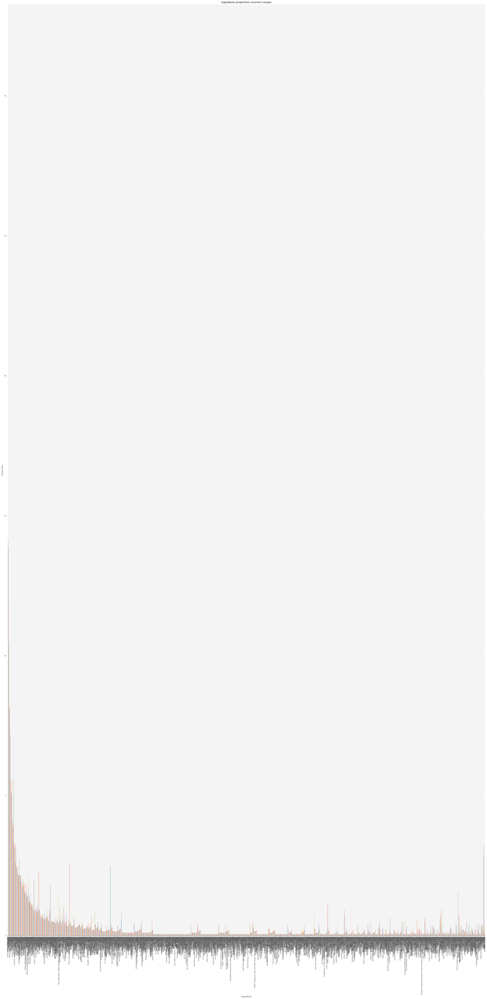

In [105]:
freq_series = df_check_wrong_predictions['percentage words - wrong predictions']

x_labels = listofallingredients_unique

# Plot the figure.
plt.figure(figsize=(50, 100))
ax = freq_series.plot(kind='bar')
ax.set_title('Ingredients proportions incorrect recipes')
ax.set_xlabel('Ingredient')
ax.set_ylabel('Proportion')
ax.set_xticklabels(x_labels)

rects = ax.patches
# For each bar: Place a label
for rect in rects:
    # Get X and Y placement of label from rect.
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2
    # Number of points between bar and label. Change to your liking.
    space = 5
    # Use Y value as label and format number with one decimal place
    label = "{:.1f}".format(y_value)
plt.show()

In [ ]:
#check distribution of proportions -  ingredients in correct predictions

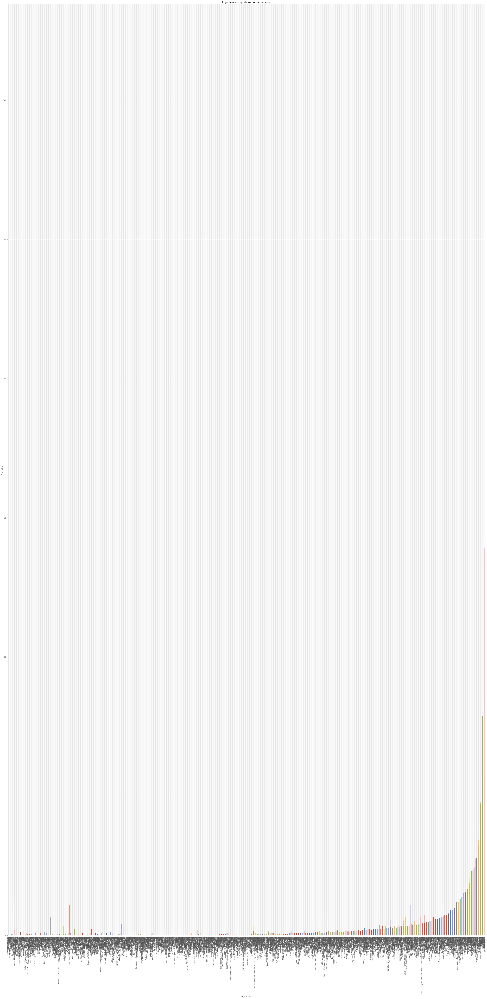

In [104]:
freq_series = df_check_wrong_predictions['correct_predictions_percentages']

x_labels = listofallingredients_unique

# Plot the figure.
plt.figure(figsize=(50, 100))
ax = freq_series.plot(kind='bar')
ax.set_title('Ingredients proportions correct recipes')
ax.set_xlabel('Ingredient')
ax.set_ylabel('Proportion')
ax.set_xticklabels(x_labels)

rects = ax.patches
# For each bar: Place a label
for rect in rects:
    # Get X and Y placement of label from rect.
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2
    # Number of points between bar and label. Change to your liking.
    space = 5
    # Use Y value as label and format number with one decimal place
    label = "{:.1f}".format(y_value)
plt.show()

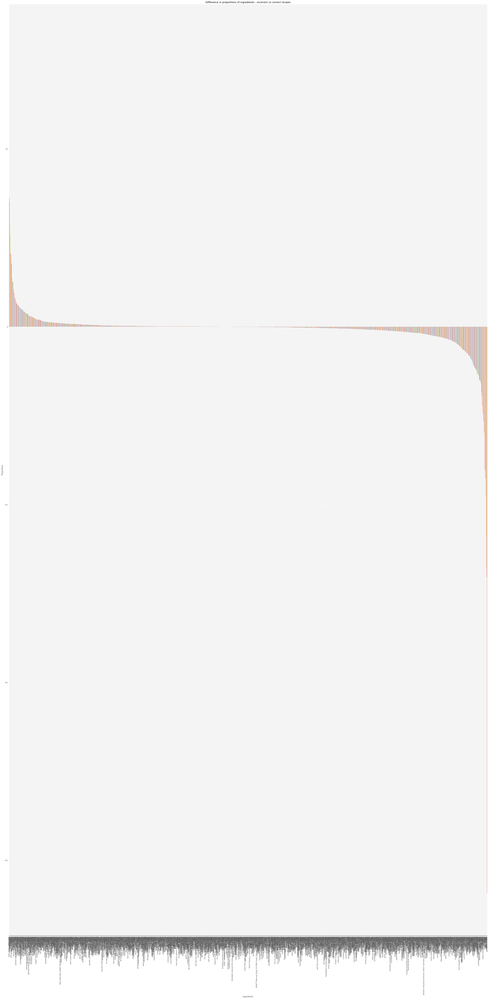

In [106]:
# now look at the distribution of the differences
freq_series = df_check_wrong_predictions['difference']
x_labels = listofallingredients_unique

# Plot the figure.
plt.figure(figsize=(50, 100))
ax = freq_series.plot(kind='bar')
ax.set_title('Difference in proportions of ingredients - incorrect vs correct recipes')
ax.set_xlabel('Ingredient')
ax.set_ylabel('Proportion')
ax.set_xticklabels(x_labels)

rects = ax.patches
# For each bar: Place a label
for rect in rects:
    # Get X and Y placement of label from rect.
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2
    # Number of points between bar and label. Change to your liking.
    space = 5
    # Use Y value as label and format number with one decimal place
    label = "{:.1f}".format(y_value)
plt.show()

In [99]:
# we want to find out the percentage occurrences (proportion) of ingredients in incorrectly classified recipes 
# we want to find out the percentage occurrences (proportion) of those ingredients in correctly classified recipes  
# we want to know the if these proportions are statistically significantly different

# The null hypothesis is that the difference in these proportions is not statistically significant
# The alternative hypothesis is that the difference in these proportions is statistically significant

# Any ingredient proportions that are statistically significant should be removed from the classifier 


In [203]:
keep_positive_differences_over=[]
for item in df_check_wrong_predictions['difference']:
    if item>3:
        print(item)
        keep_positive_differences_over.append(item)
        
print("there are %d over" % len(keep_positive_differences_over))

31.521453565493776
14.496300701821685
14.065472554382717
13.826123583583293
11.464009812501914
10.371251475448059
9.983551809784457
8.217110738253231
8.185734801340354
8.06193685162889
7.155728338112254
7.076482607039492
5.505026328386788
5.448909605603398
5.094009613716012
5.075903978887863
5.0692688278455
5.009834529540928
4.914094941221158
4.179554171575873
4.169789485730128
4.080497007734921
3.8774533269506946
3.7652198813839157
3.319603674637982
3.2584635783933695
3.1990292800887983
3.083760320077537
3.076937128317374
3.0471729689856386
there are 30 over


In [205]:
keep_positive_differences=[]
for item in df_check_wrong_predictions['difference']:
    if item>0:
        print(item)
        keep_positive_differences.append(item)
        
print("there are %d over zero" % len(keep_positive_differences))

31.521453565493776
14.496300701821685
14.065472554382717
13.826123583583293
11.464009812501914
10.371251475448059
9.983551809784457
8.217110738253231
8.185734801340354
8.06193685162889
7.155728338112254
7.076482607039492
5.505026328386788
5.448909605603398
5.094009613716012
5.075903978887863
5.0692688278455
5.009834529540928
4.914094941221158
4.179554171575873
4.169789485730128
4.080497007734921
3.8774533269506946
3.7652198813839157
3.319603674637982
3.2584635783933695
3.1990292800887983
3.083760320077537
3.076937128317374
3.0471729689856386
2.9101987375483467
2.7682011326498324
2.6576734850230945
2.556910523242101
2.5437342415162747
2.5421224639351334
2.5206052332269024
2.5007938004587116
2.4348183714706773
2.413301140762446
2.3671371445426015
2.348937489355552
2.3456199138343705
2.340690560732048
2.2449509724122776
2.2020105313547154
2.2020105313547154
2.15414073719483
2.15414073719483
2.0980240144114406
2.0980240144114406
2.055177593712778
2.053471795772737
2.0220958588598608
1.9544

#### # will it help to remove the top 54 ingredients that are in misclassified recipes, before we count the words?

In [206]:
# Read JSON training data

with open(train_data_file_path, 'r') as f:
     trainDataModified = pd.read_json(f)
f.closed

trainDataModified.head()

,cuisine,id,ingredients
0,greek,10259,"[romaine lettuce, black olives, grape tomatoes..."
1,southern_us,25693,"[plain flour, ground pepper, salt, tomatoes, g..."
2,filipino,20130,"[eggs, pepper, salt, mayonaise, cooking oil, g..."
3,indian,22213,"[water, vegetable oil, wheat, salt]"
4,indian,13162,"[black pepper, shallots, cornflour, cayenne pe..."


In [98]:
# loop through all the recipes and take out the 965 problem ingredients

In [226]:
df_top = pd.DataFrame(df_check_wrong_predictions.head(965))
df_top

,index,0,percentage words - wrong predictions,correct_predictions_occurences,correct_predictions_percentages,difference
4,salt,662,31.689804,6,0.168350,31.521454
52,olive oil,304,14.552417,2,0.056117,14.496301
75,onions,295,14.121589,2,0.056117,14.065473
25,water,290,13.882240,2,0.056117,13.826124
9,sugar,243,11.632360,6,0.168350,11.464010
93,garlic cloves,219,10.483485,4,0.112233,10.371251
62,garlic,249,11.919579,69,1.936027,9.983552
8,all-purpose flour,174,8.329344,4,0.112233,8.217111
95,butter,171,8.185735,0,0.000000,8.185735
67,ground black pepper,169,8.089995,1,0.028058,8.061937


In [227]:
for item in df_top['index']:
    print(item)

salt
olive oil
onions
water
sugar
garlic cloves
garlic
all-purpose flour
butter
ground black pepper
pepper
vegetable oil
tomatoes
soy sauce
ground cumin
eggs
carrots
unsalted butter
large eggs
black pepper
kosher salt
extra-virgin olive oil
milk
red bell pepper
chili powder
corn starch
jalapeno chilies
green onions
oil
diced tomatoes
sour cream
chicken broth
sesame oil
chopped cilantro fresh
brown sugar
minced garlic
scallions
cooking spray
cayenne pepper
flour
fresh lemon juice
boneless skinless chicken breasts
garlic powder
dried oregano
fresh lime juice
black beans
green bell pepper
fresh basil
lime juice
lime
lemon juice
baking powder
chicken stock
yellow onion
ground turmeric
fish sauce
shallots
paprika
chopped onion
cilantro
large garlic cloves
potatoes
plum tomatoes
dry white wine
cilantro leaves
heavy cream
ground cinnamon
tomato sauce
canola oil
lemon
fresh ginger
cumin
flour tortillas
granulated sugar
tomato paste
garam masala
whole milk
ground beef
fresh cilantro
grated parm

In [228]:
updated_ingredients_lists = []

for ingredient_list in trainDataModified['ingredients']:
    print(ingredient_list)
    for ingredient_to_remove in df_top['index']:
        if ingredient_to_remove in ingredient_list:
            ingredient_list.remove(ingredient_to_remove)
    updated_ingredients_list=ingredient_list
    updated_ingredients_lists.append(updated_ingredients_list)

print(len(updated_ingredients_lists))    
print(updated_ingredients_lists)

['romaine lettuce', 'black olives', 'grape tomatoes', 'purple onion', 'seasoning', 'garbanzo beans', 'feta cheese crumbles']
['plain flour', 'ground pepper', 'thyme', 'green tomatoes', 'yellow corn meal']
['mayonaise', 'cooking oil', 'green chilies', 'grilled chicken breasts', 'garlic powder', 'yellow onion', 'chicken livers']
['wheat']
['shallots', 'cornflour', 'cayenne pepper', 'garlic paste', 'lemon juice', 'passata', 'boneless chicken skinless thigh', 'garam masala', 'double cream', 'natural yogurt', 'bay leaf']
['plain flour', 'fresh ginger root', 'ground cinnamon', 'vanilla extract', 'ground ginger', 'powdered sugar', 'baking powder']
['medium shrimp', 'chopped cilantro', 'flat leaf parsley', 'skirt steak', 'white vinegar', 'sea salt', 'bay leaf', 'chorizo sausage']
['pistachio nuts', 'white almond bark', 'flour', 'vanilla extract', 'almond extract', 'baking powder', 'dried cranberries']
['purple onion', 'fresh pineapple', 'pork', 'poblano peppers', 'corn tortillas', 'cheddar che

['fennel seeds', 'fresh ginger', 'cumin seed', 'fresh chile', 'lite coconut milk', 'chopped cilantro fresh', 'asparagus', 'chicken fingers', 'canola oil']
['dark molasses', 'dark brown sugar', 'superfine sugar', 'vanilla', 'boiling water', 'pitted date', 'double cream', 'golden syrup', 'baking soda', 'self-rising cake flour']
['minced garlic', 'lettuce leaves', 'ground pork', 'chile paste', 'sesame oil', 'firm tofu', 'hoisin sauce', 'white rice']
['pigeon peas', 'thyme', 'chicken stock', 'long-grain rice', 'coconut milk']
['nori', 'avocado', 'rice vinegar', 'sushi rice', 'cucumber']
['fresh ginger', 'brown rice', 'ground pork', 'hoisin sauce', 'napa cabbage', 'cilantro leaves', 'shiitake', 'sesame oil', 'canola oil', 'red pepper flakes', 'rice vinegar']
['fat free less sodium chicken broth', 'romano cheese', 'baking potatoes', 'cooking spray', 'chopped onion', 'bacon slices']
['rice flour', 'chutney', 'paneer', 'gram flour', 'soda', 'chaat masala']
['mozzarella cheese', 'cooked rice', 

['chiles', 'cilantro', 'cumin', 'lime juice']
['sesame oil', 'scallions', 'black vinegar', 'light soy sauce', 'green pepper', 'red pepper', 'dark soy sauce', 'cooking oil', 'firm tofu', 'ginger root']
['chicken broth', 'shallots', 'cooked shrimp', 'rice noodles', 'boneless skinless chicken breasts', 'napa cabbage', 'green beans']
['vanilla extract', 'baking powder', 'confectioners sugar', 'lemon zest']
['whole peeled tomatoes', 'dried pasta', 'fresh basil leaves']
['bacon', 'boneless skinless chicken breast halves', 'red chili peppers', 'penne pasta', 'pasta sauce', 'grated parmesan cheese', 'medium shrimp']
['berries', 'cold water', 'whipping cream', 'white wine', 'unflavored gelatin', 'vanilla extract']
['linguine', 'clams', 'shallots', 'dry white wine', 'arugula', 'peeled tomatoes', 'large garlic cloves']
['jack cheese', 'oregano', 'flour', 'evaporated milk', 'tomato sauce', 'green chilies']
['chopped cilantro fresh', 'plum tomatoes', 'finely chopped onion', 'fresh lime juice']
['cu

['white vinegar', 'jerk marinade', 'bay leaves', 'dark brown sugar', 'fresh ginger', 'barbecue sauce', 'fresh lime juice', 'dried thyme', 'dark rum', 'scotch', 'scallions', 'ketchup', 'hot pepper sauce', 'cinnamon', 'ground allspice', 'chicken pieces']
['pork belly', 'Sriracha', 'refrigerated biscuits', 'flour', 'cilantro', 'steamer', 'sliced cucumber', 'brown sugar', 'shredded carrots', 'apple cider vinegar', 'bay leaf']
['half & half', 'ice', 'teas']
['fennel seeds', 'serrano chile', 'mustard powder', 'salmon fillets', 'cayenne pepper', 'ground turmeric', 'brown mustard seeds', 'cumin seed']
['sour cream', 'chicken broth', 'potatoes', 'bacon', 'cheddar cheese']
['mini phyllo dough shells', 'kalamata', 'pecans', 'shredded cheddar cheese', 'pinenuts', 'mayonaise', 'pimentos']
['almonds', 'raisins', 'yeast', 'flour', 'lemon']
['low sodium chicken broth', 'red pepper flakes', 'ground chuck', 'grated parmesan cheese', 'boneless skinless chicken breasts', 'cheese', 'sour cream', 'pasta sau

['panko', 'butter beans', 'whole milk', 'russet potatoes']
['teas', 'flour', 'fruit', 'stout']
['hoisin sauce', 'dry sherry', 'oyster sauce', 'chili oil', 'chopped garlic', 'spring onions', 'cornflour', 'chillies', 'chicken stock', 'swiss chard', 'sirloin steak']
['egg yolks', 'pound cake', 'meringue', 'bananas', 'vanilla extract', 'half & half']
['duck breasts', 'lemongrass', 'shrimp paste', 'rock salt', 'kaffir lime leaves', 'fresh coriander', 'palm sugar', 'red pepper', 'curry paste', 'dark chicken stock', 'red chili peppers', 'light soy sauce', 'shallots', 'green beans', 'chopped garlic', 'fish sauce', 'water chestnuts', 'galangal']
['rum', 'evaporated milk', 'vanilla extract', 'confectioners sugar']
['capers', 'large garlic cloves', 'mushrooms', 'flat leaf parsley', 'fresh lemon juice']
['instant espresso powder', 'brown sugar', 'semisweet chocolate', 'hazelnuts', 'vanilla extract', 'hot water']
['black tea', 'clove', 'cinnamon', 'cardamom', 'cold water', 'fresh ginger', 'pepperco

['garlic powder', 'lean ground beef', 'bay leaf', 'dried basil', 'whole peeled tomatoes', 'white sugar', 'bread crumb fresh', 'dried parsley', 'tomato paste', 'grated parmesan cheese', 'chopped onion']
['stout', 'egg yolks', 'white sugar', 'whole milk', 'vanilla beans', 'heavy whipping cream']
['ground pork', 'ground beef', 'white onion', 'green olives', 'white rice', 'minced garlic', 'tomatillos', 'chopped cilantro']
['whole cloves', 'cardamom pods', 'chicken stock', 'spices', 'leg of lamb', 'duck fat']
['potatoes', 'vegetable broth', 'cashew nuts', 'paprika', 'sour cream', 'almonds', 'ginger', 'green chilies']
['grated parmesan cheese', 'pinenuts', 'minced garlic', 'fresh basil leaves']
['radishes', 'fresh lime juice', 'sesame chili oil', 'peeled fresh ginger', 'chopped fresh mint', 'minced garlic', 'cucumber']
['red potato', 'lemon', 'beer', 'corn', 'hot sauce', 'crawfish', 'smoked sausage', 'shrimp', 'cocktail sauce', 'tartar sauce']
['green bell pepper', 'yellow bell pepper', 'gra

['chopped bell pepper', 'onion tops', 'chopped parsley', 'low sodium chicken broth', 'chopped celery', 'pork', 'black-eyed peas', 'smoked sausage', 'chopped onion', 'long grain white rice', 'cajun seasoning', 'ground cayenne pepper']
['shredded cheddar cheese', 'tomato salsa', 'iceberg lettuce', 'cooked chicken', 'flour tortillas', 'clove garlic, fine chop']
['baking powder', 'grated orange', 'vanilla extract', 'orange blossom honey']
['cardamom', 'vermicelli', 'nuts', 'raisins', 'powdered milk', 'ghee']
['beef stock', 'ground beef', 'flour tortillas', 'taco seasoning', 'lime', 'cheddar cheese', 'chopped cilantro']
['queso asadero', 'vegetable shortening', 'baking powder', 'Anaheim chile']
['lemon', '1% low-fat milk', 'vodka']
['wine', 'daikon', 'dashi', 'tamari soy sauce', 'ginger', 'mirin', 'sushi grade tuna']
['seeds', 'whole wheat flour', 'paratha']
['garam masala', 'mixed vegetables', 'ginger', 'frozen peas', 'chili', 'sweet potatoes', 'vegan butter', 'cumin seed', 'spring roll wr

['coarse salt', 'chipotles in adobo', 'ground pepper', 'monterey jack', 'reduced sodium chicken broth', 'boneless skinless chicken breast halves', 'corn tortillas']
['flat leaf parsley', 'baking potatoes', 'roasted red peppers', 'serrano ham']
['simple syrup', 'liqueur', 'lime', 'ice', 'cachaca']
['beef brisket', 'sesame oil', 'peanut oil', 'white pepper', 'star anise', 'Shaoxing wine', 'ginger', 'bean paste', 'hot bean paste']
['buttermilk', 'cornmeal', 'cajun seasoning', 'sauce', 'chips', 'cracked black pepper']
['cider', 'calvados']
['plain yogurt', 'lime', 'purple onion', 'corn tortillas', 'cumin', 'dried dillweed', 'cornmeal', 'canola oil', 'garlic powder', 'flour', 'cayenne pepper', 'fresh lime juice', 'cabbage', 'mayonaise', 'tomatoes on the vine', 'cod fillets', 'cilantro', 'dried oregano']
['shredded cheddar cheese', 'chopped onion', 'potatoes', '2% reduced-fat milk']
['lemon']
['penne', 'ground nutmeg', 'Italian turkey sausage', 'baby spinach leaves', 'whipping cream', 'asiag

['yellow onion', 'queso fresco', 'sliced ham', 'yukon gold potatoes', 'chopped parsley']
['large egg yolks', 'whole milk', 'vanilla beans']
['catfish fillets', 'ground cayenne pepper', 'dried thyme', 'onion powder', 'dried oregano', 'dried parsley', 'garlic powder', 'paprika']
['fennel seeds', 'cayenne', 'ground coriander', 'peeled fresh ginger', 'fillets', 'tumeric', 'lemon zest', 'plain yogurt', 'chopped fresh mint']
['lemon', 'black mustard seeds', 'potatoes', 'green chilies', 'coriander', 'fresh curry leaves', 'poha', 'roasted peanuts', 'ground turmeric']
['flour tortillas', 'taco bell home originals', 'boneless skinless chicken breasts', 'chopped cilantro fresh', 'shredded cheddar cheese', 'Philadelphia Cream Cheese']
['Mexican cheese', 'canned black beans', 'reduced-fat sour cream', 'scallions', 'whole wheat tortillas', 'rotel tomatoes', 'butternut squash', 'cilantro', 'red enchilada sauce', 'cumin']
['instant rice', 'chopped green bell pepper', 'hot sauce', 'tomato juice', 'chop

['frozen chopped spinach', 'crushed red pepper', 'ground coriander', 'grated jack cheese', 'corn tortillas', 'cheddar cheese', 'sour cream', 'finely chopped onion', 'whipping cream', 'green chilies', 'chopped cilantro fresh']
['reduced fat cream cheese', 'green chile', 'low fat mozzarella', 'boneless skinless chicken breasts', 'low-fat sour cream', 'enchilada sauce']
['pizza doughs', 'pesto', 'grated parmesan cheese', 'goat cheese', 'eggplant']
['lemon', 'baby carrots', 'brown sugar', 'rubbed sage', 'apple juice', 'raisins', 'fresh lemon juice']
['chopped onion', 'collard greens', 'Anaheim chile', 'smoked turkey', 'crushed red pepper', 'lemon juice']
['lean ground beef', 'double crust pie', 'shredded sharp cheddar cheese', 'red pepper', 'pastry', 'sliced mushrooms']
['fat free yogurt', 'fat-free cottage cheese', 'cooked rigatoni', 'sugar pea', 'grated parmesan cheese', 'basil leaves']
['dried basil', 'vegetable oil cooking spray', 'frozen vegetables', 'chopped onion', 'grated parmesan 

['Johnsonville Smoked Sausage', 'worcestershire sauce', 'tomato sauce', 'bay leaves', 'fresh parsley', 'cooked rice', 'hot pepper sauce', 'chopped celery', 'dried kidney beans', 'fully cooked ham', 'chopped onion', 'garlic salt']
['creole seasoning', 'boiling water', 'shortening', 'cornmeal', 'lard', 'minced onion', 'white sugar']
['sparkling sangria tradicional', 'orange', 'sangria']
['egg whites', 'almond extract', 'cake flour', 'confectioners sugar', 'ground cinnamon', 'rum', 'candied cherries', 'lemon juice', 'orange zest', 'sherry', 'white sugar', 'ricotta cheese', 'sweet chocolate', 'toasted almonds']
['peeled fresh ginger', 'chicken stock', 'jasmine rice', 'chopped cilantro fresh']
['crab boil', 'corn', 'shrimp', 'sausage links', 'small red potato']
['bacon', 'frozen artichoke hearts', 'white onion', 'spaghetti', 'chicken stock', 'fresh green bean', 'saffron']
['egg whites', 'coarse salt', 'egg yolks', 'buttermilk', 'canola oil', 'baking soda', 'baking powder', 'cornmeal']
['cil

['chicken broth', 'epazote', 'dried oregano', 'pumpkin seeds', 'tomatillos', 'cumin seed', 'chopped cilantro fresh', 'fresh parsley']
['tomato purÃ©e', 'taco seasoning', 'panko breadcrumbs', 'hot sauce', 'ground beef', 'black beans', 'cheese', 'salsa', 'corn', 'pasta shells', 'goat cheese']
['sweet onion', 'avocado', 'fresh lime juice', 'ketchup', 'lime wedges', 'shrimp', 'saltines', 'hot sauce', 'chopped cilantro fresh']
['plain yogurt', 'half & half', 'cayenne pepper', 'ground cinnamon', 'flour tortillas', 'cilantro leaves', 'chopped cilantro', 'ground cloves', 'buttermilk', 'yellow onion', 'paneer cheese', 'frozen spinach', 'fresh ginger', 'mint leaves', 'lemon juice']
['berries', 'self rising flour']
['cooking spray', 'fresh mushrooms', 'butter-margarine blend', 'marsala wine', 'cracked black pepper', 'veal']
['tea bags', 'boiling water', 'Irish whiskey', 'white sugar']
['tortillas', 'green pepper', 'sour cream', 'black beans', 'chicken breasts', 'fresh mushrooms', 'corn niblets', 

['lemon wedge', 'dried oregano', 'rub', 'dried thyme', 'granulated garlic', 'lamb loin chops', 'dried basil', 'lemon']
['powdered sugar', 'raisins', 'phyllo pastry', 'caramel ice cream', 'granny smith apples', 'walnuts']
['jasmine rice', 'chayotes', 'ginger', 'cilantro', 'coconut vinegar', 'yukon gold potatoes', 'yellow onion', 'ground beef']
['chili flakes', 'lime', 'tamari soy sauce', 'chinese five-spice powder', 'lemongrass', 'sesame oil', 'yellow onion', 'greens', 'fish sauce', 'lime juice', 'fresh ginger', 'broccoli', 'fresh coriander', 'orange', 'sea salt', 'beef rib short']
['bananas', 'lumpia skins']
['crushed tomatoes', 'red pepper flakes', 'sausage links', 'green bell pepper, slice', 'yellow onion', 'dried oregano', 'marsala wine', 'bell pepper']
['fresh parmesan cheese', 'coarse salt', 'fresh basil leaves', 'lemon', 'spaghetti', 'pasta water']
['coriander', 'chopped tomatoes', 'cocoa powder']
['unseasoned breadcrumbs', 'ground pork', 'chicken stock', 'cabbage leaves', 'fresh

['broccoli florets', 'crushed red pepper flakes', 'canola oil', 'ketchup', 'slaw mix', 'pork loin chops', 'ramen noodles', 'reduced sodium soy sauce', 'worcestershire sauce', 'bamboo shoots']
['mung beans', 'spinach', 'light soy sauce', 'pork cubes', 'roma tomatoes', 'fish sauce']
['purple onion', 'garam masala', 'paprika', 'greek yogurt', 'tumeric', 'lemon', 'ginger', 'chicken thighs']
['brown sugar', 'fish sauce', 'lime wedges', 'fresh lime juice', 'mussels', 'ketchup', 'red curry paste', 'fresh basil', 'fresh ginger root', 'coconut milk']
['tomato juice', 'chipotle chile', 'jalape', 'plum tomatoes', 'peaches', 'chopped cilantro fresh', 'chili', 'chopped onion']
['celery ribs', 'bay leaves', 'paprika', 'okra', 'chopped garlic', 'andouille sausage', 'chopped fresh thyme', 'hot sauce', 'low salt chicken broth', 'boneless chicken skinless thigh', 'file powder', 'worcestershire sauce', 'cayenne pepper', 'green bell pepper', 'steamed rice', 'scallions']
['green tomatoes', 'flour', 'bacon'

['sour cream', 'refried beans', 'monterey jack', 'salsa']
['chicken wings', 'baking powder', 'jerk sauce']
['chicken broth', 'quickcooking grits', 'deveined shrimp', 'bacon', 'smoked cheddar cheese']
['ground cinnamon', 'vanilla extract', 'ground nutmeg', 'pie dough', 'sweet potatoes', 'pumpkin pie spice', 'brown sugar', 'reduced fat milk']
['gari', 'mirin', 'dried shiitake mushrooms', 'large shrimp', 'vegetable oil spray', 'lettuce leaves', 'asparagus spears', 'sushi rice', 'reduced sodium soy sauce', 'bamboo shoots', 'dashi']
['sweetened condensed milk', 'bananas', 'heavy whipping cream', 'graham cracker crumbs']
['cream of chicken soup', 'cream cheese', 'chicken breasts', 'italian salad dressing']
['red wine vinegar', 'dried oregano', 'pork', 'paprika']
['pork belly', 'dark soy sauce', 'rice wine', 'fresh ginger', 'star anise', 'club soda', 'clove', 'chenpi', 'scallions']
['ginger', 'skinless chicken breasts', 'red chili peppers', 'cooking wine', 'coriander', 'fresh red chili', 'sca

['marinade', 'oyster sauce', 'yellow chives', 'black mushrooms', 'ground white pepper', 'wine', 'ginger', 'pork', 'egg noodles', 'beansprouts']
['honey', 'vanilla extract', 'half & half']
['fresh ginger', 'bean sauce', 'cucumber', 'scallions', 'radishes', 'soba noodles', 'rice vinegar']
['firmly packed light brown sugar', 'light soy sauce', 'yellow bell pepper', 'snow peas', 'lime zest', 'basil leaves', 'creamy peanut butter', 'pork tenderloin', 'crushed red pepper']
['fresh shiitake mushrooms', 'chocolate morsels', 'beef broth', 'dry red wine']
['minced garlic', 'red wine vinegar', 'fresh lemon juice', 'Italian parsley leaves', 'pimento stuffed green olives', 'roasted red peppers', 'dried salted codfish', 'celery ribs', 'kalamata', 'fresh basil leaves']
['fresh basil leaves', 'tomato sauce', 'fillet red snapper', 'freshly ground pepper']
['cremini mushrooms', 'sweet corn', 'monterey jack', 'lime', 'half & half', 'corn tortillas', 'poblano peppers', 'sour cream', 'avocado', 'adobo sauc

['tomato sauce', 'grated parmesan cheese', 'part-skim mozzarella cheese', 'onion powder', 'dried oregano', 'frozen chopped spinach', 'dried basil', 'lasagna noodles, cooked and drained', 'fresh basil leaves', 'vegetable oil cooking spray', 'garlic powder', 'ricotta cheese']
['light brown sugar', 'ground cloves', 'heavy cream', 'ground ginger', 'mace', 'all purpose unbleached flour', 'grated nutmeg', 'blackstrap molasses', 'granulated sugar', 'whipped cream', 'ground cardamom', 'pie crust', 'orange', 'sweet potatoes', 'sea salt']
['fresh shiitake mushrooms', 'oyster sauce', 'mung bean sprouts', 'Shaoxing wine', 'ground white pepper', 'snow peas', 'sesame oil', 'noodles', 'dark soy sauce', 'shredded cabbage', 'scallions', 'canola oil']
['ground ginger', 'cut up chicken', 'brown sugar', 'green pepper', 'pineapple chunks', 'ketchup', 'pineapple juice', 'chicken bouillon granules', 'vinegar']
['light brown sugar', 'granny smith apples', 'raisins', 'fresh lemon juice', 'ground cinnamon', 'su

['fat free yogurt', 'english cucumber', 'chopped fresh mint']
['mace', 'ginger', 'green cardamom', 'ghee', 'whole cloves', 'cumin seed', 'ground ginger', 'coriander seeds', 'mutton', 'brown cardamom', 'red chile powder', 'cinnamon', 'bay leaf']
['cheddar cheese', 'corn kernels', 'green pepper', 'noodles', 'italian sausage', 'garlic powder', 'ground beef', 'tomato sauce', 'dried basil', 'ripe olives', 'dried oregano', 'tomato paste']
['garlic powder', 'rotelle', 'fresh cilantro', 'cream of chicken soup', 'corn tortillas', 'fresh lime', 'Mexican cheese blend', 'sour cream', 'boneless skinless chicken breasts', 'cream of mushroom soup']
['basil pesto sauce', 'fresh mushrooms', 'smoked salmon', 'spaghetti', 'tomato paste', 'fresh basil', 'crushed garlic']
['spring onions', 'cabbage', 'wonton wrappers', 'firm tofu', 'zucchini', 'rice vermicelli', 'toasted sesame oil']
['shallots', 'vodka', 'whipping cream', 'plum tomatoes', 'fresh basil', 'asparagus spears', 'medium shrimp uncook', 'linguin

['chicken broth', 'lime', 'long grain white rice', 'white onion', 'canola oil', 'tomato paste', 'fresh cilantro']
['low sodium soy sauce', 'mushrooms', 'broccoli', 'oyster sauce', 'celery', 'orange zest', 'yellow squash', 'water chestnuts', 'sesame oil', 'vegetable broth', 'cilantro leaves', 'peanut oil', 'snow peas', 'honey', 'zucchini', 'peeled fresh ginger', 'buttermilk', 'boneless skinless chicken', 'yellow onion', 'Chinese egg noodles', 'mung bean sprouts', 'chicken stock', 'fresh ginger', 'flour', 'mixed vegetables', 'thai chile', 'rice vinegar', 'scallions', 'toasted sesame oil', 'canola oil']
['Guinness Beer', 'cream cheese', 'flour', 'chocolate', 'Baileys Irish Cream Liqueur', 'heavy cream', 'unsweetened cocoa powder', 'Irish whiskey']
['white onion', 'cheese', 'sour cream', 'refried beans', 'salsa', 'green chile', 'lean ground beef', 'tortilla chips']
['mushrooms', 'shredded mozzarella cheese', 'italian seasoning', 'brown sugar', 'salt and ground black pepper', 'moose', 'spin

['rib', 'collard greens']
['warm water', 'oat flour', 'active dry yeast', 'white sugar', 'whole wheat flour']
['lemon peel', 'pears', 'powdered sugar', 'vanilla beans', 'pound cake', 'sliced almonds', 'whipping cream', 'vanilla extract']
['ground pork', 'tofu', 'sesame oil', 'miso paste']
['hard-boiled egg', 'pork belly', 'cracked black pepper', 'fish sauce', 'shallots', 'coconut']
['tumeric', 'garam masala', 'cilantro', 'coriander seeds', 'lemon', 'red chili powder', 'potatoes', 'ginger', 'green chilies']
['kingfish', 'garlic paste', 'coconut milk', 'ginger paste', 'kokum', 'fenugreek', 'black mustard seeds', 'ground turmeric', 'fresh curry leaves']
['plain low-fat yogurt', 'cucumber', 'fresh parsley', 'fresh lemon juice']
['large garlic cloves', 'stilton cheese', 'mushrooms', 'heavy cream']
['minced garlic', 'coarse salt', 'all purpose unbleached flour', 'soft fresh goat cheese', 'warm water', 'crushed red pepper', 'dry yeast']
['chestnuts', 'shiitake', 'scallions', 'water chestnuts'

['eggplant', 'clarified butter', 'coriander seeds']
['refried beans', 'shredded cheddar cheese', 'taco seasoning mix']
['cream cheese', 'heavy cream', 'frozen corn']
['stewing hen', 'broccoli florets', 'chinese ham', 'sea cucumber', 'scallions', 'pork spare ribs', 'abalone', 'ginger']
['warm water', 'dry yeast']
['dried basil', 'fresh basil', 'whole wheat spaghetti', 'dried oregano', 'tomato paste', 'fat free milk', 'lean ground beef', 'fresh mushrooms']
['lettuce leaves', 'pickle relish', 'wasabi powder', 'white tuna in water', 'light mayonnaise', 'whole wheat pita', 'purple onion']
['cheese', 'pasta sauce', 'chopped cilantro fresh', 'shredded mozzarella cheese', 'diced green chilies']
['warm water', 'mascarpone', 'dried fig', 'honey', 'cooking spray', 'dry yeast']
['whitefish', 'broth', 'arborio rice', 'romano cheese', 'fresh basil', 'anchovy fillets', 'large shrimp', 'tomato paste', 'dry white wine']
['pancetta', 'pecorino cheese', 'fresh fava bean', 'country bread']
['radishes', 't

['pinto beans', 'lard']
['Shaoxing wine', 'ginger', 'wide rice noodles', 'flank steak', 'dark soy sauce', 'light soy sauce', 'sesame oil', 'oyster sauce', 'white pepper', 'beansprouts']
['black beans', 'low sodium chicken broth', 'chipotle chile powder', 'cumin', 'corn kernels', 'poblano peppers', 'Mexican cheese blend', 'roasted tomatoes', 'quinoa', 'dried oregano']
['celery ribs', 'roasting chickens', 'beans', 'instant chicken bouillon granules', 'thyme', 'black peppercorns', 'potatoes', 'turnips', 'chopped parsley']
['balsamic vinegar', 'bay leaves', 'purple onion', 'butter beans']
['fresh basil', 'marinara sauce', 'mozzarella cheese', 'flat leaf parsley', 'french baguette', 'sweet italian sausage', 'grated parmesan cheese']
['hoisin sauce', 'ginger root', 'rice wine', 'duck', 'five-spice powder', 'caster sugar', 'bean paste', 'rice vinegar', 'honey', 'red']
['green bell pepper', 'creole seasoning', 'celery ribs', 'vegetable bouillon cube', 'long-grain rice', 'red kidney beans', 'sm

['prebaked pizza crusts', 'broccoli florets', 'fresh basil', 'part-skim mozzarella cheese', 'purple onion', 'portabello mushroom', 'crushed red pepper', 'olive oil flavored cooking spray']
['cilantro sprigs', 'processed cheese', 'chopped onion', 'cream cheese, soften']
['minced garlic', 'flat leaf parsley', 'boiling potatoes', 'goose fat']
['corn husks', 'lard', 'raisins', 'dough', 'baking powder', 'red food coloring']
['ground cinnamon', 'baking powder', 'lemon juice', 'peaches']
['mayonaise', 'chopped cilantro', 'chili pepper', 'serrano peppers', 'chicken broth', 'poblano peppers', 'tomatillos', 'cumin']
['fat free beef broth', 'soba', 'beef tenderloin', 'low sodium soy sauce', 'peeled fresh ginger', 'sliced green onions', 'large egg whites', 'beansprouts']
['fresh lemon juice', 'boneless skinless chicken breasts', 'ground coriander', 'sweet paprika', 'fresh parsley', 'fresh cilantro']
['feta cheese', 'fresh lemon juice', 'sea salt', 'dried oregano', 'potatoes', 'fresh parsley', 'dri

['cilantro', 'avocado', 'purple onion', 'lime juice']
['tomatillos', 'chopped cilantro fresh']
['soft fresh goat cheese', 'red wine vinegar', 'plum tomatoes', 'fusilli', 'fresh basil leaves', 'large garlic cloves']
['leeks', 'Chianti', 'beets']
['jalape', 'macaroni', 'arugula', 'pinenuts', 'large garlic cloves']
['chili beans', 'black beans', 'beer', 'tomato sauce', 'whole kernel corn, drain', 'chicken breasts', 'taco seasoning', 'cheddar cheese', 'tortilla chips', 'sour cream']
['purple onion', 'medium shrimp', 'honeydew melon', 'fresh mint', 'cashew nuts', 'cilantro leaves', 'fresh basil leaves', 'vietnamese fish sauce', 'fresh lime juice', 'serrano chile']
['grated parmesan cheese', 'rigatoni', 'minced garlic', 'kalamata', 'sun-dried tomatoes', 'feta cheese crumbles', 'basil']
['bell pepper', 'chicken broth', 'lime', 'chicken tenderloin', 'dried oregano', 'long grain white rice', 'double concentrate tomato paste', 'cilantro']
['chicken broth', 'basil', 'bell pepper', 'okra', 'italia

['kasseri', 'chopped onion', 'ground lamb', 'lean ground beef', 'pimento stuffed green olives', 'ground cinnamon', 'black olives', 'flat leaf parsley', 'tomato sauce', 'dry red wine', 'dry bread crumbs', 'dried oregano']
['red pepper', 'Bob Evans Italian Sausage', 'provolone cheese', 'pasta sauce', 'green pepper', 'sub buns']
['fresh cilantro', 'lemon', 'chickpea flour', 'sesame seeds', 'sweet potatoes', 'ground coriander']
['grated parmesan cheese']
['extra lean ground beef', 'cheese', 'zesty italian dressing', 'green pepper', 'flour tortillas', 'salsa', 'red pepper', 'chopped cilantro']
['lime juice', 'reduced-fat sour cream', 'corn tortillas', 'purple onion', 'shredded lettuce', 'medium shrimp']
['lemon slices', 'tea bags', 'no-calorie sweetener', 'mint sprigs']
['capers', 'anchovy paste', 'crushed tomatoes', 'dry bread crumbs', 'spinach', 'veal', 'red wine', 'fresh parsley']
['clove', 'tumeric', 'garam masala', 'ginger', 'green cardamom', 'chopped cilantro', 'canola oil', 'black pe

['minced garlic', 'hungarian paprika', 'leg of lamb', 'chopped cilantro', 'fresh lemon juice']
['fresh basil', 'egg whites', 'hot sauce', 'baking potatoes', 'vegetable oil cooking spray', 'balsamic vinegar', 'fresh parmesan cheese']
['refried beans', 'black olives', 'ground beef', 'crescent rolls', 'taco seasoning', 'shredded cheddar cheese']
['shrimp chips', 'corn oil']
['amberjack fillet', 'rice vinegar', 'fresh pineapple', 'brown sugar', 'fresh orange juice', 'low sodium soy sauce', 'cooking spray', 'green bell pepper', 'peeled fresh ginger', 'fresh lemon juice']
['paprika', 'sharp cheddar cheese', 'cheddar cheese', 'sour cream', 'pecan halves', 'chopped pecans', 'chicken broth', 'mayonaise', 'worcestershire sauce', 'hot sauce', 'cooked chicken breasts']
['feta cheese', 'French bread loaves', 'kalamata', 'cucumber', 'green bell pepper', 'oregano']
['grated parmesan cheese', 'hot Italian sausages', 'dried oregano', 'pasta sauce', 'crushed red pepper', 'bread', 'ricotta cheese', 'shre

['dried chile peppers', 'Madeira', 'shrimp', 'celery ribs', 'broth', 'andouille sausage', 'okra']
['black beans', 'green chile', 'whole kernel corn, drain', 'minced garlic', 'stewed tomatoes']
['rice sticks', 'low sodium soy sauce', 'dry roasted peanuts', 'cooking spray', 'red curry paste', 'fresh lime juice', 'brown sugar', 'ground red pepper', 'chopped onion', 'reduced fat firm tofu', 'cider vinegar', 'broccoli']
['half & half', 'unsalted shelled pistachio', 'cardamom seeds', 'blanched almonds', 'whole milk ricotta cheese']
['back bacon', 'dark soy sauce', 'chicken legs', 'oyster sauce', 'white rice']
['frozen pastry puff sheets', 'brie cheese', 'sliced almonds']
['harissa', 'buttermilk', 'scallions', 'canned corn', 'yellow corn meal', 'olive oil mayonnaise', 'frozen corn', 'frozen peas', 'baking soda']
['jasmine rice', 'coconut cream']
['crushed tomatoes', 'red wine vinegar', 'fresh parsley', 'fontina cheese', 'cooking oil', 'dried oregano', 'red wine', 'perciatelli', 'grated parmes

['grated parmesan cheese', 'yellow hominy', 'grits', 'shredded sharp cheddar cheese']
['tumeric', 'hot pepper', 'lentils', 'basmati rice', 'cauliflower', 'garam masala', 'paprika', 'cayenne pepper', 'chopped cilantro', 'plain yogurt', 'mustard seeds', 'bell pepper', 'ginger', 'cumin seed']
['dressing', 'broccoli', 'round steaks']
['pasta', 'coarse salt', 'chopped cilantro fresh', 'chicken broth']
['ginger purÃ©e', 'sake', 'mirin', 'white sugar']
['celery ribs', 'coriander seeds', 'shallots', 'fresh mushrooms', 'thyme', 'California bay leaves', 'sherry vinegar', 'chopped fresh thyme', 'mixed greens', 'flat leaf parsley', 'brown chicken stock', 'minced garlic', 'leeks', 'goat cheese']
['shredded lettuce', 'ground beef', 'tomato juice', 'taco seasoning', 'diced onions', 'fat-free cheddar cheese', 'chipotles in adobo']
['baking powder', 'shortening', 'ground cinnamon', 'all purpose unbleached flour', 'white sugar']
['yellow corn meal', 'corn', 'baking powder', 'cream style corn', 'light so

['ground cinnamon', 'eggplant', 'bow-tie pasta', 'dried basil', 'grated parmesan cheese', 'dried oregano', 'celery salt', 'dried mint flakes', 'feta cheese', 'crushed red pepper flakes', 'dried dillweed', 'marjoram']
['chili', 'tequila', 'chiles', 'chopped cilantro fresh', 'lime juice', 'chopped onion']
['green bell pepper', 'egg whites', 'oyster sauce', 'medium shrimp', 'minced garlic', 'rice wine', 'yellow onion', 'white pepper', 'chili bean sauce', 'Chinese egg noodles', 'chicken stock', 'chili paste', 'marinade', 'sauce']
['basmati rice', 'lemon wedge', 'yellow onion', 'flat leaf parsley', 'bay leaves', 'black olives', 'fresh lemon juice', 'chicken', 'spices', 'freshly ground pepper', 'chopped cilantro fresh']
['dried oregano', 'green cabbage', 'hominy', 'freshly ground pepper', 'serrano chilies', 'celery ribs', 'yellow onion', 'chicken']
['lime', 'unsalted cashews', 'purple onion', 'basmati rice', 'peaches', 'cilantro', 'clarified butter', 'chicken stock', 'garam masala', 'lime we

['cilantro leaves', 'lemon juice', 'whole milk yoghurt', 'ground coriander', 'fresh ginger', 'cardamom pods', 'chicken', 'black peppercorns', 'sea salt']
['lime zest', 'chopped cilantro fresh', 'tortilla chips', 'avocado', 'white onion', 'fresh lime juice']
['sweet onion', 'baking potatoes', 'large egg whites', 'chopped fresh chives', 'non-fat sour cream', 'fresh parmesan cheese', 'cooking spray', 'dried thyme', 'bacon slices']
['orange', 'english cucumber', 'lemon', 'sprite', 'mint', 'persian cucumber']
['lime zest', 'fresh cilantro', 'rice vinegar', 'beansprouts', 'fish sauce', 'rice noodles', 'sliced green onions', 'boneless skinless chicken breasts', 'salted peanuts', 'fresh lime juice', 'brown sugar', 'garlic chili sauce']
['boneless chicken skinless thigh', 'cracked black pepper', 'cooked rice', 'paprika', 'curry powder', 'greek style plain yogurt', 'minced garlic']
['cookies', 'heavy whipping cream', 'strawberries', 'vanilla extract', 'condensed milk']
['green bell pepper', 'chi

['fresh lime juice', 'strawberries', 'fresh orange juice', 'grated orange', 'lime rind', 'tequila']
['coriander seeds', 'flaked coconut', 'mustard seeds', 'fresh curry leaves', 'split black lentils', 'dried red chile peppers', 'chopped cilantro fresh', 'bengal gram', 'chile pepper', 'asafoetida powder', 'white sugar', 'peanuts', 'cooking oil', 'cumin seed', 'cooked white rice', 'ground turmeric']
['lime juice', 'red curry paste', 'tomato sauce', 'leeks', 'ground beef', 'lime zest', 'minced ginger', 'light coconut milk']
['vegetables', 'ground pork', 'Shaoxing wine', 'ginger', 'active dry yeast', 'sesame oil']
['salted cashews', 'bananas', 'fresh lemon juice']
['diced onions', 'grated parmesan cheese', 'sliced mushrooms', 'italian sausage', 'pizza sauce', 'italian seasoning', 'chopped tomatoes', 'sausages']
['brown sugar', 'fresh cilantro', 'shallots', 'dark sesame oil', 'boneless chicken thighs', 'fresh ginger', 'sweet rice wine']
['fresh parmesan cheese', 'gnocchi', 'broccoli florets'

['garlic powder', 'fresh lime juice', 'pasilla chiles', 'chicken breasts', 'roasted red peppers', 'yellow onion', 'shredded Monterey Jack cheese', 'minced garlic', 'corn tortillas']
['buttermilk', 'baking soda', 'golden raisins']
['fresh basil', 'parmesan cheese', 'peas', 'balsamic vinegar', 'fresh lemon juice', 'french baguette', 'grated parmesan cheese']
['lime juice', 'cayenne pepper', 'stock', 'rice wine', 'fish sauce', 'chili']
['cooked brown rice', 'ginger', 'black-eyed peas', 'ground allspice', 'minced garlic', 'yellow onion', 'ground ginger', 'ground nutmeg', 'button mushrooms', 'panko breadcrumbs']
['avocado', 'chicken breasts', 'chipotle chile', 'chicken broth', 'lime wedges', 'zucchini', 'chickpeas']
['eggplant', 'heavy cream', 'fish sauce', 'water chestnuts', 'coconut milk', 'thai basil', 'red curry paste', 'chicken breasts', 'bamboo shoots']
['triple sec', 'ice', 'frozen limeade concentrate', 'gold tequila']
['balsamic vinegar', 'freshly ground pepper', 'baguette', 'purple

['quick-cooking oats', 'golden brown sugar', 'golden syrup']
['refried beans', 'salsa', 'guacamole', 'flour tortillas', 'grating cheese']
['yellow onion', 'boneless skinless chicken breast halves', 'ground cinnamon', 'baking potatoes', 'corn tortillas', 'lime', 'canola oil']
['balsamic vinegar', 'roma tomatoes', 'baguette', 'basil']
['mace', 'spring onions', 'green chilies', 'cabbage', 'beans', 'bell pepper', 'mushrooms', 'celery', 'vinegar', 'star anise', 'long-grain rice']
['fish sauce', 'canola oil', 'chicken stock', 'lemongrass', 'chopped cilantro fresh', 'light coconut milk', 'fresh lime juice', 'sambal ulek', 'peeled fresh ginger', 'sliced mushrooms', 'cooked chicken breasts']
['nutmeg', 'tumeric', 'potatoes', 'star anise', 'rice', 'chaat masala', 'red chili powder', 'mace', 'yoghurt', 'plums', 'red chili peppers', 'mint leaves', 'mutton', 'curry leaves', 'garlic paste', 'garam masala', 'yellow food coloring', 'coriander']
['green chilies', 'chicken stock', 'flour tortillas', 'wh

['amber rum', 'ice cubes', 'orange', 'clove', 'peeled fresh ginger', 'sorrel', 'lime']
['amchur', 'mashed potatoes', 'finely chopped onion', 'coriander', 'garam masala', 'ghee', 'millet flour', 'chilli paste']
['red wine vinegar']
['bittersweet chocolate', 'cake flour', 'confectioners sugar', 'baking powder', 'chestnut purÃ©e', 'ground cinnamon', 'vanilla extract', 'crÃ¨me fraÃ®che']
['brandy', 'vanilla extract', 'blanched almonds', 'warm water', 'active dry yeast', 'raisins', 'grated lemon zest', 'powdered sugar', 'dried orange peel', 'golden raisins']
['ground cloves', 'baking soda', 'cinnamon', 'nonfat vanilla yogurt', 'pitted date', 'dried apricot', 'whole wheat pastry flour', 'ground nutmeg', 'raisins', 'honey', 'baking powder', 'chopped walnuts']
['watermelon', 'pickling spices', 'peeled fresh ginger', 'white vinegar', 'cider vinegar']
['pasta', 'dijon', 'salami', 'fresh lemon juice', 'plum tomatoes', 'fresh rosemary', 'balsamic vinegar', 'celery', 'sliced black olives', 'red win

['lime juice', 'avocado', 'chili', 'grated orange peel', 'jicama', 'fresh cilantro']
['garlic paste', 'garam masala', 'seeds', 'paneer', 'red chili powder', 'amchur', 'yoghurt', 'kasuri methi', 'gram flour', 'lime juice', 'bell pepper', 'ginger', 'ground turmeric', 'caraway seeds', 'coriander powder', 'large garlic cloves', 'chaat masala']
['refried beans', 'sour cream', 'salsa', 'flour tortillas', 'shredded cheddar cheese', 'rice']
['parmesan cheese', 'creole style seasoning', 'spaghetti', 'shrimp', 'teriyaki sauce']
['frozen broccoli', 'cheese tortellini', 'hot sauce', 'broth']
['cayenne pepper', 'whole wheat spaghetti', 'red enchilada sauce', 'cumin', 'boneless skinless chicken breasts', 'cilantro', 'sharp cheddar cheese', 'red pepper', 'green pepper', 'smoked paprika']
['baking powder', 'baking soda', 'bacon', 'buttermilk', 'cornmeal']
['tofu', 'dry roasted peanuts', 'serrano chile', 'fish sauce', 'fresh cilantro', 'brown sugar', 'large egg whites', 'lime wedges', 'beansprouts', 'r

['leaf lettuce', 'hamburger buns', 'Velveeta', 'Ro-Tel Diced Tomatoes & Green Chilies', 'ground sirloin']
['pasta', 'potatoes', 'green cabbage', 'sage leaves', 'fontina cheese', 'cheese']
['catfish fillets', 'paprika', 'cayenne pepper', 'olive oil spray', 'yellow corn meal', 'lemon pepper', 'hot sauce']
['crushed tomatoes', 'crushed red pepper', 'basil', 'bay leaf', 'tomato sauce', 'onion powder', 'oregano']
['corn husks', 'cilantro leaves', 'lime', 'quinoa', 'plum tomatoes']
['vegetables', 'fresh basil leaves', 'chinese eggplants', 'light soy sauce', 'chili bean sauce']
['black beans', 'brown rice', 'frozen corn', 'canola oil', 'shredded cheddar cheese', 'hot sauce', 'tomato purÃ©e', 'bell pepper', 'chopped cilantro fresh']
['basil leaves', 'shredded mozzarella cheese', 'chicken breast fillets', 'sun-dried tomatoes', 'mushrooms', 'panko', 'shredded parmesan cheese']
['chicken breast halves', 'frozen peas', 'dried thyme', 'coarse salt', 'cooked white rice', 'curry powder', 'coconut mil

['red pepper', 'vegetable broth', 'shirataki', 'coconut milk', 'salmon fillets', 'peanut sauce']
['curry leaves', 'yoghurt', 'cumin', 'garam masala', 'cilantro', 'asafoetida', 'paprika', 'mustard seeds', 'red lentils', 'ginger', 'coriander']
['shredded sharp cheddar cheese', 'quickcooking grits']
['chipotles in adobo', 'tomatillos', 'poblano chiles', 'white onion', 'cilantro leaves', 'large garlic cloves', 'fresh lime juice']
['Italian parsley leaves', 'grated parmesan cheese', 'baguette']
['peeled shrimp', 'coconut milk', 'fish sauce', 'fresh mushrooms', 'cooked rice', 'red curry paste', 'fresh basil leaves', 'cooking oil']
['pecans', 'baby spinach', 'peaches', 'salad dressing']
['sliced black olives', 'sour cream', 'margarine', 'ground beef', 'corn tortillas', 'shredded cheddar cheese', 'enchilada sauce']
['shredded sharp cheddar cheese', 'bacon salt', 'yellow corn meal', 'enchilada sauce', 'mushroom caps']
['baguette', 'whole peeled tomatoes', 'crushed red pepper flakes', 'fresh par

['cream cheese', 'grated orange', 'semisweet chocolate', 'unsweetened cocoa powder', 'fresh orange juice', 'confectioners sugar']
['cream sweeten whip', 'granulated sugar', 'lemon', 'vanilla bean ice cream', 'pure vanilla extract', 'peaches', 'fresh blueberries', 'yellow corn meal', 'baking powder', 'baking soda', 'buttermilk']
['ladyfingers', 'espresso', 'dark rum', 'vanilla ice cream']
['medium shrimp', 'lemon grass', 'fresh mint', 'minced garlic', 'fresh lime juice', 'fish sauce', 'asian chili red sauc']
['garbanzo beans', 'paprika', 'fresh parsley', 'tahini', 'lemon juice']
['walnut pieces', 'coffee granules', 'large egg whites', 'Irish whiskey', 'light brown sugar', 'coffee ice cream', 'heavy cream', 'granulated sugar']
['paprika', 'tequila', 'boneless chicken skinless thigh', 'flour', 'orange juice', 'lime', 'cooking spray', 'dri fruit tropic', 'garlic powder']
['mango', 'thai jasmine rice', 'coconut milk']
['corn husks', 'coarse salt', 'cherries', 'fresh lime juice', 'ground pep

['brown sugar', 'sesame oil', 'Gochujang base', 'minced garlic', 'corn syrup', 'anchovies', 'toasted sesame seeds']
['cooking oil', 'oyster sauce', 'vinegar', 'green chilies', 'eggplant', 'shrimp paste', 'coconut milk']
['dry red wine', 'chuck', 'pepper sauce', 'burrito seasoning mix', 'roasted garlic', 'paprika', 'pork shoulder']
['sweet onion', 'sour cream', 'chicken breast halves', 'cream of chicken soup', 'shredded sharp cheddar cheese', 'waffle', 'chile pepper']
['hoisin sauce', 'gai lan', 'sesame oil', 'white sugar', 'fresh ginger root', 'rice vinegar']
['turnip greens', 'country ham', 'red wine vinegar', 'brown sugar', 'red kidnei beans, rins and drain']
['white chocolate', 'whipping cream', 'unflavored gelatin', 'orange marmalade', 'blackberries', 'large egg yolks', 'Grand Marnier', 'whole milk']
['vanilla extract', 'unsweetened cocoa powder', 'cinnamon', 'low-fat milk']
['avocado', 'yellow squash', 'smoked paprika', 'lettuce', 'garlic powder', 'sweet potatoes or yams', 'corn t

['arugula', 'bread slices', 'rocket leaves', 'gorgonzola', 'toasted walnuts']
['pecan halves', 'egg whites', 'ground cinnamon', 'ground cloves', 'ground allspice', 'powdered sugar', 'ground red pepper', 'cold water', 'vegetable oil cooking spray']
['green bell pepper', 'zucchini', 'cayenne pepper', 'fresh parsley', 'mozzarella cheese', 'italian plum tomatoes', 'chopped onion', 'sausage casings', 'eggplant', 'margarine', 'fresh basil leaves']
['grapeseed oil', 'shiso', 'lime', 'miso', 'japanese eggplants']
['thick-cut bacon', 'extra sharp cheddar cheese', 'grits', 'whole milk']
['dried porcini mushrooms', 'crushed red pepper', 'ground veal', 'freshly ground pepper', 'perciatelli', 'English muffins', 'hot water', 'fresh rosemary', 'crushed tomatoes', 'pecorino romano cheese', 'sweet italian sausage']
['pesto', 'light cream', 'gnocchi', 'sausage links', 'grated parmesan cheese', 'sugar pea']
['country white bread', 'plum tomatoes']
['sweet potatoes', 'tomatillos', 'cilantro leaves', 'pobl

['feta cheese', 'english cucumber', 'red wine vinegar', 'parsley leaves', 'cooked shrimp']
['beaten eggs', 'dried chile', 'dark soy sauce', 'vinegar', 'brown sugar', 'Shaoxing wine', 'ginger', 'peanuts', 'szechwan peppercorns', 'chicken thighs']
['cocoa', 'chopped pecans', 'light corn syrup', 'powdered sugar', 'vanilla wafers', 'bourbon whiskey']
['mascarpone', 'balsamic vinegar', 'mission figs', 'walnut pieces', 'dry red wine']
['fat free less sodium chicken broth', 'canola oil', 'ground cloves', 'bay leaves', 'sweet paprika', 'ground nutmeg', 'chopped onion', 'boneless chicken skinless thigh', 'yellow lentils', 'ground turmeric']
['cooking spray', 'large egg whites', 'unsweetened cocoa powder', 'semisweet chocolate', '1% low-fat milk', 'pistachio nuts']
['cooked white rice', 'lettuce leaves', 'lean ground beef', 'fresh ginger', 'sesame oil', 'brown sugar']
['soda', 'ghee', 'khoa', 'maida flour']
['cream sweeten whip', 'crust', 'sweetened condensed milk', 'lime rind', 'tequila', 'oran

['tumeric', 'cilantro sprigs', 'dal', 'green chile', 'peeled fresh ginger', 'tamarind concentrate', 'asafetida (powder)', 'black mustard seeds', 'plum tomatoes', 'chiles', 'ground coriander', 'ghee']
['scallions', 'sesame oil', 'ginger', 'chicken']
['roasted red peppers', 'grape tomatoes', 'crushed red pepper', 'center cut pork chops', 'capers', 'cooking spray', 'fresh parsley', 'cider vinegar', 'italian seasoning']
['beef stock', 'California bay leaves', 'black peppercorns', 'canned tomatoes', 'celery ribs', 'large garlic cloves']
['chicken stock', 'parmesan cheese', 'dinner rolls', 'mozzarella cheese']
['eggplant', 'dashi', 'miso', 'sake', 'mirin']
['cinnamon', 'cayenne pepper', 'agave nectar', 'vanilla extract', 'coconut milk', 'sea salt', 'cacao powder', 'stevia']
['dried lentils', 'baking powder', 'white vinegar', 'potatoes']
['peaches', 'coconut flour', 'baking soda', 'cinnamon', 'maple syrup', 'coconut oil', 'bourbon whiskey', 'turbinado', 'bananas', 'almond meal']
['chicken sto

['baking soda', 'cheddar cheese', 'baking powder', 'buttermilk']
['watermelon', 'ginger ale', 'fresh raspberries', 'strawberries', 'white wine', 'honeydew']
['white wine vinegar', 'curry paste', 'ground cardamom', 'chopped cilantro fresh', 'peeled fresh ginger', 'cut up chicken']
['dijon mustard', 'large garlic cloves', 'orecchiette', 'fresh shiitake mushrooms', 'low salt chicken broth', 'grated parmesan cheese', 'peas', 'radicchio', 'red wine vinegar', 'white mushrooms']
['cheddar cheese', 'tortillas', 'red', 'chili', 'sea salt', 'bay leaves']
['okra', 'brown mustard seeds', 'asafoetida powder']
['minced garlic', 'dry white wine', 'fresh lemon juice', 'whole wheat spaghetti', 'fresh parsley', 'clams', 'minced onion']
['granulated sugar', 'chicken', 'baking powder', 'cayenne pepper', 'cold water', 'paprika', 'peanut oil']
['black beans', 'vegetable broth', 'fresh corn', 'whole wheat tortillas', 'whole kernel corn, drain', 'brown rice', 'salsa', 'fresh tomatoes', 'taco seasoning']
['asa

['cream of tartar', 'baking soda', 'baking powder', 'buttermilk']
['tumeric', 'paneer', 'ghee', 'garam masala', 'green chilies', 'fresh spinach', 'ginger']
['sake', 'short-grain rice', 'mixed mushrooms', 'mirin', 'dashi', 'dried shiitake mushrooms']
['curry leaves', 'coconut', 'green chilies', 'cinnamon sticks', 'white vinegar', 'red chili peppers', 'ginger', 'cumin seed', 'clove', 'black peppercorns', 'steamer', 'cilantro leaves', 'rice flour']
['shredded mozzarella cheese', 'seasoned bread crumbs', 'boneless skinless chicken breast halves', 'asparagus spears']
['refried beans', 'sharp cheddar cheese', 'chorizo', 'guacamole', 'salsa', 'monterey jack', 'sausage casings', 'cheese', 'sour cream', 'fresh cilantro', 'tortilla chips']
['plain yogurt', 'lemon juice', 'minced ginger', 'ground turmeric', 'tandoori spices', 'ground cayenne pepper', 'chicken breasts', 'ground coriander']
['shredded Monterey Jack cheese', 'chili', 'corn tortillas', 'chopped cilantro fresh']
['fresh basil', 'groun

['cream of chicken soup', 'sour cream', 'shredded cheddar cheese', 'chopped cilantro fresh', 'green chile', 'flour tortillas', 'ground beef', 'taco seasoning mix', 'salsa']
['fresh ginger', 'fish sauce', 'fresh lime juice']
['fish sauce', 'fresh cilantro', 'fresh lime juice', 'straw mushrooms', 'coconut milk', 'homemade chicken stock', 'boneless skinless chicken breasts', 'galangal', 'kaffir lime leaves', 'lemongrass', 'bird chile']
['pork ribs', 'potatoes', 'honey', 'spices']
['sweet onion', 'chopped celery', 'andouille sausage', 'cooked chicken', 'peanut oil', 'chicken broth', 'chopped green bell pepper', 'minced garlic', 'cajun seasoning', 'okra']
['turnips', 'sharp white cheddar cheese', 'sour cream', 'minced onion', 'fresh parsley', 'vegetable bouillon']
['red chili powder', 'garam masala', 'red chili peppers', 'ginger', 'coconut milk', 'fresh ginger', 'green chilies', 'bay leaf', 'shrimp small uncook', 'ground turmeric']
['lipton tea bags', 'granulated sugar']
['blue cheese', 'ch

['avocado', 'sweet onion', 'mango', 'minced garlic', 'jicama', 'lime juice', 'tortilla chips']
['Dungeness crabs', 'clam juice', 'fat skimmed chicken broth', 'corn', 'roma tomatoes', 'epazote', 'flour', 'lime']
['chopped tomatoes', 'shredded lettuce', 'corn tortillas', 'tomato sauce', 'white distilled vinegar', 'lime wedges', 'Goya Ground Cumin', 'adobo', 'minced garlic', 'chicken breasts', 'Goya Hot Sauce', 'oregano', 'avocado', 'white onion', 'Goya Extra Virgin Olive Oil', 'ancho powder', 'chopped cilantro fresh']
['flour', 'sour cream', 'farmer cheese']
['basil', 'liquid', 'crushed red pepper', 'peeled tomatoes', 'tuna packed in olive oil', 'spaghetti']
['thickeners', 'melted butter', 'organic buttermilk', 'cornbread mix', 'gluten', 'shortening', 'cake']
['sake', 'miso paste', 'ginger', 'shredded nori', 'sesame seeds', 'rice vinegar', 'toasted sesame oil', 'granulated sugar', 'japanese rice', 'shiitake', 'baby spinach', 'scallions', 'plum tomatoes']
['lime juice', 'flank steak', 'ba

['pesto', 'tortellini', 'dried oregano', 'cherry tomatoes', 'fresh basil', 'parmesan cheese']
['noodles', 'scallions', 'toasted sesame oil', 'canola oil', 'filet mignon', 'button mushrooms', 'ground white pepper', 'toasted sesame seeds']
['vegetable stock', 'mixed mushrooms', 'yellow onion', 'gluten-free tamari', 'sambal olek', 'rice vinegar', 'fresh ginger', 'scallions']
['chicken breasts', 'chipotles in adobo']
['ground red pepper', 'fresh basil', 'fresh rosemary', 'balsamic vinegar']
['chopped cilantro fresh', 'ground cinnamon', 'ground ginger', 'vinegar', 'honey', 'fresh parsley']
['white onion', 'chopped cilantro fresh', 'vermicelli', 'knorr reduc sodium chicken flavor bouillon']
['white onion', 'chopped cilantro fresh', 'white vinegar', 'ground pepper', 'tomatillos', 'coarse salt']
['corn flour', 'capsicum', 'crushed red pepper', 'tomato ketchup', 'spring onions', 'paneer', 'hot sauce', 'ginger']
['shallots', 'soppressata', 'baby greens', 'fresh tarragon', 'parmesan cheese', 'gra

['black onion seeds', 'active dry yeast', 'baking powder', 'ghee', 'plain flour', 'yoghurt']
['phyllo dough', 'white sugar', 'egg yolks', 'hazelnut liqueur', 'egg whites', 'unsweetened chocolate', 'mascarpone', 'chocolate']
['baby arugula', 'fresh lemon juice', 'mayonaise', 'anchovy fillets', 'capers', 'light tuna packed in olive oil']
['rice wine', 'cinnamon sticks', 'fresh spinach', 'peeled fresh ginger', 'beef stew meat', 'low sodium soy sauce', 'lo mein noodles']
['yellow corn meal', 'refrigerated piecrusts']
['Belgian endive', 'reduced sodium chicken broth', 'chinese five-spice powder', 'bread crumb fresh', 'heavy cream', 'orange']
['flour', 'worcestershire sauce', 'tomato paste', 'minced garlic', 'beef for stew', 'thyme', 'canola oil', 'shredded cheddar cheese', 'beef stock', 'frozen peas', 'mashed potatoes', 'Guinness Beer', 'sliced carrots', 'sliced mushrooms']
['fresh basil', 'cannellini beans', 'baby spinach', 'fat free less sodium chicken broth', 'dry white wine', 'sea scall

['fresh orange juice', 'fresh lime juice', 'finely chopped onion', 'baked tortilla chips', 'chopped cilantro fresh', 'chipotle chile', 'medium shrimp', 'avocado', 'jicama']
['rocket leaves', 'grated lemon zest', 'white wine', 'shallots', 'Italian turkey sausage', 'arborio rice', 'fat free less sodium chicken broth', 'pecorino romano cheese', 'chopped onion']
['chopped tomatoes', 'paprika', 'tumeric', 'shredded cabbage', 'ginger']
['black-eyed peas', 'cilantro leaves', 'coriander powder', 'ground turmeric', 'garam masala', 'garlic paste']
['garlic powder', 'buttermilk', 'ground white pepper', 'flour', 'poultry seasoning', 'canola oil', 'chicken pieces', 'onion powder', 'smoked paprika']
['chicken breasts', 'rice vinegar', 'peanuts', 'crushed red pepper flakes', 'sesame oil', 'broccoli', 'ground ginger']
['shredded cheddar cheese', 'green chilies', 'shredded monterey jack cheese']
['raisins', 'dry white wine', 'grated lemon zest', 'white bread', 'white sugar', 'rum', 'apples']
['tapioca 

['calamari', 'crushed red pepper flakes', 'peanut oil', 'beansprouts', 'chicken stock', 'palm sugar', 'raw cashews', 'scallions', 'chicken', 'fish sauce', 'rice noodles', 'sauce', 'cucumber', 'lime wedges', 'purple onion', 'shrimp']
['flour tortillas', 'salsa', 'black beans', 'shredded Monterey Jack cheese']
['nonfat milk', 'ice cubes', 'cumin seed', 'nonfat yogurt plain']
['diced onions', 'kidney beans', 'bay leaves', 'fresh lemon juice', 'cherry tomatoes', 'fresh thyme', 'paprika', 'rice', 'garbanzo beans', 'red pepper', 'flour', 'vegetable broth', 'okra']
['diced potatoes', 'apple cider vinegar', 'frozen corn', 'dijon mustard', 'gherkins', 'mayonaise', 'frozen peas']
['chicken broth', 'green chilies', 'cumin', 'cilantro', 'frozen corn', 'bay leaf', 'black beans', 'enchilada sauce', 'pepper flakes', 'chicken breasts', 'cheese', 'tortilla chips']
['yellow mustard seeds', 'bay leaves', 'cabbage', 'turnips', 'potatoes', 'vegetable broth']
['eggplant', 'coconut milk', 'jasmine rice', 'ba

['cooking spray', 'preserv raspberri seedless', 'fat free less sodium beef broth', 'ancho powder', 'center cut pork chops', 'dried thyme']
['chicken broth', 'cooking oil', 'shredded Monterey Jack cheese', 'lime', 'cilantro stems', 'corn tortillas', 'sweet potatoes', 'avocado', 'chopped tomatoes', 'cooked chicken']
['wheat flour', 'amchur', 'peas', 'cumin seed', 'cooking oil', 'rapid rise yeast']
['ground allspice', 'mayonaise', 'large garlic cloves', 'creole mustard', 'bread crumb fresh', 'veal rib chops']
['shrimp', 'cilantro', 'white kidney beans', 'dried tarragon leaves', 'red wine vinegar', 'plum tomatoes', 'dried basil', 'purple onion']
['chopped parsley', 'crushed red pepper flakes', 'chicken broth', 'black-eyed peas', 'chopped onion', 'celery', 'turkey bacon']
['butternut squash', 'lemongrass', 'coconut milk', 'red chili peppers', 'cilantro leaves', 'lime']
['buttermilk', 'ground red pepper', 'white cornmeal', 'white cheddar cheese']
['chipotle chile', 'fresh orange juice', 'sem

['yellow corn meal', 'whole milk', 'mozzarella cheese', 'grated parmesan cheese', 'fresh rosemary']
['salad', 'cherry tomatoes', 'worcestershire sauce', 'croutons', 'romano cheese', 'chicken breasts', 'anchovy paste', 'vegetable oil cooking spray', 'low-fat buttermilk', 'dry mustard', 'lemon juice']
['pasta', 'salt and ground black pepper', 'sweet italian pork sausage', 'red wine', 'fresh parsley', 'green bell pepper', 'marinara sauce']
['granulated sugar', 'flour', 'melted butter', 'egg whites']
['sesame oil', 'maple syrup', 'juice', 'fettucine', 'extra firm tofu', 'crushed red pepper flakes', 'rice vinegar', 'serrano peppers', 'creamy peanut butter', 'liquid smoke', 'fresh ginger', 'sea salt', 'cilantro leaves']
['parmesan cheese', 'tomato salsa', 'cooking spray', 'grits', 'garlic powder']
['chickpeas', 'ground cloves', 'sea salt', 'ground ginger', 'cinnamon', 'allspice', 'curry powder', 'cayenne pepper']
['fish sauce', 'cilantro', 'tamarind concentrate', 'honey roasted peanuts', 'ri

['baking potatoes', 'celery', 'white pepper', 'heavy cream', 'sage', 'brussels sprouts', 'lemon', 'bacon']
['minced garlic', 'pesto', 'light mayonnaise', 'fat free cream cheese', 'marinara sauce', 'provolone cheese', 'baguette', 'cracked black pepper', 'fresh basil leaves']
['shortening', 'vanilla extract', 'ricotta cheese', 'white sugar', 'dry white wine']
['shortening', 'ground nutmeg', 'whipped cream', 'chopped pecans', 'cold water', 'ground cloves', 'sweet potatoes', 'ground cinnamon', 'evaporated milk', 'dark brown sugar']
['cayenne pepper', 'bay leaf', 'dried sage', 'creole seasoning', 'dried parsley', 'celery ribs', 'kidney beans', 'green pepper', 'dried thyme', 'smoked sausage']
['diced potatoes', 'beef', 'corn tortillas', 'white onion', 'radishes', 'oregano', 'fresh cheese', 'shredded lettuce', 'ancho chile pepper']
['lemon zest', 'paprika', 'ground coriander', 'ground cinnamon', 'yukon gold potatoes', 'purple onion', 'ground turmeric', 'golden raisins', 'fresh mint', 'fresh d

['chicken broth', 'prosciutto', 'baby spinach', 'celery ribs', 'dry vermouth', 'lemon zest', 'scallions', 'arborio rice', 'grated parmesan cheese', 'lemon juice', 'mint', 'fresh peas']
['ground ginger', 'white pepper', 'ground cloves', 'grated nutmeg']
['lime rind', 'fresh cilantro', 'light coconut milk', 'bamboo shoots', 'fish sauce', 'fat free less sodium chicken broth', 'fresh lime juice', 'rice stick noodles', 'straw mushrooms', 'green curry paste', 'brown sugar', 'boneless skinless chicken breasts']
['long-grain rice', 'hot sauce', 'pumpkin seeds']
['ground cloves', 'broth', 'rib', 'dry red wine', 'flat leaf parsley', 'dried lentils', 'italian plum tomatoes']
['shredded cheddar cheese', 'cilantro', 'cream of chicken soup', 'chicken', 'beef', 'sour cream', 'green chile']
['chili beans', 'flour tortillas', 'black olives', 'ground beef', 'black beans', 'pinto beans', 'shredded Monterey Jack cheese', 'chili seasoning mix', 'shredded cheddar cheese', 'mexicorn', 'sour cream', 'light re

['honey', 'sesame oil', 'toasted sesame seeds', 'broccoli florets', 'scallions', 'asparagus', 'vegetable stock', 'minced ginger', 'boneless skinless chicken breasts']
['sugar pea', 'Sriracha', 'freshly ground pepper', 'fish sauce', 'honey', 'broccoli florets', 'baby corn', 'low sodium soy sauce', 'udon', 'sesame oil', 'brown sugar', 'mushrooms', 'firm tofu', 'beansprouts']
['avocado', 'oregano', 'corn', 'sea salt', 'purple onion', 'pasta', 'avocado oil', 'cumin', 'spinach', 'lime', 'cilantro', 'smoked paprika']
['vegetable broth', 'arborio rice', 'dried parsley', 'grated parmesan cheese', 'fennel', 'heavy cream']
['dry white wine', 'Lea & Perrins Worcestershire Sauce', 'cayenne', 'paprika', 'canola oil', 'salted butter', 'Tabasco Pepper Sauce', 'chopped garlic', 'shrimp']
['fresh rosemary', 'all purpose unbleached flour', 'sea salt', 'active dry yeast']
['cheese slices', 'French bread loaves', 'ground round', 'pasta sauce', 'italian seasoning', 'chopped onion']
['horseradish', 'sour cr

['chopped green bell pepper', 'white rice', 'dri leav thyme', 'minced garlic', 'cajun seasoning', 'chopped celery', 'chicken broth', 'bay leaves', 'smoked sausage', 'medium shrimp', 'tomatoes with juice']
['red chili powder', 'coriander powder', 'rice', 'cilantro leaves', 'potatoes', 'green chilies']
['low sodium chicken broth', 'yellow onion', 'parmesan cheese', 'baby spinach', 'fresh parsley', 'dried basil', 'cooked chicken', 'part-skim ricotta cheese', 'oven-ready lasagna noodles', 'mozzarella cheese', 'lasagne', 'dried oregano']
['pasta', 'sausage casings', 'red pepper flakes', 'tomato paste', 'basil', 'fennel seeds', 'mozzarella cheese', 'ricotta', 'oregano', 'chicken broth', 'parmesan cheese', 'bay leaf']
['pasta sauce', 'dri basil leaves, crush', 'vegetables', 'fettuccine, cook and drain']
['grated parmesan cheese', 'pinenuts', 'fresh basil leaves']
['graham crackers', 'egg yolks', 'key lime juice', 'lime zest', 'mascarpone', 'confectioners sugar', 'heavy cream', 'melted butter'

['nonfat dry milk', 'bread flour', 'sponge', 'warm water', 'cornmeal', 'dry yeast']
['ground ginger', 'lamb shoulder', 'ground coriander', 'cinnamon sticks', 'pitted green olives', 'cayenne pepper', 'fresh lemon juice', 'saffron threads', 'sweet paprika', 'ground cloves', 'lemon zest', 'cilantro leaves', 'flat leaf parsley']
['chicken broth', 'baking powder', 'dumplings', 'chicken', 'mixed vegetables', 'bay leaf', 'chicken breasts', 'celery', 'flour', 'parsley', 'poultry seasoning']
['green beans', 'olives', 'hearts of palm', 'peas', 'chopped parsley', 'mayonaise', 'potatoes']
['flour', 'ground white pepper', 'chicken stock', 'sesame oil', 'scallions', 'minced garlic', 'vegetable shortening', 'chile sauce']
['fennel seeds', 'crushed red pepper', 'large garlic cloves', 'dried oregano', 'organic tomato', 'boneless rib eye steaks']
['slivered almonds', 'vermicelli', 'cooked chicken', 'dry white wine', 'sliced mushrooms', 'chicken bouillon granules', 'grated parmesan cheese']
['boneless ch

In [229]:
print(len(updated_ingredients_lists))    

39774


In [230]:
#update the ingredients lists to the new ones
trainDataModified['ingredients'] = updated_ingredients_lists

In [231]:
trainDataModified.head()

,cuisine,id,ingredients,all_ingredients
0,greek,10259,"[purple onion, garbanzo beans]",romaine lettuce;black olives;grape tomatoes;pu...
1,southern_us,25693,"[ground pepper, thyme, green tomatoes]",plain flour;ground pepper;thyme;green tomatoes...
2,filipino,20130,"[cooking oil, grilled chicken breasts, chicken...",mayonaise;cooking oil;green chilies;grilled ch...
3,indian,22213,[],wheat
4,indian,13162,"[passata, natural yogurt]",shallots;cornflour;cayenne pepper;garlic paste...


In [ ]:
#now run through the logistic regression with these modified ingredients

In [131]:
#Creating a table showing the 10 most common ingredients for each cuisine.

In [232]:
counters = {}
for cuisine in trainDataModified['cuisine'].unique():
    counters[cuisine] = Counter()
    indices = (trainDataModified['cuisine'] == cuisine)
    for ingredients in trainDataModified[indices]['ingredients']:
        counters[cuisine].update(ingredients)

In [233]:
top10 = pd.DataFrame([[items[0] for items in counters[cuisine].most_common(10)] for cuisine in counters],
            index=[cuisine for cuisine in counters],
            columns=['top{}'.format(i) for i in range(1, 11)])
top10

,top1,top2,top3,top4,top5,top6,top7,top8,top9,top10
greek,purple onion,kalamata,pitted kalamata olives,greek style plain yogurt,dill,phyllo dough,oregano,pitas,dry red wine,tahini
southern_us,chopped pecans,cornmeal,sweet potatoes,black-eyed peas,self rising flour,cream cheese,chicken,melted butter,purple onion,light corn syrup
filipino,cooking oil,ginger,pork,chicken,pork belly,evaporated milk,oyster sauce,thai chile,bananas,green beans
indian,ginger,tumeric,curry powder,ghee,coriander,purple onion,fresh coriander,chicken,black mustard seeds,paneer
jamaican,thyme,curry powder,allspice,scotch bonnet chile,nutmeg,chicken,ginger,ground cloves,purple onion,bananas
spanish,saffron threads,purple onion,smoked paprika,chorizo sausage,spanish chorizo,manchego cheese,baguette,dry sherry,dry red wine,serrano ham
italian,purple onion,spaghetti,pasta,marinara sauce,mushrooms,fat free less sodium chicken broth,pancetta,penne pasta,dry red wine,active dry yeast
mexican,purple onion,tomatillos,cheddar cheese,chicken breasts,corn,chicken,tortillas,oregano,chile pepper,cream cheese
chinese,ginger,oyster sauce,light soy sauce,low sodium soy sauce,dry sherry,chinese rice wine,cooking oil,chicken breasts,star anise,wonton wrappers
british,raisins,egg yolks,self rising flour,cheddar cheese,dried currants,russet potatoes,frozen pastry puff sheets,brandy,beef stock,nutmeg


In [ ]:
#There is now a lot more diversity in the top 10 ingredients between cuisines!

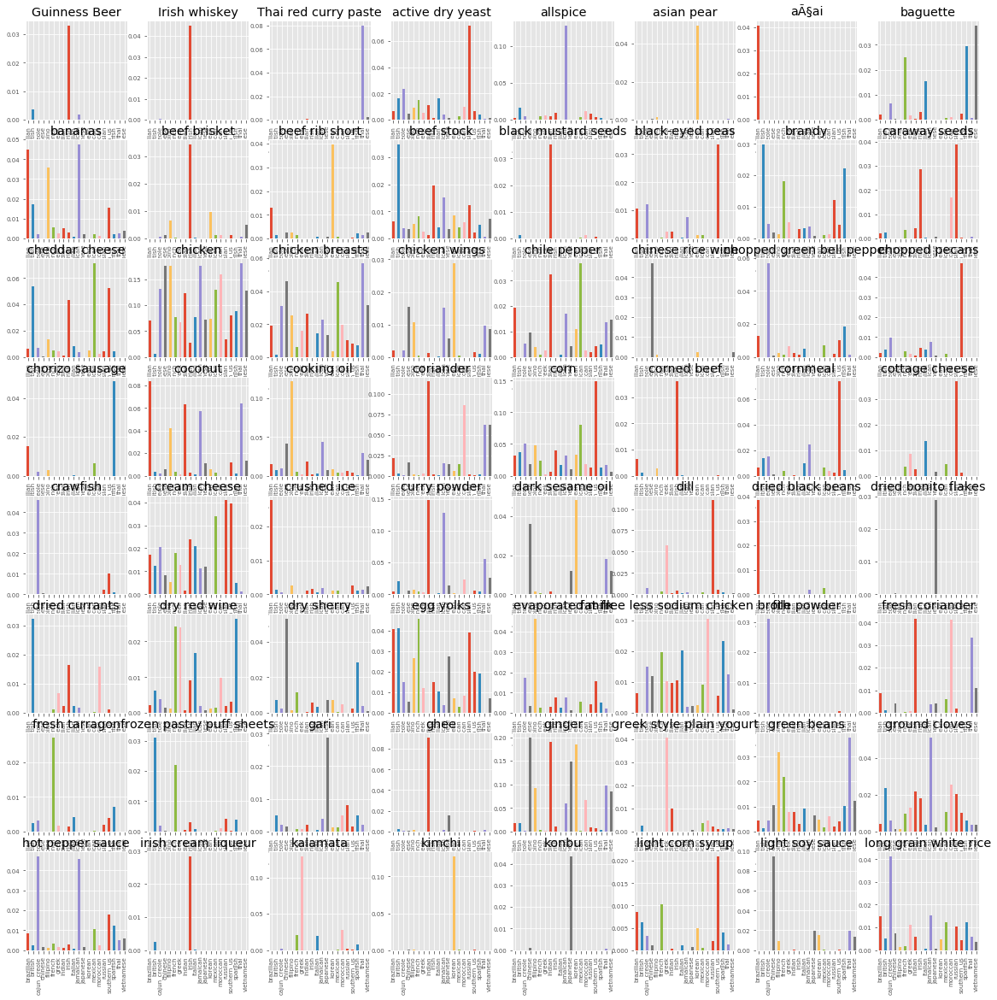

In [234]:
import numpy as np

unique = np.unique(top10.values.ravel())
trainDataModified['all_ingredients'] = trainDataModified['ingredients'].map(";".join)

fig, axes = plt.subplots(8, 8, figsize=(20, 20))
for ingredient, ax_index in zip(unique, range(64)):
    indices = trainDataModified['all_ingredients'].str.contains(ingredient)
    relative_freq = (trainDataModified[indices]['cuisine'].value_counts() / trainDataModified['cuisine'].value_counts())
    relative_freq.plot(kind='bar', ax=axes.ravel()[ax_index], fontsize=7, title=ingredient)

In [235]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

X_train_splitagain, X_test_splitagain, y_train_splitagain, y_test_splitagain = train_test_split(trainDataModified['all_ingredients'], trainDataModified['cuisine'], test_size=0.2, random_state=37)

In [236]:
cv = CountVectorizer()
X_train_vec = cv.fit_transform(X_train_splitagain.values)
X_test_vec = cv.transform(X_test_splitagain.values)
X_train_vec.shape

(31819, 2781)

In [237]:
print(list(cv.vocabulary_.keys())[:100])

['chipotles', 'in', 'adobo', 'instant', 'white', 'rice', 'red', 'beans', 'skinless', 'chicken', 'thighs', 'lime', 'zest', 'phyllo', 'dough', 'baby', 'spinach', 'long', 'grain', 'solid', 'tuna', 'sun', 'dried', 'tomatoes', 'oil', 'purple', 'onion', 'butter', 'shelled', 'pistachios', 'diced', 'juice', 'pitted', 'black', 'olives', 'wish', 'bone', 'guacamol', 'ranch', 'dress', 'torn', 'romain', 'lettuc', 'leav', 'panko', 'store', 'bought', 'low', 'sodium', 'broth', 'spaghetti', 'center', 'cut', 'bacon', 'fettuccine', 'fat', 'skimmed', 'peas', 'grated', 'nutmeg', 'cracker', 'crumbs', 'russet', 'potatoes', 'light', 'soy', 'sauce', 'gai', 'lan', 'pork', 'noodles', 'rump', 'roast', 'beef', 'bouillon', 'cottage', 'cheese', 'leaves', 'whole', 'wheat', 'flour', 'triple', 'sec', 'orange', 'cream', 'cocoa', 'powder', 'ground', 'cloves', 'pieces', 'pepper', 'malt', 'vinegar', 'thyme', 'sage', 'mint', 'nonfat', 'evaporated', 'milk', 'green']


In [ ]:
# we can see that the top 100 have slightly changed

In [238]:
#this is for the classification report y labels
cuisines = trainDataModified['cuisine'].value_counts(sort=False).index

#this is for the classification report y target_names
cuisineslist = cuisines.tolist()

In [239]:
from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression()
mylogistic_fit_modified = logistic.fit(X_train_vec, y_train_splitagain)

logistic.score(X_test_vec, y_test_splitagain)

0.569956002514142

Text(0.5,64.6,'Predicted label')

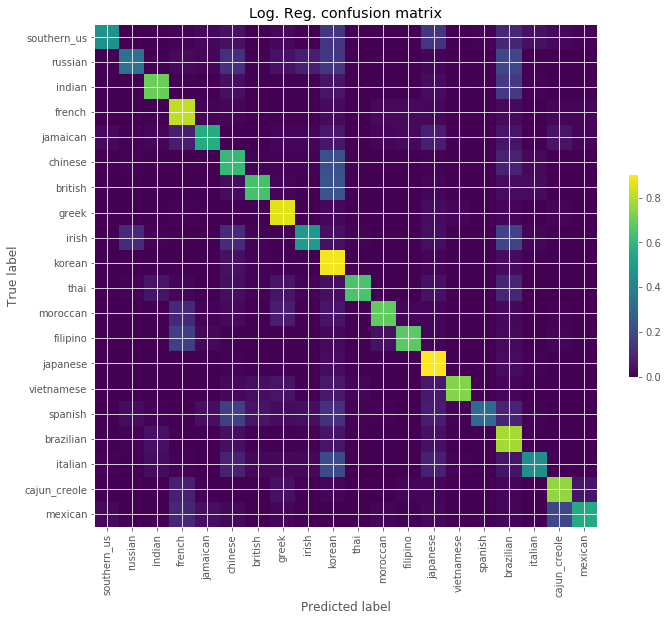

In [142]:
plt.figure(figsize=(10, 10))

log_cm = confusion_matrix(y_test_splitagain, logistic.predict(X_test_vec))
log_cm_normalized = log_cm.astype('float') / log_cm.sum(axis=1)[:, np.newaxis]

plt.imshow(log_cm_normalized, interpolation='nearest')
plt.title("Log. Reg. confusion matrix")
plt.colorbar(shrink=0.3)

tick_marks = np.arange(len(cuisines))
plt.xticks(tick_marks, cuisines, rotation=90)
plt.yticks(tick_marks, cuisines)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [143]:
log_pred = logistic.predict(X_test_vec)
print(classification_report(y_test_splitagain, log_pred, labels = cuisines, target_names=cuisineslist))

              precision    recall  f1-score   support

 southern_us       0.67      0.78      0.72       828
     russian       0.77      0.32      0.45       104
      indian       0.85      0.86      0.86       605
      french       0.58      0.61      0.59       508
    jamaican       0.87      0.65      0.75       117
     chinese       0.76      0.82      0.79       529
     british       0.64      0.34      0.45       184
       greek       0.76      0.64      0.70       229
       irish       0.60      0.49      0.54       121
      korean       0.79      0.68      0.73       165
        thai       0.78      0.76      0.77       292
    moroccan       0.81      0.74      0.77       152
    filipino       0.75      0.56      0.64       171
    japanese       0.85      0.69      0.76       276
  vietnamese       0.76      0.55      0.64       163
     spanish       0.62      0.45      0.52       201
   brazilian       0.71      0.46      0.56       102
     italian       0.76    